# Predicting Data Scientist Career Paths: Strategic Insights for Recruitment and Retention

## Team 5: Tanya Ortega | Graham Ward | Maria Mora

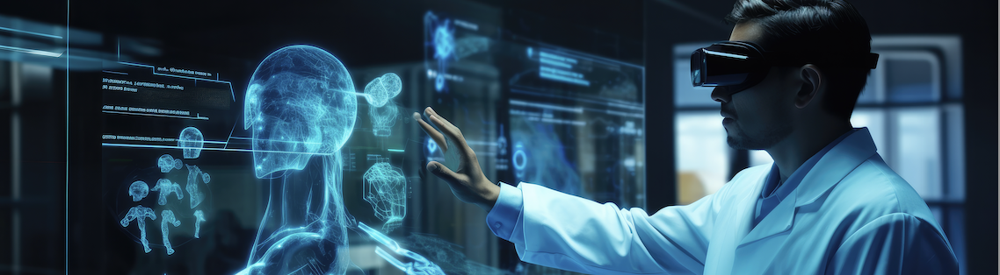

## 1. | Introduction

#### Business Understanding
A company which is active in Big Data and Data Science wants to hire data scientists among people who successfully pass some courses which conduct by the company. Many people signup for their training. Company wants to know which of these candidates are really wants to work for the company after training or looking for a new employment because it helps to reduce the cost and time as well as the quality of training or planning the courses and categorization of candidates. Information related to demographics, education, experience are provided.

This dataset is designed to understand the factors that lead a person to leave current job for HR researches too. By model(s) that uses the current credentials, demographics, experience data we will predict the probability of a candidate to look for a new job or will work for the company, as well as interpreting affected factors on employee decision.

#### Features
enrollee_id : Unique ID for candidate.

city: City code.

city_ development _index : Developement index of the city (scaled).

gender: Gender of candidate

relevent_experience: Relevant experience of candidate

enrolled_university: Type of University course enrolled if any

education_level: Education level of candidate

major_discipline :Education major discipline of candidate

experience: Candidate total experience in years

company_size: No of employees in current employer's company

company_type : Type of current employer

last_new_job: Difference in years between previous job and current job

training_hours: training hours completed

target: 0 – Not looking for job change, 1 – Looking for a job change


Data source: https://www.kaggle.com/datasets/arashnic/hr-analytics-job-change-of-data-scientists


#### Objectives and Motivations
In this project we aim to:

- Predict the probability of a candidate will work for the company.

- Interpret and evaluate the model(s) such a way that illustrate which features affect candidate decision and assess the accuracy of the model

#### Machine Learning Models
- CART Model Construction
- C5.0 Model Construction
- Naive Bayes Model Construction
- Neural Network Model Construction
- Logistic Regression Model Construction
- Random Forest Model Construction

## 2. | Importing Libraries

In [1]:
# --- Installing Libraries ---
#!pip install ydata-profiling
#!pip install pywaffle
#!pip install highlight-text
#!pip install ipywidgets
#!pip install colorama
#!pip install matplot
#!pip install yellowbrick
#!pip install scikit-learn
#!pip install plotly.express

In [2]:
#%matplotlib inline
#%matplotlib notebook  # For interactive plots in notebooks

In [3]:
# Define clr with attributes start and end
class Clr:
    start = '\033[1m'  # Bold text start
    end = '\033[0m'    # Bold text end
    color = '\033[94m' # Blue color text start

clr = Clr()

In [4]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)


In [5]:
# --- Importing Libraries ---
import numpy as np
import pandas as pd
import ydata_profiling
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import warnings
import os
import yellowbrick
import ipywidgets
import sklearn
import pywaffle
import highlight_text
import plotly.express as px
import statsmodels.api as sm
warnings.filterwarnings("ignore")

In [6]:
from ydata_profiling import ProfileReport
from pywaffle import Waffle
from PIL import Image
from highlight_text import fig_text
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import LabelEncoder, StandardScaler
from yellowbrick.classifier import ConfusionMatrix, ROCAUC, PrecisionRecallCurve
from yellowbrick.model_selection import LearningCurve, FeatureImportances
from yellowbrick.contrib.wrapper import wrap
from yellowbrick.style import set_palette
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.naive_bayes import GaussianNB
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier
from imblearn.over_sampling import SMOTE
from sklearn.exceptions import ConvergenceWarning
from scipy import stats
warnings.filterwarnings("ignore", category=ConvergenceWarning)

## 3. | Importing Training and Testing

In [7]:
# --- Importing Datasets ---
df_train = pd.read_csv('/Users/mariamoramora/Downloads/FP/aug_train.csv')
df_test = pd.read_csv('/Users/mariamoramora/Downloads/FP/aug_test.csv')

# --- Reading Train Dataset ---
print(clr.start+'.: Train Dataset :.'+clr.end)
print(clr.color+'*' * 21)

# --- Viewing Train Dataset ---
# Reset index to avoid showing index column
df_train_reset = df_train.head().reset_index(drop=True)

# Viewing styled DataFrame in Jupyter Notebook
# Use 'hide_index' to hide index when displaying DataFrame
df_train.head().style.background_gradient(cmap='Blues').set_table_styles(
     [{'selector': 'thead th:nth-of-type(1)',
      'props': 'display:none;'},  # Hide the index header
     {'selector': 'tbody th',
      'props': 'display:none;'},   # Hide the index column cells
     {'selector': 'td',
      'props': 'text-align: center;'},  # Center-align cell content
     {'selector': 'th',
      'props': 'text-align: center;'}    # Center-align header content
    ]
)




.: Train Dataset :.
*********************


,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,8949,city_103,0.920000,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,nan,nan,1,36,1.000000
1,29725,city_40,0.776000,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,>4,47,0.000000
2,11561,city_21,0.624000,nan,No relevent experience,Full time course,Graduate,STEM,5,nan,nan,never,83,0.000000
3,33241,city_115,0.789000,nan,No relevent experience,nan,Graduate,Business Degree,<1,nan,Pvt Ltd,never,52,1.000000
4,666,city_162,0.767000,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,4,8,0.000000


In [8]:
# --- Reading Test Dataset ---
print(clr.start+'.: Test Dataset :.'+clr.end)
print(clr.color+'*' * 20)

# --- Viewing Train Dataset ---
# Reset index to avoid showing index column
df_train_reset = df_train.head().reset_index(drop=True)

# Viewing styled DataFrame in Jupyter Notebook
# Use 'hide_index' to hide index when displaying DataFrame
df_test.head().style.background_gradient(cmap='YlOrBr').set_table_styles(
     [{'selector': 'thead th:nth-of-type(1)',
      'props': 'display:none;'},  # Hide the index header
     {'selector': 'tbody th',
      'props': 'display:none;'},   # Hide the index column cells
     {'selector': 'td',
      'props': 'text-align: center;'},  # Center-align cell content
     {'selector': 'th',
      'props': 'text-align: center;'}    # Center-align header content
    ]
)

.: Test Dataset :.
********************


,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,32403,city_41,0.827000,Male,Has relevent experience,Full time course,Graduate,STEM,9,<10,nan,1,21
1,9858,city_103,0.920000,Female,Has relevent experience,no_enrollment,Graduate,STEM,5,nan,Pvt Ltd,1,98
2,31806,city_21,0.624000,Male,No relevent experience,no_enrollment,High School,nan,<1,nan,Pvt Ltd,never,15
3,27385,city_13,0.827000,Male,Has relevent experience,no_enrollment,Masters,STEM,11,10/49,Pvt Ltd,1,39
4,27724,city_103,0.920000,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,10000+,Pvt Ltd,>4,72


## 4. | Data Profiling

### 4.1 | Data Profiling Training

In [9]:
# --- Train Dataset Report ---
ProfileReport(df_train, title='Train Dataset', minimal=True, progress_bar=False, samples=None, correlations=None,interactions=None, explorative=True, dark_mode=True, notebook={'iframe':{'height': '600px'}}, html={'style':{'primary_color': '#219EBC'}}, missing_diagrams={'heatmap': False, 'dendrogram': False}).to_notebook_iframe()

### 4.2 | Data Profiling Testing

In [10]:
# --- Test Dataset Report ---
ProfileReport(df_test, title='Test Dataset', minimal=True, progress_bar=False, samples=None, correlations=None,interactions=None, explorative=True, dark_mode=True, notebook={'iframe':{'height': '600px'}}, html={'style':{'primary_color': '#219EBC'}}, missing_diagrams={'heatmap': False, 'dendrogram': False}).to_notebook_iframe()

## 5. | Clean, wrangle, and handle missing data - imputation

In [11]:
# Add the target column to df_test with value 3
df_test['target'] = 3

# Optionally, you might want to ensure the columns of df_train and df_test match
# Here, we assume df_train already has a 'target' column, and we are adding it to df_test.

# Append df_test to df_train
df_combined = pd.concat([df_train, df_test], ignore_index=True)

# Optionally, reset the index after concatenation
df_combined.reset_index(drop=True, inplace=True)

# Save the combined DataFrame to a new CSV file (if needed)
# df_combined.to_csv('path_to_combined_data.csv', index=False)

print(df_combined.head())

   enrollee_id      city  city_development_index gender  \
0         8949  city_103                   0.920   Male   
1        29725   city_40                   0.776   Male   
2        11561   city_21                   0.624    NaN   
3        33241  city_115                   0.789    NaN   
4          666  city_162                   0.767   Male   

       relevent_experience enrolled_university education_level  \
0  Has relevent experience       no_enrollment        Graduate   
1   No relevent experience       no_enrollment        Graduate   
2   No relevent experience    Full time course        Graduate   
3   No relevent experience                 NaN        Graduate   
4  Has relevent experience       no_enrollment         Masters   

  major_discipline experience company_size    company_type last_new_job  \
0             STEM        >20          NaN             NaN            1   
1             STEM         15        50-99         Pvt Ltd           >4   
2             STEM     

In [12]:
# Get the initial shape of the data frame
print(df_combined.shape)

(21287, 14)


In [13]:
# Get the data types of the columns
print(df_combined.dtypes)

enrollee_id                 int64
city                       object
city_development_index    float64
gender                     object
relevent_experience        object
enrolled_university        object
education_level            object
major_discipline           object
experience                 object
company_size               object
company_type               object
last_new_job               object
training_hours              int64
target                    float64
dtype: object


In [14]:
# Identifying the missing values
print(df_combined.isnull().sum())

enrollee_id                  0
city                         0
city_development_index       0
gender                    5016
relevent_experience          0
enrolled_university        417
education_level            512
major_discipline          3125
experience                  70
company_size              6560
company_type              6774
last_new_job               463
training_hours               0
target                       0
dtype: int64


In [15]:
# Get unique counts of gender column
print(df_combined['gender'].value_counts(), '\n')
# Get unique items in enrolled_university column
print(df_combined['enrolled_university'].value_counts(), '\n')
# Get unique items in education_level column
print(df_combined['education_level'].value_counts(), '\n')
# Get unique items in major_discipline column
print(df_combined['major_discipline'].value_counts(), '\n')
# Get unique items in experience column
print(df_combined['experience'].value_counts(), '\n')
# Get unique items in company_size column
print(df_combined['company_size'].value_counts(), '\n')
# Get unique items in company_type column
print(df_combined['company_type'].value_counts(), '\n')
# Get unique items in last_new_job column
print(df_combined['last_new_job'].value_counts())

gender
Male      14681
Female     1375
Other       215
Name: count, dtype: int64 

enrolled_university
no_enrollment       15336
Full time course     4192
Part time course     1342
Name: count, dtype: int64 

education_level
Graduate          12867
Masters            4857
High School        2239
Phd                 468
Primary School      344
Name: count, dtype: int64 

major_discipline
STEM               16113
Humanities           749
Other                421
Business Degree      364
Arts                 270
No Major             245
Name: count, dtype: int64 

experience
>20    3669
5      1593
4      1548
3      1508
6      1346
2      1255
7      1144
9      1093
10     1081
8       884
11      750
15      745
14      641
1       605
<1      596
16      576
12      546
13      453
17      378
19      333
18      306
20      167
Name: count, dtype: int64 

company_size
50-99        3421
100-500      2889
10000+       2236
10/49        1643
<10          1471
1000-4999    1471
500-999 

In [16]:
# create a data frame that will be cleaned missing values
cleaned_df = df_combined.copy()

# Drop missing gender values
cleaned_df.dropna(subset=['gender'], inplace=True)
# Impute missing of enrolled_university column using mode
cleaned_df['enrolled_university'].fillna(cleaned_df['enrolled_university'].mode()[0], inplace=True)
# impute the missing values of education_level column using mode
cleaned_df['education_level'].fillna(cleaned_df['education_level'].mode()[0], inplace=True)
# impute the missing values of major_discipline column using mode
cleaned_df['major_discipline'].fillna(cleaned_df['major_discipline'].mode()[0], inplace=True)
# Drop the missing values of experience column
cleaned_df.dropna(subset=['experience'], inplace=True)
# impute the missing values of company_size column using XXXXXXXXX
cleaned_df.dropna(subset=['company_size'], inplace=True)
# impute the missing values of company_type column using XXXXXXXXX
cleaned_df.dropna(subset=['company_type'], inplace=True)
# Drop the missing values of last_new_job column
cleaned_df.dropna(subset=['last_new_job'], inplace=True)
# Get the shape of the cleaned data frame
print(cleaned_df.shape)
print(cleaned_df.isnull().sum())

(10890, 14)
enrollee_id               0
city                      0
city_development_index    0
gender                    0
relevent_experience       0
enrolled_university       0
education_level           0
major_discipline          0
experience                0
company_size              0
company_type              0
last_new_job              0
training_hours            0
target                    0
dtype: int64


## 6. | EDA

In [17]:
# Example DataFrames (Replace these with your actual DataFrames)
# df_combined = pd.read_csv('path_to_combined_data.csv')

# Separate the test set (where target == 3)
df_test = cleaned_df[cleaned_df['target'] == 3]

# Remove the target column from the test set
df_test = df_test.drop(columns=['target'])

# Separate the train set (where target != 3)
df_train = cleaned_df[cleaned_df['target'] != 3]

# Optionally, reset the index for both DataFrames
df_test.reset_index(drop=True, inplace=True)
df_train.reset_index(drop=True, inplace=True)

# Save the separate DataFrames to CSV files (if needed)
# df_train.to_csv('path_to_train_data.csv', index=False)
# df_test.to_csv('path_to_test_data.csv', index=False)

print("Training Set:")
print(df_train.head())

print("Test Set:")
print(df_test.head())
df_train

Training Set:
   enrollee_id      city  city_development_index gender  \
0        29725   city_40                   0.776   Male   
1          666  city_162                   0.767   Male   
2        28806  city_160                   0.920   Male   
3          402   city_46                   0.762   Male   
4        27107  city_103                   0.920   Male   

       relevent_experience enrolled_university education_level  \
0   No relevent experience       no_enrollment        Graduate   
1  Has relevent experience       no_enrollment         Masters   
2  Has relevent experience       no_enrollment     High School   
3  Has relevent experience       no_enrollment        Graduate   
4  Has relevent experience       no_enrollment        Graduate   

  major_discipline experience company_size    company_type last_new_job  \
0             STEM         15        50-99         Pvt Ltd           >4   
1             STEM        >20        50-99  Funded Startup            4   
2        

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,29725,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,>4,47,0.0
1,666,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,4,8,0.0
2,28806,city_160,0.920,Male,Has relevent experience,no_enrollment,High School,STEM,5,50-99,Funded Startup,1,24,0.0
3,402,city_46,0.762,Male,Has relevent experience,no_enrollment,Graduate,STEM,13,<10,Pvt Ltd,>4,18,1.0
4,27107,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,7,50-99,Pvt Ltd,1,46,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9754,251,city_103,0.920,Male,Has relevent experience,no_enrollment,Masters,STEM,9,50-99,Pvt Ltd,1,36,1.0
9755,32313,city_160,0.920,Female,Has relevent experience,no_enrollment,Graduate,STEM,10,100-500,Public Sector,3,23,0.0
9756,29754,city_103,0.920,Female,Has relevent experience,no_enrollment,Graduate,Humanities,7,10/49,Funded Startup,1,25,0.0
9757,24576,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,4,44,0.0


### 6.1 | Exploring target

1 = looking for new job

0 = not looking for new job

In [18]:
aug_train_dropped = df_train

In [19]:
df_train2=df_train

In [20]:
# Correct any misinterpretations
aug_train_dropped['company_size'] = aug_train_dropped['company_size'].replace('Oct-49', '10/49')

# Apply the company size mapping again
company_size_mapping = {
    '<10': 'Less than 10',
    '10/49': '10 to 49',
    '50-99': '50 to 99',
    '100-500': '100 to 500',
    '500-999': '500 to 999',
    '1000-4999': '1000 to 4999',
    '5000-9999': '5000 to 9999',
    '10000+': '10000 or more'
}

aug_train_dropped['company_size'] = aug_train_dropped['company_size'].replace(company_size_mapping)

In [21]:
aug_train_dropped

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,29725,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50 to 99,Pvt Ltd,>4,47,0.0
1,666,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50 to 99,Funded Startup,4,8,0.0
2,28806,city_160,0.920,Male,Has relevent experience,no_enrollment,High School,STEM,5,50 to 99,Funded Startup,1,24,0.0
3,402,city_46,0.762,Male,Has relevent experience,no_enrollment,Graduate,STEM,13,Less than 10,Pvt Ltd,>4,18,1.0
4,27107,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,7,50 to 99,Pvt Ltd,1,46,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9754,251,city_103,0.920,Male,Has relevent experience,no_enrollment,Masters,STEM,9,50 to 99,Pvt Ltd,1,36,1.0
9755,32313,city_160,0.920,Female,Has relevent experience,no_enrollment,Graduate,STEM,10,100 to 500,Public Sector,3,23,0.0
9756,29754,city_103,0.920,Female,Has relevent experience,no_enrollment,Graduate,Humanities,7,10 to 49,Funded Startup,1,25,0.0
9757,24576,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50 to 99,Pvt Ltd,4,44,0.0


In [22]:
print(aug_train_dropped['company_size'].value_counts())
print(aug_train_dropped['target'].value_counts())

company_size
50 to 99         2189
100 to 500       1959
10000 or more    1531
10 to 49         1065
1000 to 4999     1004
Less than 10      957
500 to 999        632
5000 to 9999      422
Name: count, dtype: int64
target
0.0    8173
1.0    1586
Name: count, dtype: int64


In [23]:
aug_train_dropped['company_size']

0           50 to 99
1           50 to 99
2           50 to 99
3       Less than 10
4           50 to 99
            ...     
9754        50 to 99
9755      100 to 500
9756        10 to 49
9757        50 to 99
9758      500 to 999
Name: company_size, Length: 9759, dtype: object

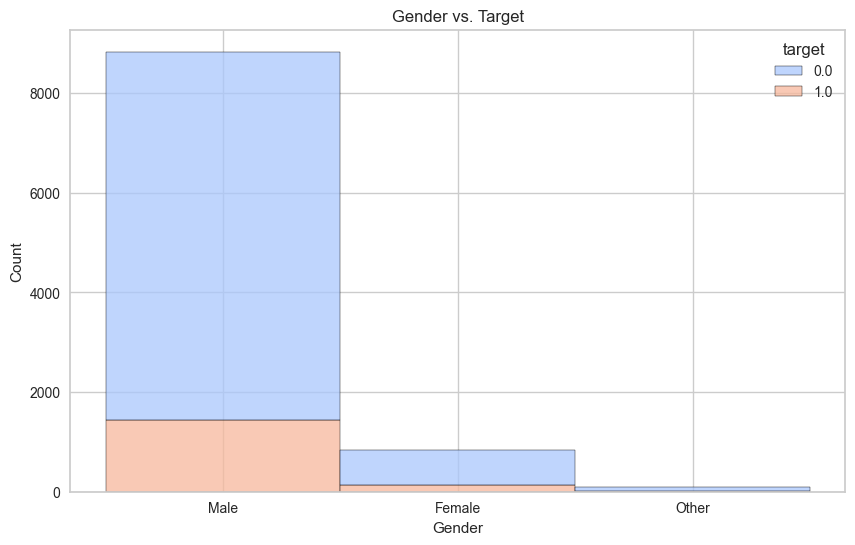

In [24]:
# Stacked bar plot: Gender vs. Target
%matplotlib inline
plt.figure(figsize=(10, 6))
sns.histplot(data=aug_train_dropped, x='gender', hue='target', multiple='stack', palette='coolwarm')
plt.title('Gender vs. Target')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

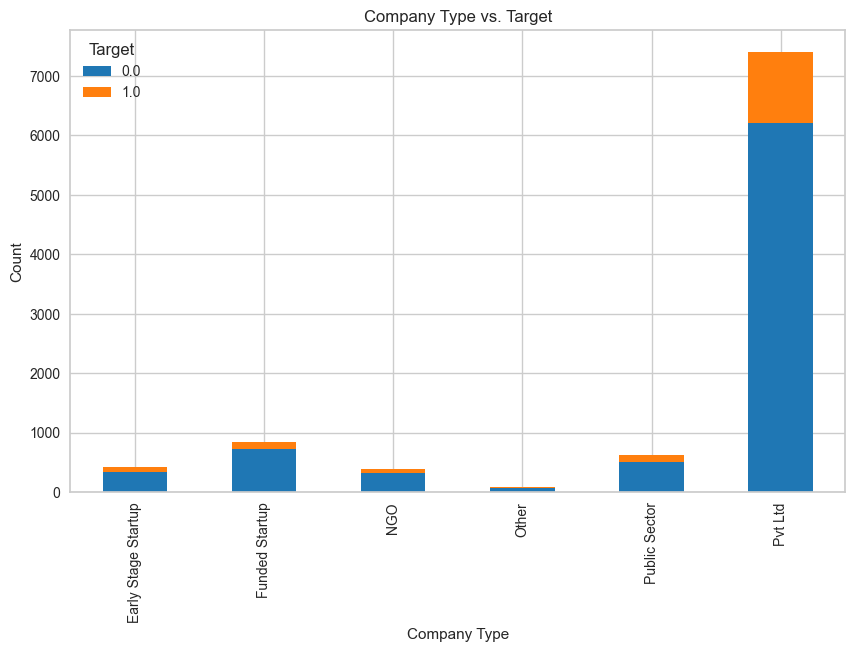

In [25]:
# Create a cross-tabulation of company_type and target
company_target_crosstab = pd.crosstab(aug_train_dropped['company_type'], aug_train_dropped['target'])

# Plot the stacked bar plot
company_target_crosstab.plot(kind='bar', stacked=True, figsize=(10, 6), color=['#1f77b4', '#ff7f0e'])
plt.title('Company Type vs. Target')
plt.xlabel('Company Type')
plt.ylabel('Count')
plt.legend(title='Target')
plt.show()

In [26]:
aug_train_dropped['company_size']

0           50 to 99
1           50 to 99
2           50 to 99
3       Less than 10
4           50 to 99
            ...     
9754        50 to 99
9755      100 to 500
9756        10 to 49
9757        50 to 99
9758      500 to 999
Name: company_size, Length: 9759, dtype: object

In [27]:
print(aug_train_dropped['company_size'].value_counts())
print(aug_train_dropped['target'].value_counts())

company_size
50 to 99         2189
100 to 500       1959
10000 or more    1531
10 to 49         1065
1000 to 4999     1004
Less than 10      957
500 to 999        632
5000 to 9999      422
Name: count, dtype: int64
target
0.0    8173
1.0    1586
Name: count, dtype: int64


In [28]:
aug_train_dropped['company_size']

0           50 to 99
1           50 to 99
2           50 to 99
3       Less than 10
4           50 to 99
            ...     
9754        50 to 99
9755      100 to 500
9756        10 to 49
9757        50 to 99
9758      500 to 999
Name: company_size, Length: 9759, dtype: object

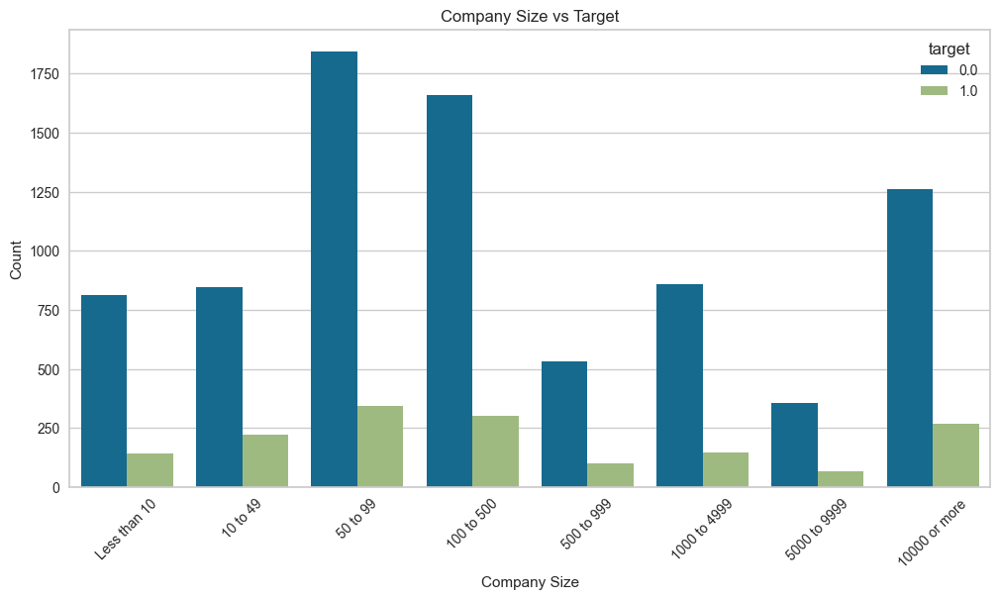

In [29]:
# Define the correct order for company size categories
#size_order = ['Less than 10', '10 to 49', '50 to 99', '100 to 500', '500 to 999', '1000 to 4999', '5000 to 9999', '10000 or more']
size_order = ['Less than 10', '10 to 49', '50 to 99', '100 to 500', '500 to 999', '1000 to 4999', '5000 to 9999', '10000 or more']

#aug_train_dropped['company_size'] = pd.Categorical(aug_train_dropped['company_size'], categories=size_order, ordered=True)

# Recreate the plots
# 1. Bar plot: Company Size vs. Target
plt.figure(figsize=(12, 6))
sns.countplot(x='company_size', hue='target', data=aug_train_dropped, order=size_order)
plt.title('Company Size vs Target')
plt.xlabel('Company Size')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

Index(['enrollee_id', 'city', 'city_development_index', 'gender',
       'relevent_experience', 'enrolled_university', 'education_level',
       'major_discipline', 'experience', 'company_size', 'company_type',
       'last_new_job', 'training_hours', 'target'],
      dtype='object')


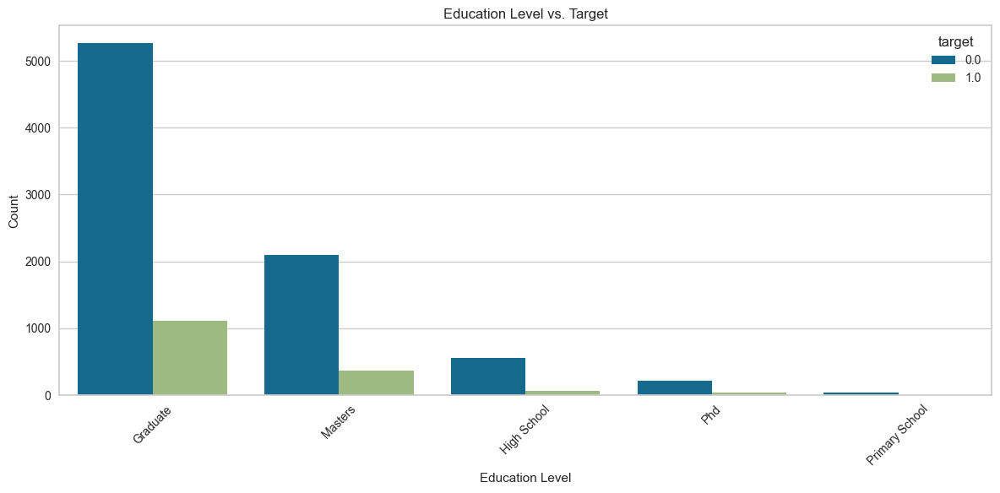

In [30]:
# Check if 'education_level' column exists
print(aug_train_dropped.columns)

# Create the bar plot
plt.figure(figsize=(12, 6))
sns.countplot(x='education_level', hue='target', data=aug_train_dropped)
plt.title('Education Level vs. Target')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()  # Adjust layout to prevent clipping of tick labels
plt.show()


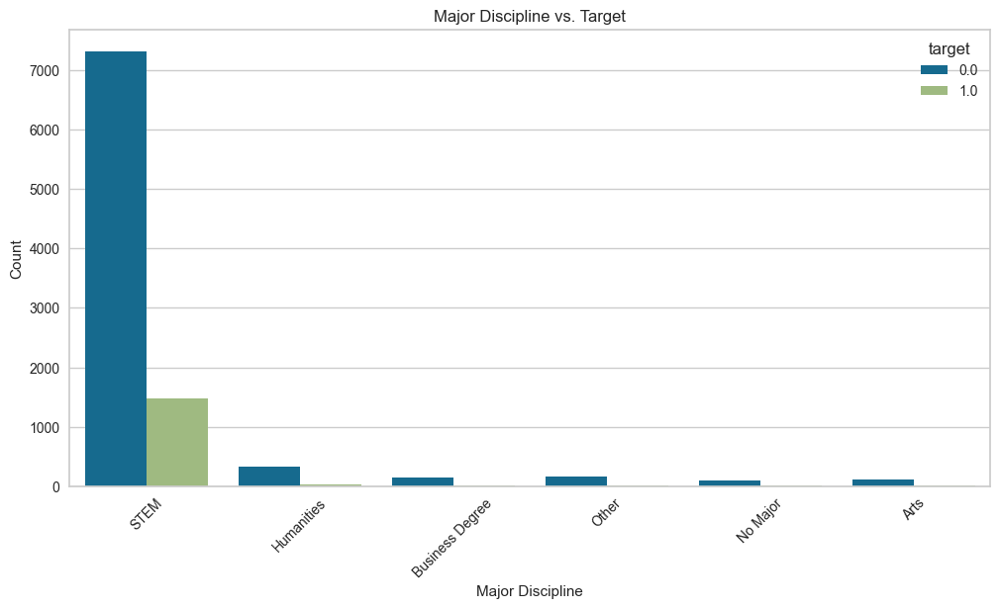

In [31]:
plt.figure(figsize=(12, 6))
sns.countplot(x='major_discipline', hue='target', data=aug_train_dropped)
plt.title('Major Discipline vs. Target')
plt.xlabel('Major Discipline')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

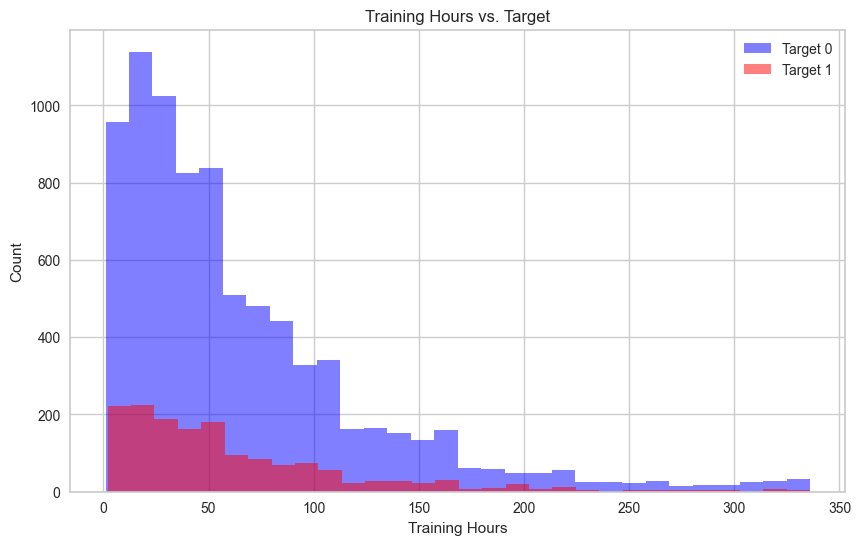

In [32]:
# Create bins for training_hours
bins = 30

# Create a figure
plt.figure(figsize=(10, 6))

# Plot the histogram for target=0
plt.hist(aug_train_dropped[aug_train_dropped['target'] == 0]['training_hours'], bins=bins, alpha=0.5, label='Target 0', color='blue')

# Plot the histogram for target=1
plt.hist(aug_train_dropped[aug_train_dropped['target'] == 1]['training_hours'], bins=bins, alpha=0.5, label='Target 1', color='red')

# Add titles and labels
plt.title('Training Hours vs. Target')
plt.xlabel('Training Hours')
plt.ylabel('Count')
plt.legend(loc='upper right')

# Show the plot
plt.show()

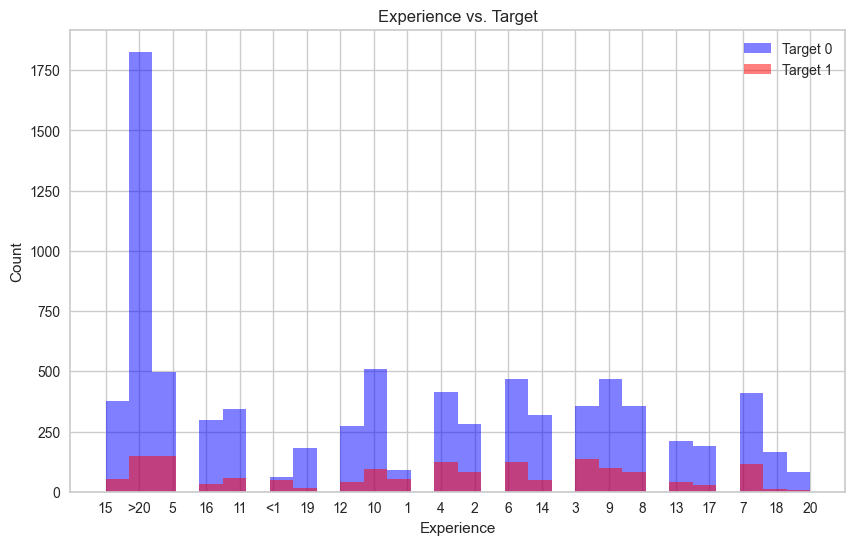

In [33]:
# Create bins for experience
bins = 30  # Adjust this number to change the number of bins

# Create a figure
plt.figure(figsize=(10, 6))

# Plot the histogram for target=0
plt.hist(aug_train_dropped[aug_train_dropped['target'] == 0]['experience'], bins=bins, alpha=0.5, label='Target 0', color='blue')

# Plot the histogram for target=1
plt.hist(aug_train_dropped[aug_train_dropped['target'] == 1]['experience'], bins=bins, alpha=0.5, label='Target 1', color='red')

# Add titles and labels
plt.title('Experience vs. Target')
plt.xlabel('Experience')
plt.ylabel('Count')
plt.legend(loc='upper right')

# Show the plot
plt.show()

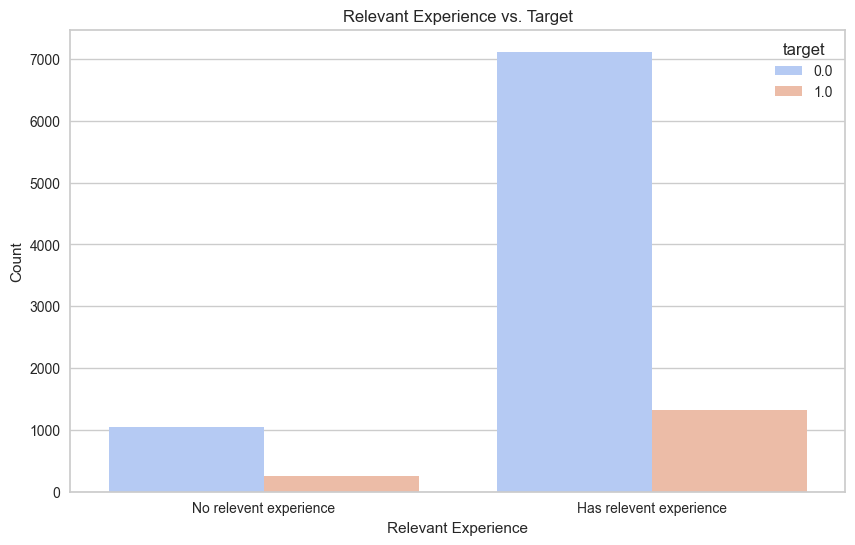

In [34]:
# Bar plot: Relevant Experience vs. Target
plt.figure(figsize=(10, 6))
sns.countplot(x='relevent_experience', hue='target', data=aug_train_dropped, palette='coolwarm')
plt.title('Relevant Experience vs. Target')
plt.xlabel('Relevant Experience')
plt.ylabel('Count')
plt.show()

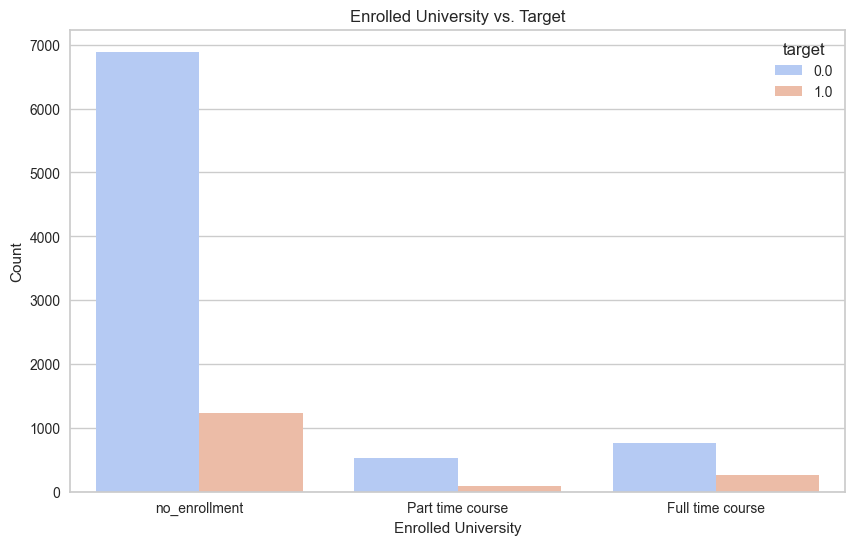

In [35]:
# Bar plot: Enrolled University vs. Target
plt.figure(figsize=(10, 6))
sns.countplot(x='enrolled_university', hue='target', data=aug_train_dropped, palette='coolwarm')
plt.title('Enrolled University vs. Target')
plt.xlabel('Enrolled University')
plt.ylabel('Count')
plt.show()

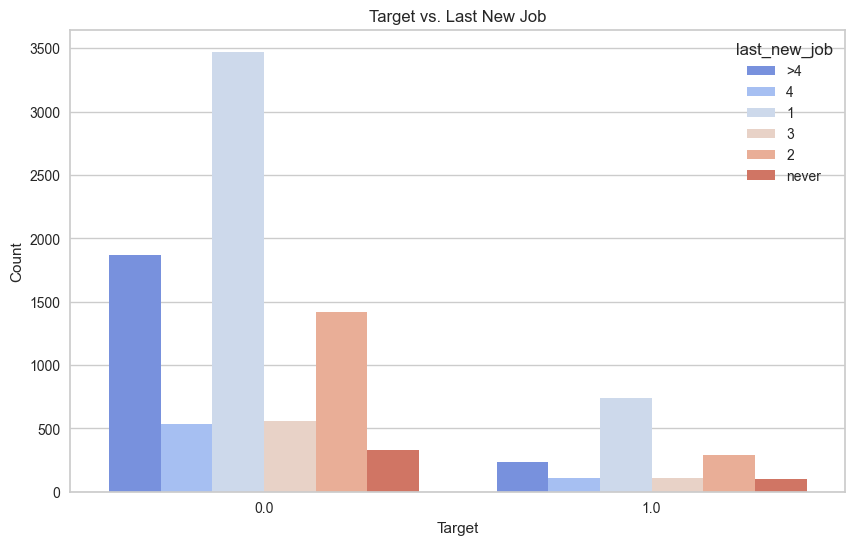

In [36]:
plt.figure(figsize=(10, 6))
sns.countplot(x='target', hue='last_new_job', data=aug_train_dropped, palette='coolwarm')
plt.title('Target vs. Last New Job')
plt.xlabel('Target')
plt.ylabel('Count')
plt.show()

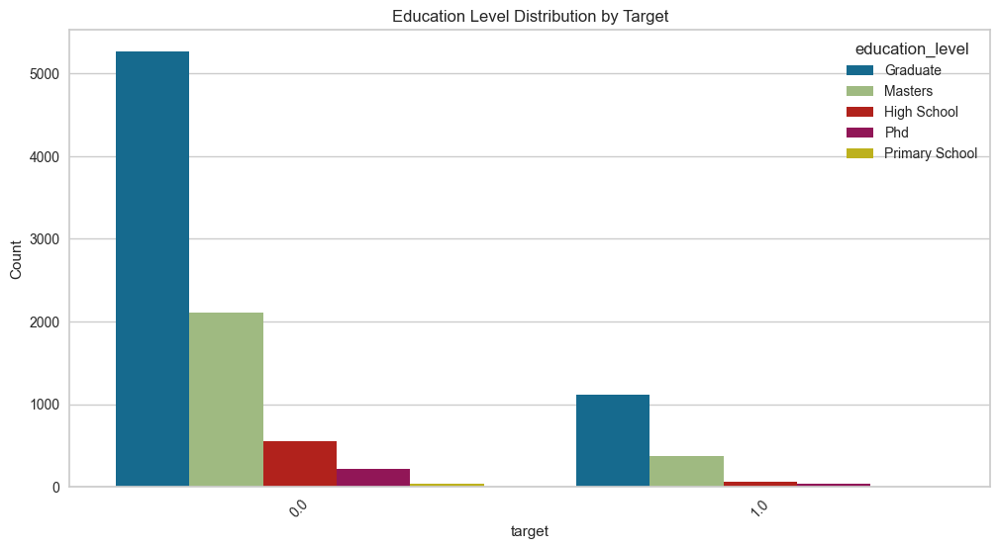

In [37]:
plt.figure(figsize=(12, 6))
sns.countplot(x='target', hue='education_level', data=aug_train_dropped)
plt.title('Education Level Distribution by Target')
plt.xlabel('target')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

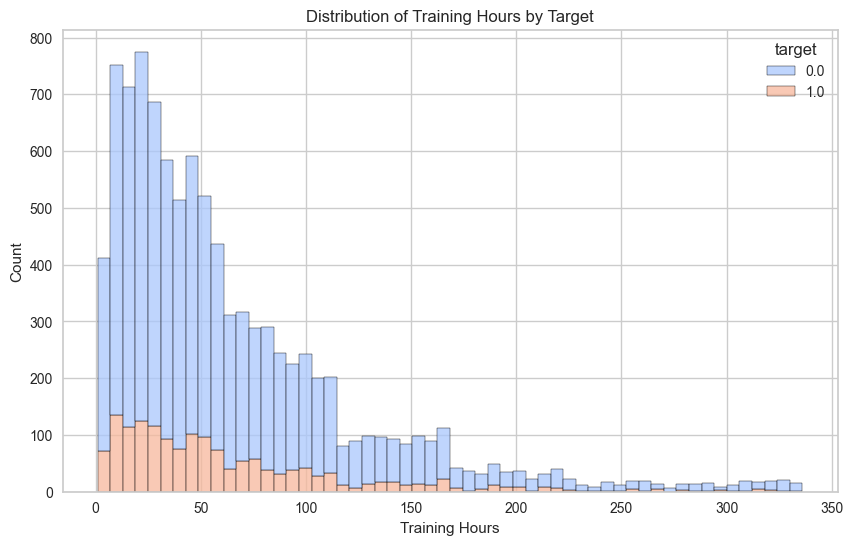

In [38]:
plt.figure(figsize=(10, 6))
sns.histplot(data=aug_train_dropped, x='training_hours', hue='target', multiple='stack', palette='coolwarm')
plt.title('Distribution of Training Hours by Target')
plt.xlabel('Training Hours')
plt.ylabel('Count')
plt.show()

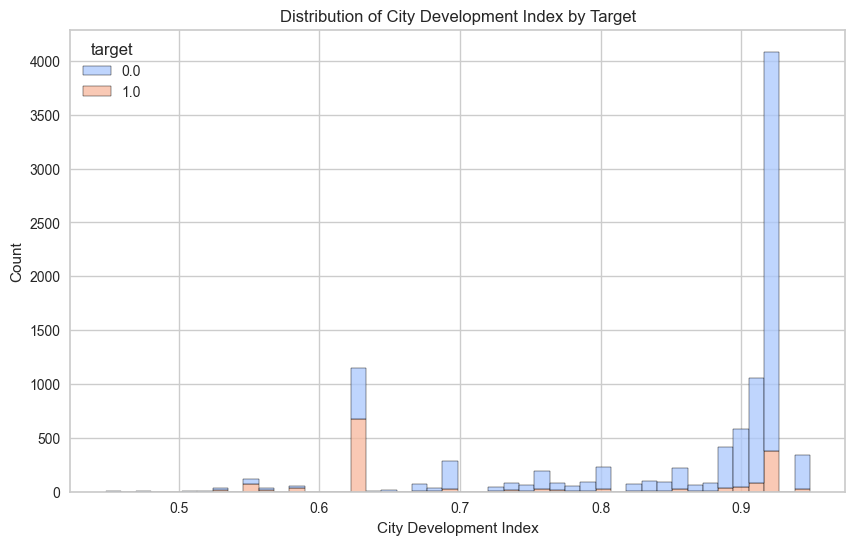

In [39]:
plt.figure(figsize=(10, 6))
sns.histplot(data=aug_train_dropped, x='city_development_index', hue='target', multiple='stack', palette='coolwarm')
plt.title('Distribution of City Development Index by Target')
plt.xlabel('City Development Index')
plt.ylabel('Count')
plt.show()

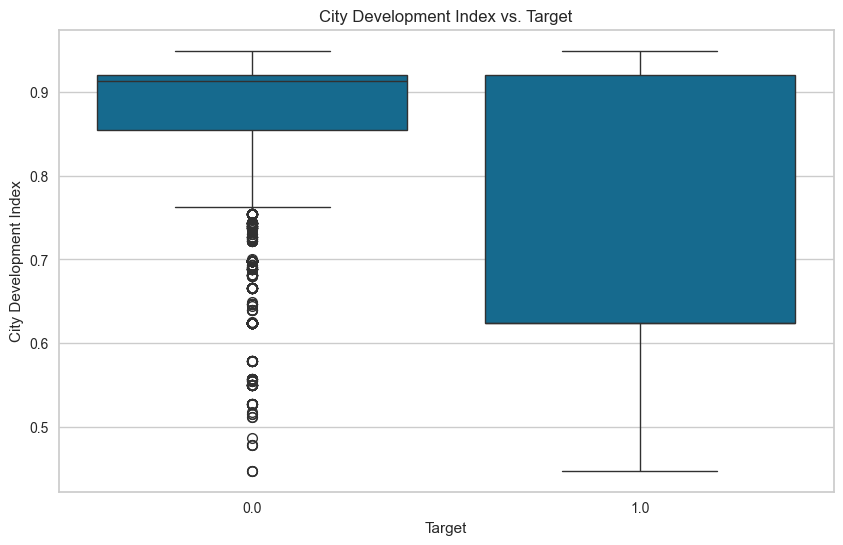

In [40]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='target', y='city_development_index', data=aug_train_dropped)
plt.title('City Development Index vs. Target')
plt.xlabel('Target')
plt.ylabel('City Development Index')
plt.show()

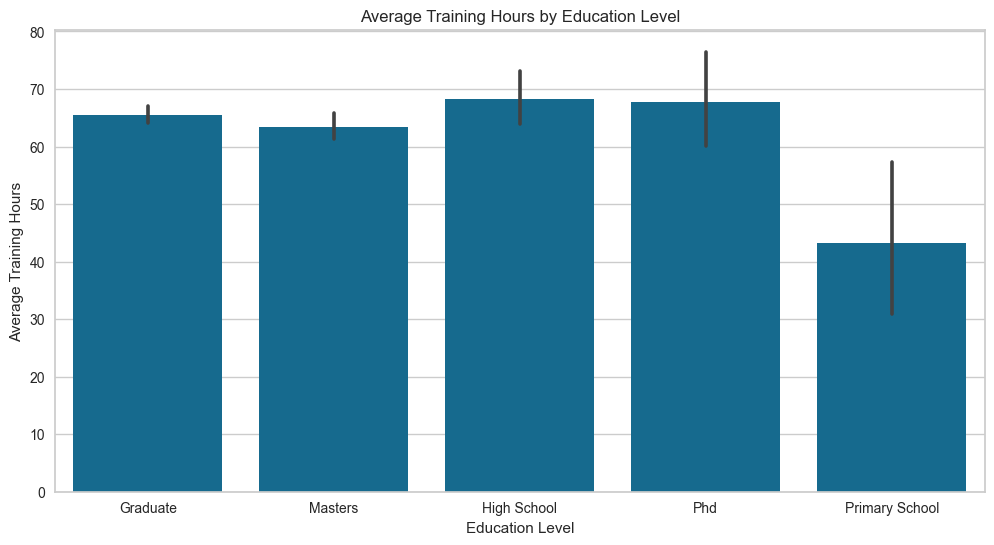

In [41]:
# Bar plot of average training hours by education level
plt.figure(figsize=(12, 6))
sns.barplot(x='education_level', y='training_hours', data=aug_train_dropped)
plt.title('Average Training Hours by Education Level')
plt.xlabel('Education Level')
plt.ylabel('Average Training Hours')
plt.show()

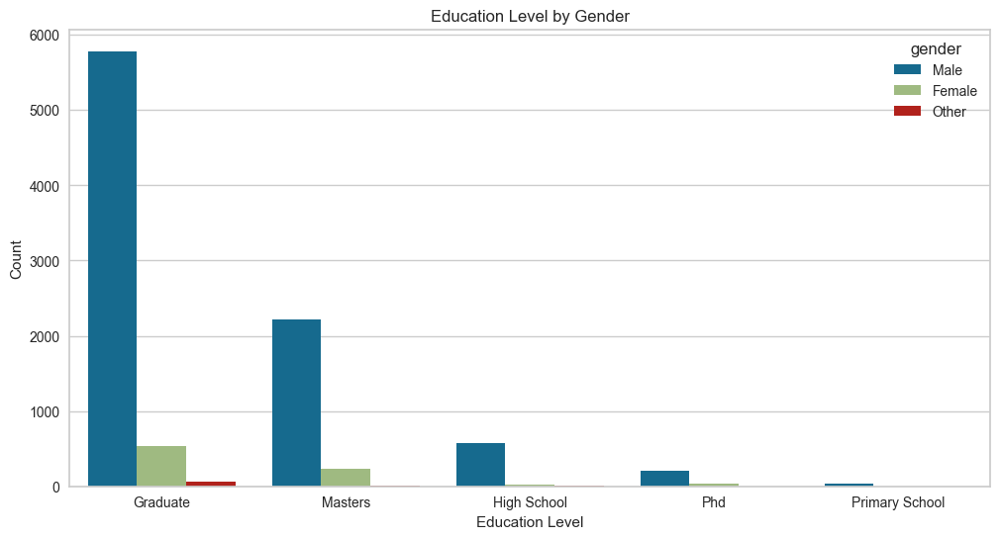

In [42]:
# Bar plot of education level by gender
plt.figure(figsize=(12, 6))
sns.countplot(x='education_level', hue='gender', data=aug_train_dropped)
plt.title('Education Level by Gender')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.show()

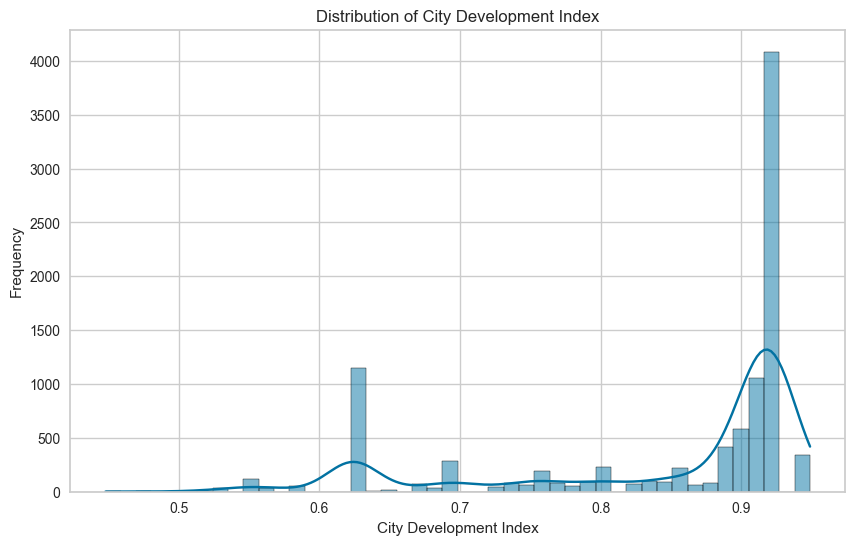

In [43]:
# Histogram for city development index
plt.figure(figsize=(10, 6))
sns.histplot(aug_train_dropped['city_development_index'], kde=True)
plt.title('Distribution of City Development Index')
plt.xlabel('City Development Index')
plt.ylabel('Frequency')
plt.show()

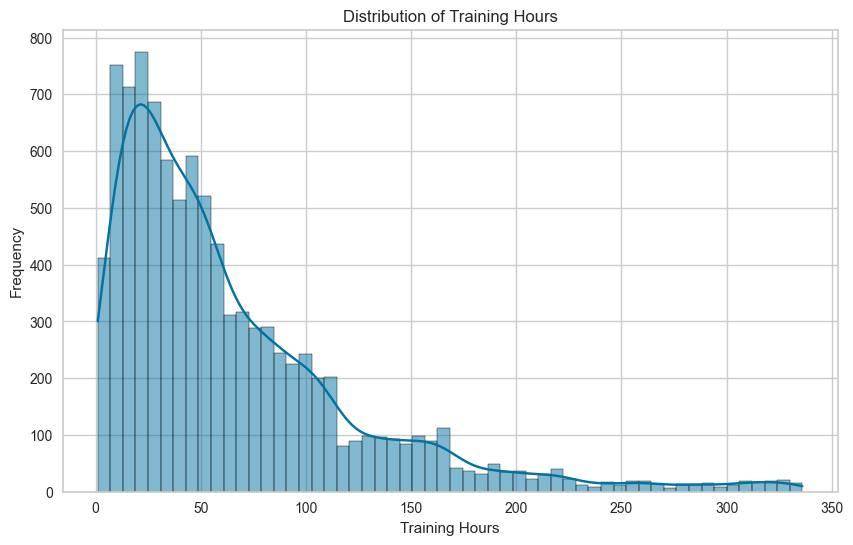

In [44]:
# Histogram for training hours
plt.figure(figsize=(10, 6))
sns.histplot(aug_train_dropped['training_hours'], kde=True)
plt.title('Distribution of Training Hours')
plt.xlabel('Training Hours')
plt.ylabel('Frequency')
plt.show()

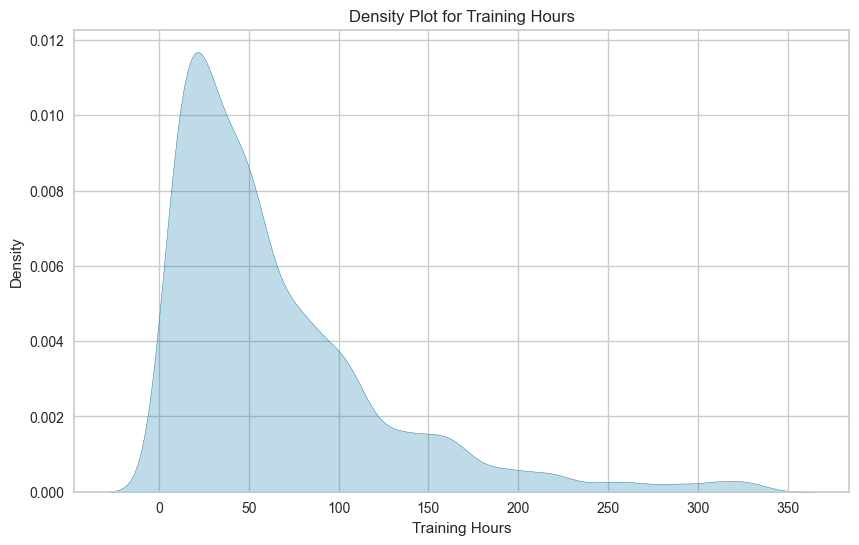

In [45]:
plt.figure(figsize=(10, 6))
sns.kdeplot(aug_train_dropped['training_hours'], shade=True)
plt.title('Density Plot for Training Hours')
plt.xlabel('Training Hours')
plt.ylabel('Density')
plt.show()

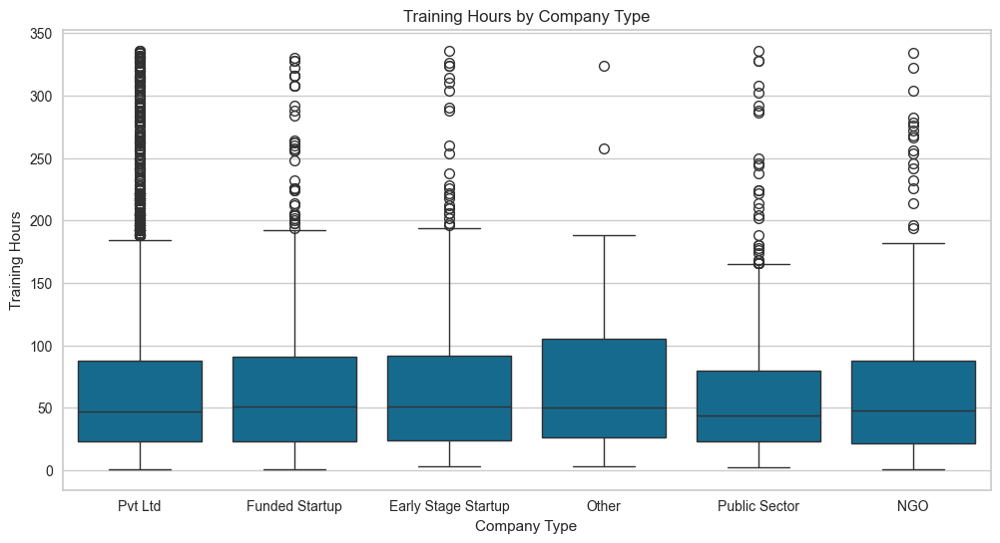

In [46]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='company_type', y='training_hours', data=aug_train_dropped)
plt.title('Training Hours by Company Type')
plt.xlabel('Company Type')
plt.ylabel('Training Hours')
plt.show()

### 6.2 | Explore Company Type

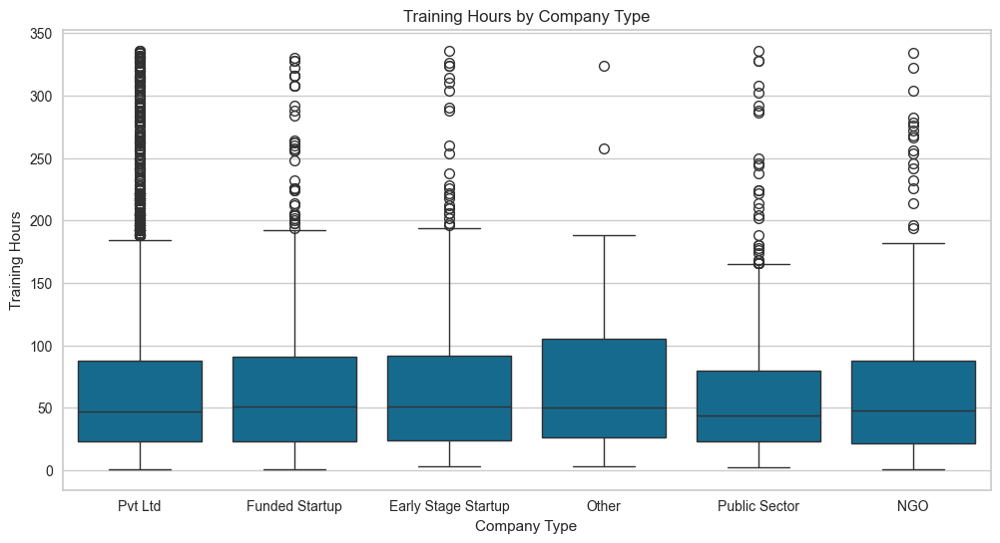

In [47]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='company_type', y='training_hours', data=aug_train_dropped)
plt.title('Training Hours by Company Type')
plt.xlabel('Company Type')
plt.ylabel('Training Hours')
plt.show()

### 6.3 | Explore Company Size

In [48]:
# 2. Box plot: Training Hours by Company Size
#plt.figure(figsize=(12, 6))
#sns.boxplot(x='company_size', y='training_hours', data=aug_train_dropped, order=size_order)
#plt.title('Training Hours by Company Size')
#plt.xlabel('Company Size')
#plt.ylabel('Training Hours')
#plt.xticks(rotation=45)
#plt.show()


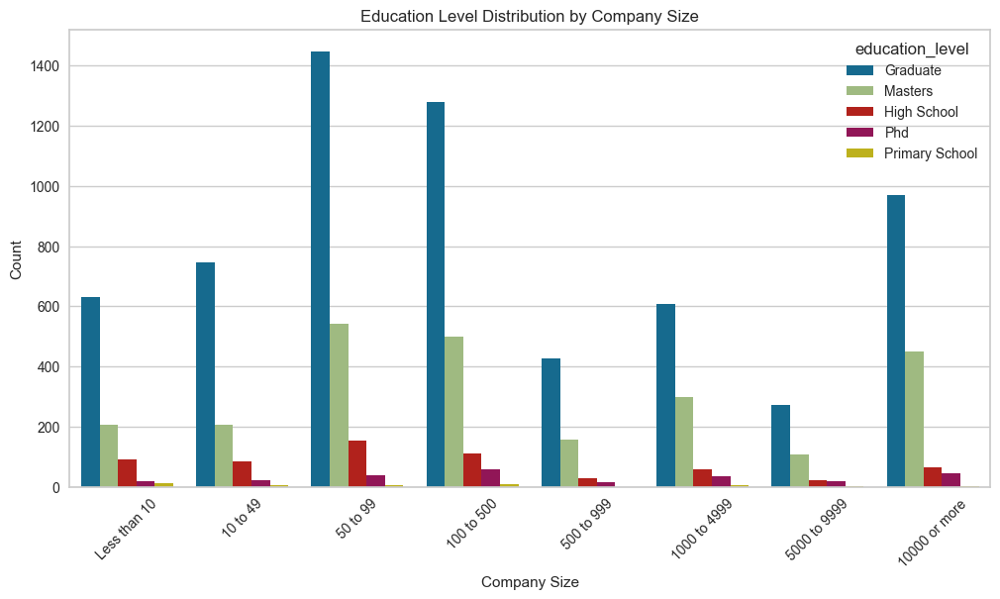

In [49]:
# 3. Count plot: Company Size vs. Education Level
plt.figure(figsize=(12, 6))
sns.countplot(x='company_size', hue='education_level', data=aug_train_dropped, order=size_order)
plt.title('Education Level Distribution by Company Size')
plt.xlabel('Company Size')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

## 7. | Data Pre - procesing

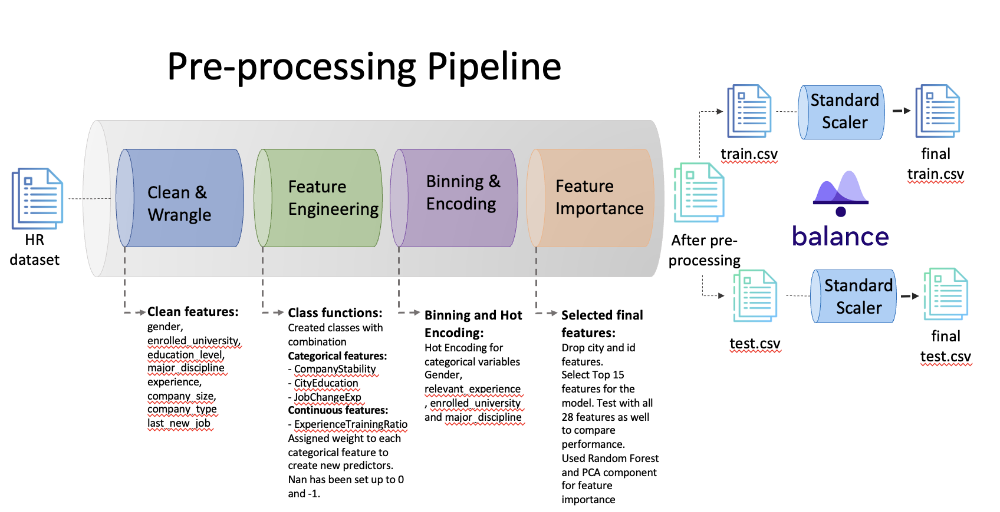

### 7.1 | Features Engineering

1. Experience and Training Metrics
Experience_per_Training_Hour: Create a feature that measures the ratio of experience to training hours. This can give an indication of how much experience is leveraged per unit of training.

In [50]:
# Define custom transformers
class ExperienceTrainingRatio(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X['experience'] = X['experience'].apply(lambda x: float(x.replace('>', '').replace('<', '0')) if isinstance(x, str) else x)
        X['Experience_per_Training_Hour'] = X['experience'] / (X['training_hours'] + 1)  # Adding 1 to avoid division by zero
        return X

2. Company Features
Company_Stability: Create a feature that reflects the stability or change of job in the company. For example, you could combine company_size and company_type into a single feature indicating company stability.

In [51]:
class CompanyStabilityFeature(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        size_mapping = {
            'nan': -1,
            '10/49': 1,
            '50-99': 2,
            '100-499': 3,
            '500-999': 4,
            '1000-4999': 5,
            '5000-9999': 6,
            '10000+': 7
        }
        X['company_size'] = X['company_size'].map(size_mapping).fillna(-1)
        
        company_type_mapping = {
            'nan': 0,
            'Pvt Ltd': 1,
            'Public Sector': 2,
            'Others': 3
        }
        X['company_type'] = X['company_type'].map(company_type_mapping).fillna(0)
        
        X['Company_Stability'] = X['company_size'] * X['company_type']
        return X

3. City and Education Metrics
City_Development_Education: Combine city_development_index and education_level to create a metric that reflects the development status adjusted by educational attainment.

In [52]:
class CityEducationMetric(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        education_level_mapping = {
            'PhD': 5,
            'Masters': 4,
            'Graduate': 3,
            'Undergraduate': 2,
            'High School': 1
        }
        X['education_level'] = X['education_level'].map(education_level_mapping).fillna(0)
        
        X['City_Development_Education'] = X['city_development_index'] * X['education_level']
        return X


4. Job Change and Experience
Job_Change_Experience: Create a feature that reflects how recent the last job change is, adjusted by experience. This feature may indicate the candidate's recentness in job changes and experience.

In [53]:
class JobChangeExperience(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X['last_new_job'] = X['last_new_job'].map({
            '1': 1,
            '2': 2,
            '3': 3,
            '4': 4,
            '>4': 5,
            'nan': 0
        }).fillna(0)

        X['Job_Change_Experience'] = X['last_new_job'] / (X['experience'] + 1)  # Adding 1 to avoid division by zero
        return X

In [54]:
# Define the preprocessing pipeline
preprocessor = Pipeline(steps=[
    ('experience_training_ratio', ExperienceTrainingRatio()),
    ('company_stability', CompanyStabilityFeature()),
    ('city_education', CityEducationMetric()),
    ('job_change_experience', JobChangeExperience())
])
# Apply transformations
df_combined_transformed = preprocessor.fit_transform(cleaned_df)
df_combined_transformed

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target,Experience_per_Training_Hour,Company_Stability,City_Development_Education,Job_Change_Experience
1,29725,city_40,0.776,Male,No relevent experience,no_enrollment,3.0,STEM,15.0,2.0,1.0,5.0,47,0.0,0.312500,2.0,2.328,0.312500
4,666,city_162,0.767,Male,Has relevent experience,no_enrollment,4.0,STEM,20.0,2.0,0.0,4.0,8,0.0,2.222222,0.0,3.068,0.190476
6,28806,city_160,0.920,Male,Has relevent experience,no_enrollment,1.0,STEM,5.0,2.0,0.0,1.0,24,0.0,0.200000,0.0,0.920,0.166667
7,402,city_46,0.762,Male,Has relevent experience,no_enrollment,3.0,STEM,13.0,-1.0,1.0,5.0,18,1.0,0.684211,-1.0,2.286,0.357143
8,27107,city_103,0.920,Male,Has relevent experience,no_enrollment,3.0,STEM,7.0,2.0,1.0,1.0,46,1.0,0.148936,2.0,2.760,0.125000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21274,31643,city_75,0.939,Male,Has relevent experience,no_enrollment,1.0,STEM,20.0,-1.0,2.0,2.0,58,3.0,0.338983,-2.0,0.939,0.095238
21275,21500,city_44,0.725,Male,No relevent experience,Part time course,3.0,STEM,7.0,-1.0,0.0,0.0,160,3.0,0.043478,-0.0,2.175,0.000000
21279,27163,city_173,0.878,Male,No relevent experience,no_enrollment,4.0,STEM,16.0,-1.0,1.0,5.0,58,3.0,0.271186,-1.0,3.512,0.294118
21285,7873,city_102,0.804,Male,Has relevent experience,Full time course,1.0,STEM,7.0,-1.0,2.0,1.0,84,3.0,0.082353,-2.0,0.804,0.125000


### 7.2 | Hot Encoding

In [55]:
# Convert the data into a DataFrame
df_combined_transformed = pd.DataFrame(df_combined_transformed)

# Perform one-hot encoding on specified columns
columns_to_encode = ["gender", "relevent_experience", "enrolled_university", "major_discipline"]
df_encoded = pd.get_dummies(df_combined_transformed, columns=columns_to_encode)

# Convert boolean columns to integers
df_encoded = df_encoded.applymap(lambda x: int(x) if isinstance(x, bool) else x)

# Display the encoded DataFrame
print(df_encoded)

       enrollee_id      city  city_development_index  education_level  \
1            29725   city_40                   0.776              3.0   
4              666  city_162                   0.767              4.0   
6            28806  city_160                   0.920              1.0   
7              402   city_46                   0.762              3.0   
8            27107  city_103                   0.920              3.0   
...            ...       ...                     ...              ...   
21274        31643   city_75                   0.939              1.0   
21275        21500   city_44                   0.725              3.0   
21279        27163  city_173                   0.878              4.0   
21285         7873  city_102                   0.804              1.0   
21286        12215  city_102                   0.804              4.0   

       experience  company_size  company_type  last_new_job  training_hours  \
1            15.0           2.0           1.

### 7.3 | Drop Unnecesary columns

In [56]:
# Remove the ID column
df_encoded = df_encoded.drop(columns=["enrollee_id"])

# Display the encoded DataFrame
print(df_encoded)

           city  city_development_index  education_level  experience  \
1       city_40                   0.776              3.0        15.0   
4      city_162                   0.767              4.0        20.0   
6      city_160                   0.920              1.0         5.0   
7       city_46                   0.762              3.0        13.0   
8      city_103                   0.920              3.0         7.0   
...         ...                     ...              ...         ...   
21274   city_75                   0.939              1.0        20.0   
21275   city_44                   0.725              3.0         7.0   
21279  city_173                   0.878              4.0        16.0   
21285  city_102                   0.804              1.0         7.0   
21286  city_102                   0.804              4.0        15.0   

       company_size  company_type  last_new_job  training_hours  target  \
1               2.0           1.0           5.0             

### 7.4 | Feature Importance

In [57]:
# Divide df_encoded in Train and Test

# Separate the test set (where target == 3)
df_test_encoded = df_encoded[df_encoded['target'] == 3]

# Remove the target column from the test set
#df_test_encoded = df_test.drop(columns=['target'])

# Separate the train set (where target != 3)
df_train_encoded = df_encoded[df_encoded['target'] != 3]

# Optionally, reset the index for both DataFrames
df_test_encoded.reset_index(drop=True, inplace=True)
df_train_encoded.reset_index(drop=True, inplace=True)

# Save the separate DataFrames to CSV files (if needed)
# df_train.to_csv('path_to_train_data.csv', index=False)
# df_test.to_csv('path_to_test_data.csv', index=False)

print("Training Set:")
print(df_train_encoded.head())





Training Set:
       city  city_development_index  education_level  experience  \
0   city_40                   0.776              3.0        15.0   
1  city_162                   0.767              4.0        20.0   
2  city_160                   0.920              1.0         5.0   
3   city_46                   0.762              3.0        13.0   
4  city_103                   0.920              3.0         7.0   

   company_size  company_type  last_new_job  training_hours  target  \
0           2.0           1.0           5.0              47     0.0   
1           2.0           0.0           4.0               8     0.0   
2           2.0           0.0           1.0              24     0.0   
3          -1.0           1.0           5.0              18     1.0   
4           2.0           1.0           1.0              46     1.0   

   Experience_per_Training_Hour  ...  \
0                      0.312500  ...   
1                      2.222222  ...   
2                      0.20000

#### 7.4.1 Using Random Forest

In [58]:
# Preprocess the 'city' column to remove 'city_' prefix and convert to numeric
df_train_encoded['city'] = df_train_encoded['city'].str.replace('city_', '').astype(int)


# Split the data into features (X) and target (y)
X = df_train_encoded.drop(columns=["target"])
y = df_train_encoded["target"]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest classifier
clf = RandomForestClassifier(random_state=42)

# Train the model
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Get feature importances
feature_importances = clf.feature_importances_

# Create a DataFrame for feature importances
importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

# Display the sorted feature importances
print(importance_df)


Accuracy: 0.86
                                        Feature  Importance
0                        city_development_index    0.164849
1                  Experience_per_Training_Hour    0.135192
2                                training_hours    0.125918
3                    City_Development_Education    0.097891
4                         Job_Change_Experience    0.080823
5                                    experience    0.073130
6                                          city    0.071610
7                             Company_Stability    0.051203
8                                  company_size    0.045819
9                                  last_new_job    0.036112
10                              education_level    0.023391
11                                 company_type    0.017197
12  relevent_experience_Has relevent experience    0.008862
13            enrolled_university_no_enrollment    0.008786
14         enrolled_university_Full time course    0.008583
15                       

#### 7.4.2 Baseline

In [59]:
# Assuming 'df_train_encoded' is your DataFrame with the target variable
target_counts = df_train_encoded['target'].value_counts()
target_percentages = (target_counts / len(df_train_encoded)) * 100

# Print the percentage of each class
print("Percentage of each class in the target variable:")
for label, percentage in target_percentages.items():
    print(f"Class {label} – {percentage:.2f}%")

# Define the class labels
class_labels = {0: 'Not looking for job change', 1: 'Looking for a job change'}

# Print the percentage with labels
print("Percentage of each class in the target variable:")
for label, percentage in target_percentages.items():
    print(f"{class_labels[label]}: {percentage:.2f}%")



Percentage of each class in the target variable:
Class 0.0 – 83.75%
Class 1.0 – 16.25%
Percentage of each class in the target variable:
Not looking for job change: 83.75%
Looking for a job change: 16.25%


Baseline Models for Binary Classification:
Let one of the binary target classes represent positive and the other class represent negative.

Let p represent the proportion of positive records in the data.

All Positive Model. Assign all predictions as positive.
The accuracy of this model will be p.
All Negative Model. Assign all predictions as negative.
The accuracy of this model will be 1–p.

    For example, in our HR scenario, p = 0.1625 or 16.25% "Looking for a job change" records, where we let "Looking for a job change" records represent positive. Then the All Positive Model will have accuracy 0.1625, and the All Negative Model will have accuracy 0.8375. Any model that we develop will need to beat this 83.75% accuracy to be considered useful.

#### 7.4.3 PCA

Explained variance by each principal component: [0.1132497  0.09038495]


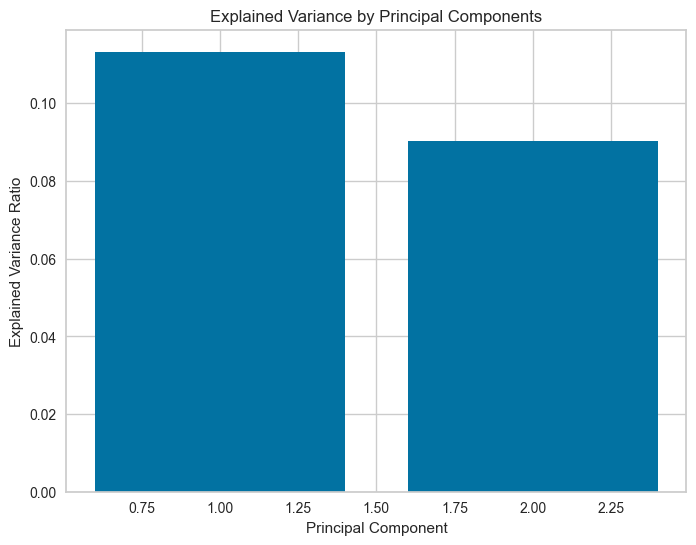

           PC1       PC2
0    -1.374185 -1.030870
1     2.441190  0.612533
2    -0.712058  1.758150
3     0.622713  1.269100
4     0.510241  0.624806
...        ...       ...
9754  1.317594  0.256512
9755  0.534424 -1.574274
9756  0.609525 -3.050586
9757  1.576693  0.189649
9758 -2.102610  0.706089

[9759 rows x 2 columns]


In [60]:
df_combined_transformed= df_train_encoded

# Remove the ID and target columns
df_features = df_combined_transformed.drop(columns=[ "target"])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_features)

# Perform PCA
pca = PCA(n_components=2)  # You can change the number of components
X_pca = pca.fit_transform(X_scaled)

# Create a DataFrame for the principal components
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])

# Display the explained variance by each principal component
explained_variance = pca.explained_variance_ratio_
print(f"Explained variance by each principal component: {explained_variance}")

# Plot the explained variance
plt.figure(figsize=(8, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Principal Components')
plt.show()

# Display the transformed dataset with principal components
print(df_pca)

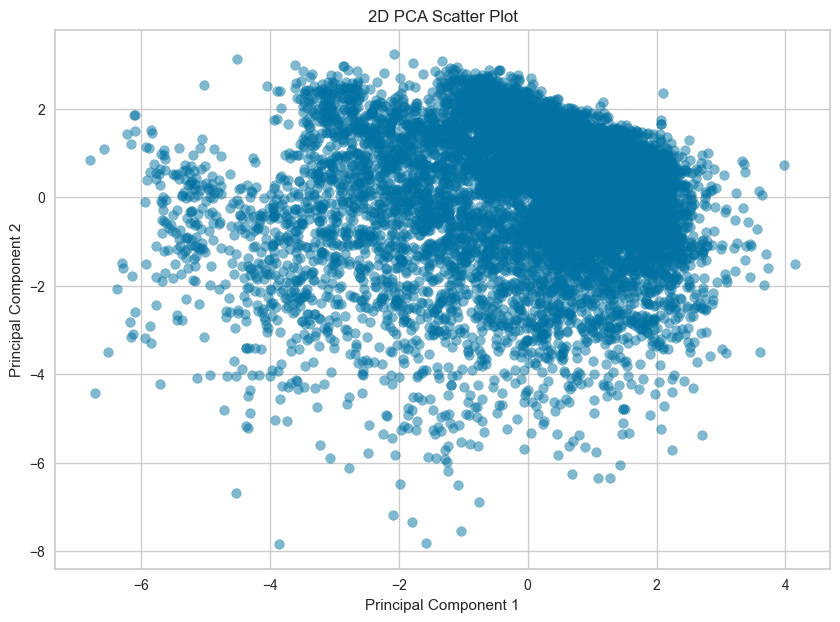

In [61]:
plt.figure(figsize=(10, 7))
plt.scatter(df_pca['PC1'], df_pca['PC2'], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA Scatter Plot')
plt.show()


In [62]:
# Example DataFrame 'df_features' and PCA components
# df_features = pd.DataFrame({...})  # Your feature DataFrame
# pca = PCA(n_components=2)  # Your PCA model

# Get the loadings (weights) of the original features on the principal components
loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2'], index=df_features.columns)

# Compute the absolute values of the loadings
abs_loadings = loadings.abs()

# Sort by the weights for each principal component
sorted_loadings = pd.concat([
    abs_loadings['PC1'].sort_values(ascending=False),
    abs_loadings['PC2'].sort_values(ascending=False)
], axis=1)

# Rename columns for clarity
sorted_loadings.columns = ['PC1 (sorted)', 'PC2 (sorted)']

print(sorted_loadings)


                                             PC1 (sorted)  PC2 (sorted)
enrolled_university_no_enrollment                0.398805      0.009508
relevent_experience_Has relevent experience      0.353153      0.291305
relevent_experience_No relevent experience       0.353153      0.291305
experience                                       0.349666      0.049660
enrolled_university_Full time course             0.343452      0.016289
City_Development_Education                       0.321203      0.207626
education_level                                  0.249694      0.114302
city_development_index                           0.203337      0.234004
Experience_per_Training_Hour                     0.189566      0.035457
enrolled_university_Part time course             0.180545      0.005891
last_new_job                                     0.167289      0.149204
Job_Change_Experience                            0.141206      0.123449
city                                             0.101753      0

In [63]:
# PCA Loadings DataFrame
pca_loadings = pd.DataFrame({
    'Feature': [
        'enrolled_university_no_enrollment', 'relevent_experience_Has relevent experience',
        'relevent_experience_No relevent experience', 'experience', 'enrolled_university_Full time course',
        'City_Development_Education', 'education_level', 'city_development_index',
        'Experience_per_Training_Hour', 'enrolled_university_Part time course', 'last_new_job',
        'Job_Change_Experience', 'city', 'gender_Male', 'major_discipline_STEM',
        'training_hours', 'gender_Other', 'gender_Female', 'major_discipline_Humanities',
        'company_size', 'major_discipline_Arts', 'company_type', 'major_discipline_No Major',
        'major_discipline_Business Degree', 'major_discipline_Other', 'Company_Stability'
    ],
    'PC1 (sorted)': [
        0.398805, 0.353153, 0.353153, 0.349666, 0.343452,
        0.321203, 0.249694, 0.203337, 0.189566, 0.180545,
        0.167289, 0.141206, 0.101753, 0.061120, 0.053337,
        0.049525, 0.048030, 0.047161, 0.041416, 0.026075,
        0.025284, 0.020528, 0.015096, 0.014475, 0.011603,
        0.005319
    ]
})

# Random Forest Importances DataFrame
rf_importances = pd.DataFrame({
    'Feature': [
        'city_development_index', 'Experience_per_Training_Hour', 'training_hours',
        'City_Development_Education', 'Job_Change_Experience', 'experience', 'city',
        'Company_Stability', 'company_size', 'last_new_job', 'education_level',
        'company_type', 'relevent_experience_Has relevent experience',
        'enrolled_university_no_enrollment', 'enrolled_university_Full time course',
        'gender_Male', 'relevent_experience_No relevent experience', 'gender_Female',
        'major_discipline_STEM', 'enrolled_university_Part time course',
        'major_discipline_Humanities', 'gender_Other', 'major_discipline_Business Degree',
        'major_discipline_Other', 'major_discipline_Arts', 'major_discipline_No Major'
    ],
    'Importance': [
        0.164849, 0.135192, 0.125918, 0.097891, 0.080823,
        0.073130, 0.071610, 0.051203, 0.045819, 0.036112,
        0.023391, 0.017197, 0.008862, 0.008786, 0.008583,
        0.008300, 0.008267, 0.007598, 0.006511, 0.005463,
        0.004465, 0.002312, 0.002219, 0.002093, 0.001874,
        0.001530
    ]
})

# Get the top 20 features from PCA
top_pca_features = pca_loadings.nlargest(20, 'PC1 (sorted)')['Feature']

# Get the top 20 features from Random Forest
top_rf_features = rf_importances.nlargest(20, 'Importance')['Feature']

# Find common features
common_features = set(top_pca_features).intersection(set(top_rf_features))

print("Top 20 features from PCA and Random Forest that are similar:")
print(common_features)


Top 20 features from PCA and Random Forest that are similar:
{'last_new_job', 'city_development_index', 'enrolled_university_no_enrollment', 'enrolled_university_Full time course', 'City_Development_Education', 'gender_Female', 'gender_Male', 'company_size', 'Job_Change_Experience', 'enrolled_university_Part time course', 'training_hours', 'Experience_per_Training_Hour', 'relevent_experience_Has relevent experience', 'education_level', 'city', 'relevent_experience_No relevent experience', 'experience', 'major_discipline_STEM'}


In [64]:
df_train_encoded

,city,city_development_index,education_level,experience,company_size,company_type,last_new_job,training_hours,target,Experience_per_Training_Hour,...,relevent_experience_No relevent experience,enrolled_university_Full time course,enrolled_university_Part time course,enrolled_university_no_enrollment,major_discipline_Arts,major_discipline_Business Degree,major_discipline_Humanities,major_discipline_No Major,major_discipline_Other,major_discipline_STEM
0,40,0.776,3.0,15.0,2.0,1.0,5.0,47,0.0,0.312500,...,1,0,0,1,0,0,0,0,0,1
1,162,0.767,4.0,20.0,2.0,0.0,4.0,8,0.0,2.222222,...,0,0,0,1,0,0,0,0,0,1
2,160,0.920,1.0,5.0,2.0,0.0,1.0,24,0.0,0.200000,...,0,0,0,1,0,0,0,0,0,1
3,46,0.762,3.0,13.0,-1.0,1.0,5.0,18,1.0,0.684211,...,0,0,0,1,0,0,0,0,0,1
4,103,0.920,3.0,7.0,2.0,1.0,1.0,46,1.0,0.148936,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9754,103,0.920,4.0,9.0,2.0,1.0,1.0,36,1.0,0.243243,...,0,0,0,1,0,0,0,0,0,1
9755,160,0.920,3.0,10.0,-1.0,2.0,3.0,23,0.0,0.416667,...,0,0,0,1,0,0,0,0,0,1
9756,103,0.920,3.0,7.0,1.0,0.0,1.0,25,0.0,0.269231,...,0,0,0,1,0,0,1,0,0,0
9757,103,0.920,3.0,20.0,2.0,1.0,4.0,44,0.0,0.444444,...,0,0,0,1,0,0,0,0,0,1


In [65]:
df_test_encoded

,city,city_development_index,education_level,experience,company_size,company_type,last_new_job,training_hours,target,Experience_per_Training_Hour,...,relevent_experience_No relevent experience,enrolled_university_Full time course,enrolled_university_Part time course,enrolled_university_no_enrollment,major_discipline_Arts,major_discipline_Business Degree,major_discipline_Humanities,major_discipline_No Major,major_discipline_Other,major_discipline_STEM
0,city_13,0.827,4.0,11.0,1.0,1.0,1.0,39,3.0,0.275000,...,0,0,0,1,0,0,0,0,0,1
1,city_103,0.920,3.0,20.0,7.0,1.0,5.0,72,3.0,0.273973,...,0,0,0,1,0,0,0,0,0,1
2,city_21,0.624,3.0,3.0,2.0,0.0,1.0,4,3.0,0.600000,...,0,1,0,0,0,0,0,0,0,1
3,city_90,0.698,3.0,20.0,1.0,1.0,2.0,51,3.0,0.384615,...,0,0,0,1,0,0,0,0,0,1
4,city_46,0.762,3.0,8.0,-1.0,0.0,0.0,48,3.0,0.163265,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1126,city_75,0.939,1.0,20.0,-1.0,2.0,2.0,58,3.0,0.338983,...,0,0,0,1,0,0,0,0,0,1
1127,city_44,0.725,3.0,7.0,-1.0,0.0,0.0,160,3.0,0.043478,...,1,0,1,0,0,0,0,0,0,1
1128,city_173,0.878,4.0,16.0,-1.0,1.0,5.0,58,3.0,0.271186,...,1,0,0,1,0,0,0,0,0,1
1129,city_102,0.804,1.0,7.0,-1.0,2.0,1.0,84,3.0,0.082353,...,0,1,0,0,0,0,0,0,0,1


In [66]:
## df_test_encoded_final is the testing data final to predict values it is not part of the prediction algo
df_test_encoded_final = df_test_encoded.drop('city', axis=1, inplace=True)

## We will split the df_train_encoded_final into train and test
df_train_encoded_final = df_train_encoded.drop('city', axis=1, inplace=True)



In [67]:
df_train_encoded
# Print the size of the DataFrame
print(f"Size of df_train_encoded: {df_train_encoded.shape}")


Size of df_train_encoded: (9759, 26)


In [68]:
# Convert target variable to int in the training DataFrame
df_train_encoded['target'] = df_train_encoded['target'].astype(int)

# Calculate the count of each class
target_counts = df_train_encoded['target'].value_counts()

# Calculate the percentage of each class
target_percentages = df_train_encoded['target'].value_counts(normalize=True) * 100

# Display the counts and percentages
print("Counts of 0s and 1s in 'target' column:")
print(target_counts)

print("\nPercentage of 0s and 1s in 'target' column:")
print(target_percentages)




Counts of 0s and 1s in 'target' column:
target
0    8173
1    1586
Name: count, dtype: int64

Percentage of 0s and 1s in 'target' column:
target
0    83.748335
1    16.251665
Name: proportion, dtype: float64


### Data Preprocessing Pipeline Summary


**1. Initial Data Cleaning and Wrangle**
Before creating new features, the dataset was cleaned and transformed. This step involved handling missing values, correcting data types, and addressing any inconsistencies in the dataset. Proper cleaning ensures that the data is accurate and suitable for further processing.

**2. Feature Engineering**
After cleaning and transforming the variables, new features were created to better capture relationships between variables and improve the model's predictive power. Feature engineering enhances the dataset by introducing attributes that can reveal more insights and improve the correlation with the target variable.

Experience per Training Hour: Measures the ratio of experience to training hours, providing insight into the efficiency of training relative to experience.
Company Stability: Combines company_size and company_type to create a composite metric reflecting company stability.
City Education Metric: Represents the interaction between city_development_index and education_level, capturing the combined effect of city development and education.
Job Change Experience: Calculates the ratio of job changes to experience, reflecting job change frequency relative to experience.

**3. Preprocessing Pipeline Execution**
Feature Engineering Steps:

Encoding:
One-Hot Encoding: Categorical variables were converted into numerical format using one-hot encoding. This process creates binary columns for each category, ensuring that categorical data is appropriately represented for machine learning models and improving the model's ability to learn from these features.
Column Removal:
ID Column: Dropped as it does not contribute to the predictive power of the model and could potentially lead to overfitting.

**4. Train/Test Split**
The dataset was divided into training and testing sets. This separation allows for training the model on one portion of the data and evaluating its performance on a separate, unseen portion. It helps in assessing the model's generalizability and accuracy.

**5. Model Training and Evaluation**
Random Forest Classifier:
Trained on the preprocessed data to predict the target variable. The model uses both the newly created features and the encoded categorical data to make predictions.
PCA (Principal Component Analysis):
Performed to reduce dimensionality and validate feature selection. PCA helps identify the most significant features affecting the variance in the data and ensures that the dimensionality reduction aligns with the feature importance highlighted by the Random Forest model.

**Summary**
The preprocessing pipeline involved several key steps:

Initial Data Cleaning and Transformation: Ensured data accuracy and readiness for feature engineering.
Feature Engineering: Created new features to improve correlation with the target variable and enhance predictive power.
Encoding: Applied one-hot encoding to convert categorical variables into a suitable format for machine learning models.
Column Removal: Removed irrelevant columns to prevent overfitting and improve model performance.
Train/Test Split: Divided the dataset to evaluate model performance accurately.
Model Training and PCA: Used Random Forest for predictions and PCA for dimensionality reduction and feature validation.

## 8. | Model Implementation

### 8.1 | Random Forest

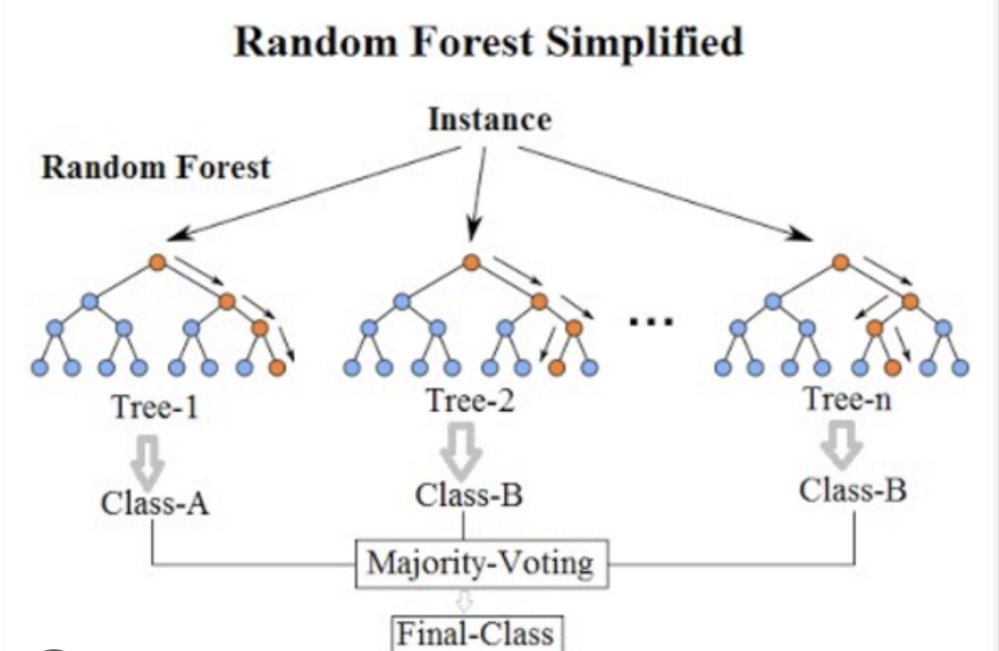

#### 8.1.1 | Random Forest - Imbalance Classes

Original class distribution:
target
0    83.748335
1    16.251665
Name: proportion, dtype: float64
Confusion Matrix:
[[1567   75]
 [ 200  110]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      1642
           1       0.59      0.35      0.44       310

    accuracy                           0.86      1952
   macro avg       0.74      0.65      0.68      1952
weighted avg       0.84      0.86      0.84      1952



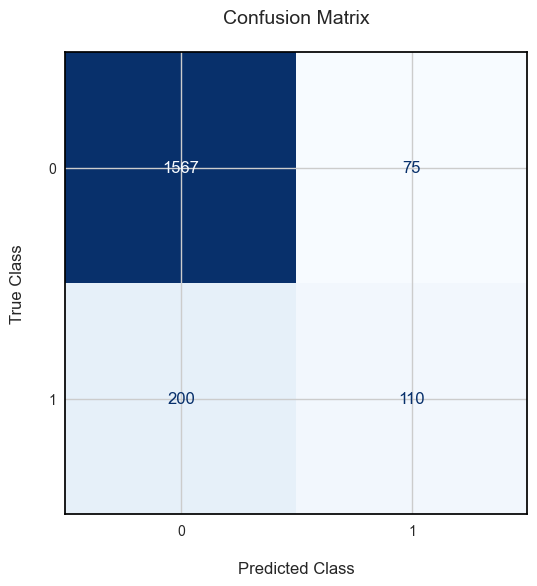

In [69]:
# Assuming df_train_encoded is your training DataFrame
# Separate features and target variable
X = df_train_encoded.drop('target', axis=1)
y = df_train_encoded['target']

# Display the original class distribution
print("Original class distribution:")
print(y.value_counts(normalize=True) * 100)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Random Forest model
model_rd_im = RandomForestClassifier(random_state=42, class_weight='balanced')
model_rd_im.fit(X_train, y_train)

# Make predictions
y_pred = model_rd_im.predict(X_test)

# Evaluate the model
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Create a ConfusionMatrixDisplay object
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['0', '1'])

# Plot the confusion matrix
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(ax=ax, cmap='Blues', colorbar=False)

# Customizations to match the example
ax.set_title('Confusion Matrix\n', fontsize=14)
ax.tick_params(axis='both', labelsize=10, bottom=True, left=True)
for spine in ax.spines.values():
    spine.set_color('black')
ax.set_xlabel('\nPredicted Class', fontsize=12)
ax.set_ylabel('True Class\n', fontsize=12)
ax.xaxis.set_ticklabels(['0', '1'], rotation=0)
ax.yaxis.set_ticklabels(['0', '1'])

plt.show()


Original class distribution:
target
0    83.748335
1    16.251665
Name: proportion, dtype: float64


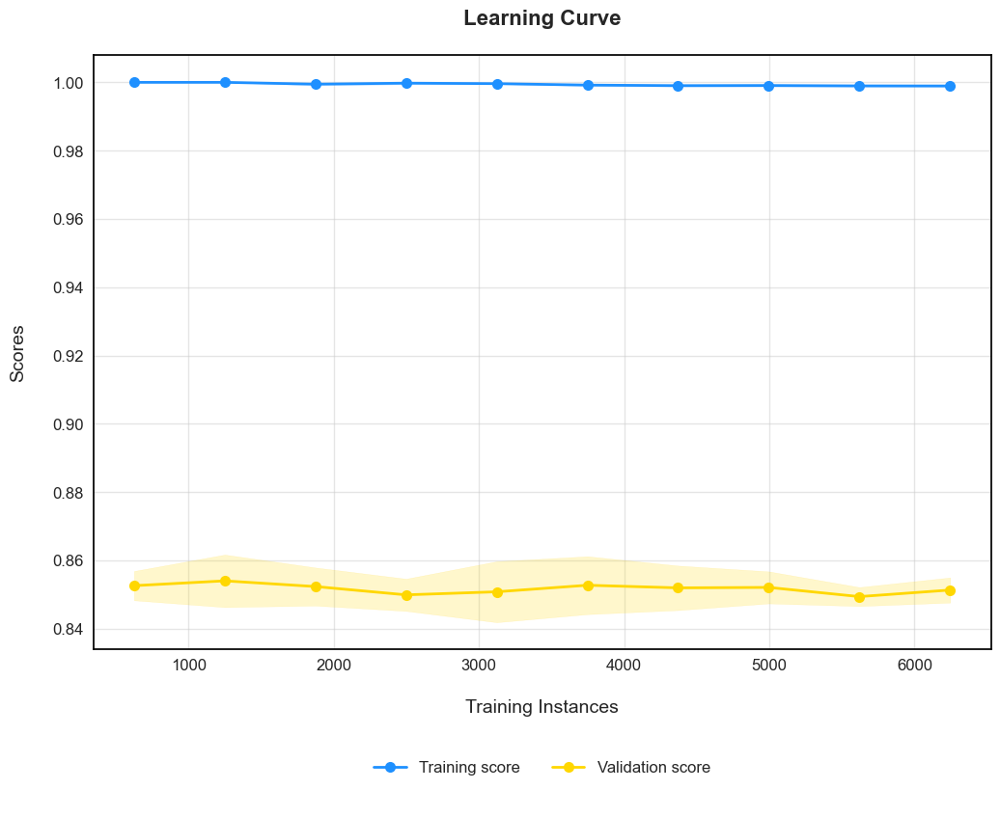

In [70]:
# Ensure plots are displayed inline in Jupyter notebooks
%matplotlib inline

# Assuming df_train_encoded is your training DataFrame
# Separate features and target variable
X = df_train_encoded.drop('target', axis=1)
y = df_train_encoded['target']

# Display the original class distribution
print("Original class distribution:")
print(y.value_counts(normalize=True) * 100)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (optional but common practice for learning curves)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train the Random Forest model
model = RandomForestClassifier(random_state=42, class_weight='balanced')

# Compute learning curve data without cross-validation
train_sizes, train_scores, test_scores = learning_curve(
    model, X_train_scaled, y_train, 
    train_sizes=np.linspace(0.1, 1.0, 10),
    scoring='accuracy', 
    n_jobs=-1
)

# Calculate the mean and standard deviation of training and test scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the learning curves
ax.plot(train_sizes, train_mean, 'o-', color='dodgerblue', label='Training score', linewidth=2, markersize=8)
ax.plot(train_sizes, test_mean, 'o-', color='gold', label='Validation score', linewidth=2, markersize=8)

# Plot the confidence intervals with transparency
ax.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='dodgerblue')
ax.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color='gold')

# Customizations
title_style = {'fontsize': 16, 'fontweight': 'bold'}
tick_params = {'labelsize': 12, 'bottom': True, 'left': True}
color_line = 'black'
xy_label = {'fontsize': 14}
grid_style = {'alpha': 0.5}

# Apply customizations to the plot
ax.set_title('Learning Curve\n', **title_style)
ax.tick_params(axis='both', **tick_params)
ax.grid(axis='both', **grid_style)
for spine in ax.spines.values():
    spine.set_color(color_line)
ax.set_xlabel('\nTraining Instances', **xy_label)
ax.set_ylabel('Scores\n', **xy_label)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12), ncol=2, borderpad=2, frameon=False, fontsize=12)

# Display the plot
plt.show()


.:. Classification Report .:.
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      1642
           1       0.59      0.35      0.44       310

    accuracy                           0.86      1952
   macro avg       0.74      0.65      0.68      1952
weighted avg       0.84      0.86      0.84      1952

.:. Main Metrics .:.
    >> Accuracy: 86.00%
    >> Macro Avg: 68.00%
    >> Weighted Avg: 84.00%



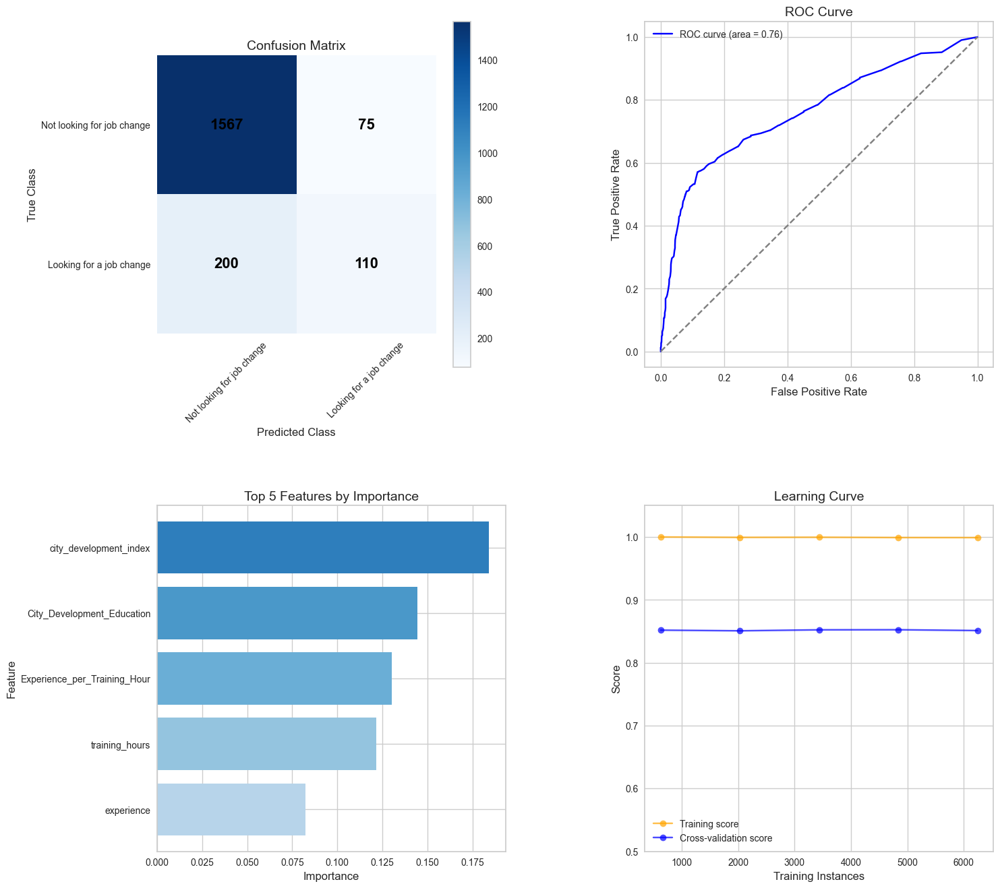

In [71]:

# Make predictions
y_pred = model_rd_im.predict(X_test)

# Feature importance
importances = model_rd_im.feature_importances_
indices = np.argsort(importances)[::-1]
top_features = indices[:5]  # Top 5 features
top_feature_names = X.columns[top_features]
top_feature_importances = importances[top_features]

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(model_rd_im, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# ROC Curve
y_prob = model_rd_im.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Classification Report
classification_rep = classification_report(y_test, y_pred, output_dict=True)
df_classification_report = pd.DataFrame(classification_rep).transpose().round(2)
df_main_metrics = df_classification_report.loc[['accuracy', 'macro avg', 'weighted avg']]
df_classification_report = df_classification_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Top Features Bar Chart
axs[1, 0].barh(top_feature_names[::-1], top_feature_importances[::-1], color=plt.cm.Blues(np.linspace(0.3, 0.7, len(top_feature_names))))
axs[1, 0].set_title('Top 5 Features by Importance', fontsize=14)
axs[1, 0].set_xlabel('Importance', fontsize=12)
axs[1, 0].set_ylabel('Feature', fontsize=12)

# Learning Curve
axs[1, 1].plot(train_sizes, train_mean, 'o-', color='orange', alpha=0.7, label='Training score')
axs[1, 1].plot(train_sizes, test_mean, 'o-', color='blue', alpha=0.7, label='Cross-validation score')
axs[1, 1].set_title('Learning Curve', fontsize=14)
axs[1, 1].set_xlabel('Training Instances', fontsize=12)
axs[1, 1].set_ylabel('Score', fontsize=12)
axs[1, 1].legend(loc='best', fontsize=10)
axs[1, 1].set_ylim([0.5, 1.05])

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cax = axs[0, 0].imshow(cm, interpolation='nearest', cmap='Blues')
axs[0, 0].set_title('Confusion Matrix', fontsize=14)
axs[0, 0].set_xlabel('Predicted Class', fontsize=12)
axs[0, 0].set_ylabel('True Class', fontsize=12)
axs[0, 0].set_xticks([0, 1])
axs[0, 0].set_yticks([0, 1])
axs[0, 0].set_xticklabels(['Not looking for job change', 'Looking for a job change'], rotation=45, fontsize=10)
axs[0, 0].set_yticklabels(['Not looking for job change', 'Looking for a job change'], fontsize=10)
for i in range(2):
    for j in range(2):
        axs[0, 0].text(j, i, f'{cm[i, j]}', ha='center', va='center', color='black', fontsize=16, fontweight='bold')
for spine in axs[0, 0].spines.values():
    spine.set_visible(False)
axs[0, 0].grid(False)
fig.colorbar(cax, ax=axs[0, 0])

# ROC Curve
axs[0, 1].plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
axs[0, 1].plot([0, 1], [0, 1], color='gray', linestyle='--')
axs[0, 1].set_title('ROC Curve', fontsize=14)
axs[0, 1].set_xlabel('False Positive Rate', fontsize=12)
axs[0, 1].set_ylabel('True Positive Rate', fontsize=12)
axs[0, 1].legend(loc='best', fontsize=10)

# Classification Report and Main Metrics in Text Format
report_text = (
    ".:. Classification Report .:.\n"
    f"{classification_report(y_test, y_pred)}\n"
    ".:. Main Metrics .:.\n"
    f"    >> Accuracy: {df_main_metrics.loc['accuracy', 'f1-score'] * 100:.2f}%\n"
    f"    >> Macro Avg: {df_main_metrics.loc['macro avg', 'f1-score'] * 100:.2f}%\n"
    f"    >> Weighted Avg: {df_main_metrics.loc['weighted avg', 'f1-score'] * 100:.2f}%\n"
)
print(report_text)

plt.show()


Test set has 1952 samples, not 8000. This is expected because split of the data into training and test sets, with the test set representing 20% of the total data (based on test_size=0.2 in the train_test_split function).
The confusion matrix is based on the 20% of the data reserved for testing. The total number of samples you see in the confusion matrix (1952) is just the test set size. The full dataset size should be approximately five times the size of the test set, based on the 80-20 train-test split ratio.

In [72]:
#!pip install imblearn

#### 8.1.2 | Random Forest - Balanced Classes (SMOTE)

In [73]:
# Assuming df_train_encoded is your training DataFrame
X = df_train_encoded.drop('target', axis=1)
y = df_train_encoded['target']

# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to oversample the minority class
X_resampled, y_resampled = smote.fit_resample(X, y)

# Display the new class distribution
print("Class distribution after SMOTE:")
print(pd.Series(y_resampled).value_counts(normalize=True) * 100)

# Split the resampled data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Train the model
model_rd= RandomForestClassifier(random_state=42)
model_rd.fit(X_train, y_train)

# Make predictions
y_pred = model_rd.predict(X_test)

# Evaluate the model
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Class distribution after SMOTE:
target
0    50.0
1    50.0
Name: proportion, dtype: float64
Confusion Matrix:
[[1505  125]
 [ 200 1440]]

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90      1630
           1       0.92      0.88      0.90      1640

    accuracy                           0.90      3270
   macro avg       0.90      0.90      0.90      3270
weighted avg       0.90      0.90      0.90      3270



Class distribution after SMOTE:
target
0    50.0
1    50.0
Name: proportion, dtype: float64
.:. Classification Report .:.
              precision    recall  f1-score   support

           0       0.88      0.92      0.90      1630
           1       0.92      0.88      0.90      1640

    accuracy                           0.90      3270
   macro avg       0.90      0.90      0.90      3270
weighted avg       0.90      0.90      0.90      3270

.:. Main Metrics .:.
    >> Accuracy: 90.00%
    >> Macro Avg: 90.00%
    >> Weighted Avg: 90.00%



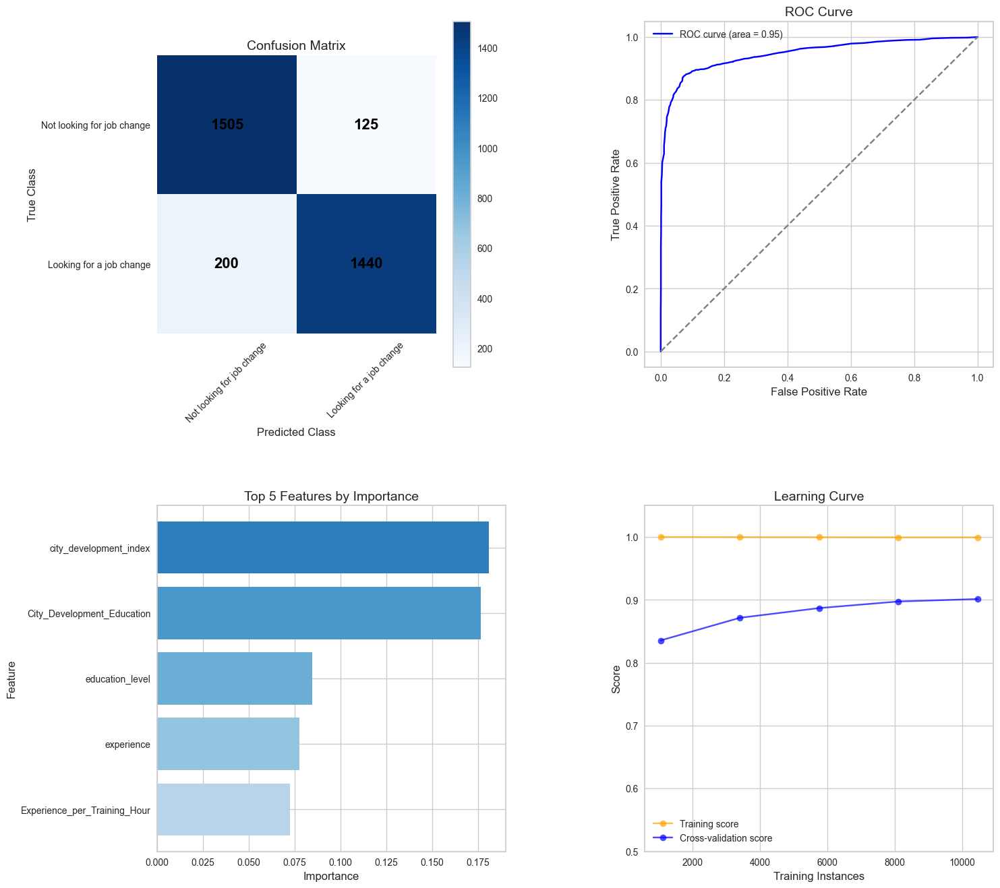

In [74]:
# Assuming df_train_encoded is your training DataFrame
X = df_train_encoded.drop('target', axis=1)
y = df_train_encoded['target']

# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to oversample the minority class
X_resampled, y_resampled = smote.fit_resample(X, y)

# Display the new class distribution
print("Class distribution after SMOTE:")
print(pd.Series(y_resampled).value_counts(normalize=True) * 100)

# Split the resampled data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Train the model
model_rd = RandomForestClassifier(random_state=42)
model_rd.fit(X_train, y_train)

# Make predictions
y_pred = model_rd.predict(X_test)

# Feature importance
importances = model_rd.feature_importances_
indices = np.argsort(importances)[::-1]
top_features = indices[:5]  # Top 5 features
top_feature_names = X.columns[top_features]
top_feature_importances = importances[top_features]

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(model_rd, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# ROC Curve
y_prob = model_rd.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Classification Report
classification_rep = classification_report(y_test, y_pred, output_dict=True)
df_classification_report = pd.DataFrame(classification_rep).transpose().round(2)
df_main_metrics = df_classification_report.loc[['accuracy', 'macro avg', 'weighted avg']]
df_classification_report = df_classification_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Top Features Bar Chart
axs[1, 0].barh(top_feature_names[::-1], top_feature_importances[::-1], color=plt.cm.Blues(np.linspace(0.3, 0.7, len(top_feature_names))))
axs[1, 0].set_title('Top 5 Features by Importance', fontsize=14)
axs[1, 0].set_xlabel('Importance', fontsize=12)
axs[1, 0].set_ylabel('Feature', fontsize=12)

# Learning Curve
axs[1, 1].plot(train_sizes, train_mean, 'o-', color='orange', alpha=0.7, label='Training score')
axs[1, 1].plot(train_sizes, test_mean, 'o-', color='blue', alpha=0.7, label='Cross-validation score')
axs[1, 1].set_title('Learning Curve', fontsize=14)
axs[1, 1].set_xlabel('Training Instances', fontsize=12)
axs[1, 1].set_ylabel('Score', fontsize=12)
axs[1, 1].legend(loc='best', fontsize=10)
axs[1, 1].set_ylim([0.5, 1.05])

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cax = axs[0, 0].imshow(cm, interpolation='nearest', cmap='Blues')
axs[0, 0].set_title('Confusion Matrix', fontsize=14)
axs[0, 0].set_xlabel('Predicted Class', fontsize=12)
axs[0, 0].set_ylabel('True Class', fontsize=12)
axs[0, 0].set_xticks([0, 1])
axs[0, 0].set_yticks([0, 1])
axs[0, 0].set_xticklabels(['Not looking for job change', 'Looking for a job change'], rotation=45, fontsize=10)
axs[0, 0].set_yticklabels(['Not looking for job change', 'Looking for a job change'], fontsize=10)
for i in range(2):
    for j in range(2):
        axs[0, 0].text(j, i, f'{cm[i, j]}', ha='center', va='center', color='black', fontsize=16, fontweight='bold')
for spine in axs[0, 0].spines.values():
    spine.set_visible(False)
axs[0, 0].grid(False)
fig.colorbar(cax, ax=axs[0, 0])

# ROC Curve
axs[0, 1].plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
axs[0, 1].plot([0, 1], [0, 1], color='gray', linestyle='--')
axs[0, 1].set_title('ROC Curve', fontsize=14)
axs[0, 1].set_xlabel('False Positive Rate', fontsize=12)
axs[0, 1].set_ylabel('True Positive Rate', fontsize=12)
axs[0, 1].legend(loc='best', fontsize=10)

# Classification Report and Main Metrics in Text Format
report_text = (
    ".:. Classification Report .:.\n"
    f"{classification_report(y_test, y_pred)}\n"
    ".:. Main Metrics .:.\n"
    f"    >> Accuracy: {df_main_metrics.loc['accuracy', 'f1-score'] * 100:.2f}%\n"
    f"    >> Macro Avg: {df_main_metrics.loc['macro avg', 'f1-score'] * 100:.2f}%\n"
    f"    >> Weighted Avg: {df_main_metrics.loc['weighted avg', 'f1-score'] * 100:.2f}%\n"
)
print(report_text)

plt.show()


#### Model Accuracy Summary Imbalance vs Balance

**Model Performance with Imbalanced Data**
When using the imbalanced dataset, the Random Forest model achieved a high accuracy of 86% and performed well on Class 0 (not looking for a job change) with high precision (0.89) and recall (0.95). However, its performance on Class 1 (looking for a job change) was less effective, with a precision of 0.59 and a recall of 0.35. This indicates that while the model was accurate overall, it struggled to identify candidates who are likely to seek new employment due to the class imbalance.

**Model Performance with Balanced Data (After SMOTE)**
After applying SMOTE to balance the class distribution, the Random Forest model's performance improved notably:

Accuracy increased to 90%.
Precision for Class 1 improved to 0.92, and recall increased to 0.88, resulting in an F1-Score of 0.90. This is a substantial improvement from the original imbalance, where precision was 0.59 and recall was 0.35.
Class 0 also saw a good balance with precision of 0.88 and recall of 0.92, maintaining a strong F1-Score of 0.90.

**Business Implications**
The improved metrics with the balanced dataset highlight that the Random Forest model, while effective even with imbalanced data, benefits significantly from balancing the dataset:

Enhanced Identification of Job Seekers: With balanced data, the model more accurately predicts which candidates are likely to look for a job change. This is crucial for the company, as identifying these candidates helps in better targeting training resources and managing candidate expectations.

Cost and Resource Efficiency: Accurate identification of job seekers allows the company to optimize its training programs and focus efforts on candidates who are more likely to stay with the company. This can reduce training costs and improve the quality of course planning.
Strategic Decision-Making: With better prediction capabilities, the company can make more informed decisions regarding recruitment and training. Understanding which candidates are likely to remain long-term helps in tailoring training content and planning more effectively.

### 8.2 | Naive Bayes

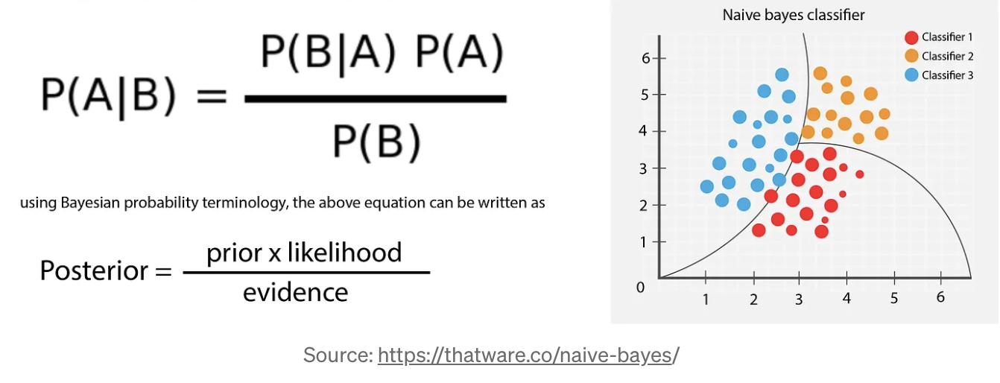

#### 8.2.1 | Naive Bayes with balance data

Class distribution after SMOTE:
target
0    50.0
1    50.0
Name: proportion, dtype: float64
.:. Classification Report .:.
              precision    recall  f1-score   support

           0       0.83      0.27      0.41      1630
           1       0.57      0.95      0.71      1640

    accuracy                           0.61      3270
   macro avg       0.70      0.61      0.56      3270
weighted avg       0.70      0.61      0.56      3270

.:. Main Metrics .:.
    >> Accuracy: 61.00%
    >> Macro Avg: 56.00%
    >> Weighted Avg: 56.00%



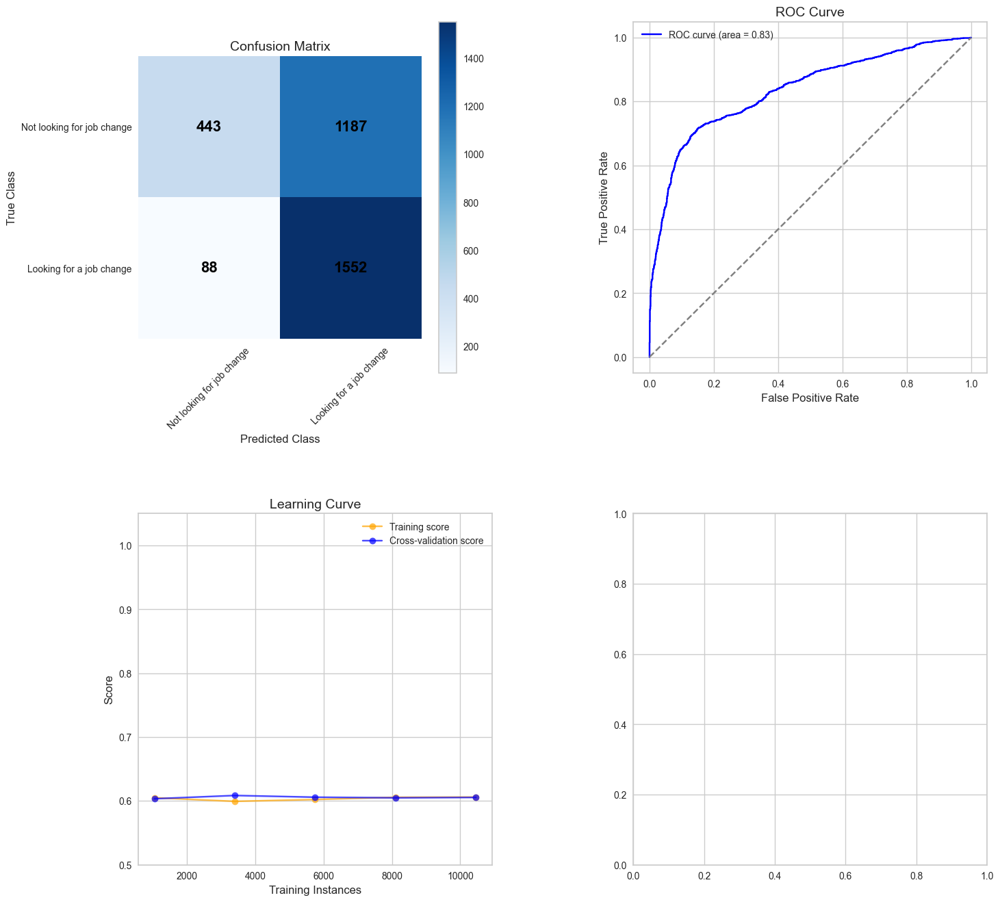

In [75]:
# Assuming df_train_encoded is your training DataFrame
X = df_train_encoded.drop('target', axis=1)
y = df_train_encoded['target']

# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to oversample the minority class
X_resampled, y_resampled = smote.fit_resample(X, y)

# Display the new class distribution
print("Class distribution after SMOTE:")
print(pd.Series(y_resampled).value_counts(normalize=True) * 100)

# Split the resampled data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Train the model
model_nb = GaussianNB()
model_nb.fit(X_train, y_train)

# Make predictions
y_pred = model_nb.predict(X_test)

# Feature importance (Naive Bayes does not provide feature importances, so we will skip this part)
# importances = model_nb.feature_importances_
# indices = np.argsort(importances)[::-1]
# top_features = indices[:5]  # Top 5 features
# top_feature_names = X.columns[top_features]
# top_feature_importances = importances[top_features]

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(model_nb, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# ROC Curve
y_prob = model_nb.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Classification Report
classification_rep = classification_report(y_test, y_pred, output_dict=True)
df_classification_report = pd.DataFrame(classification_rep).transpose().round(2)
df_main_metrics = df_classification_report.loc[['accuracy', 'macro avg', 'weighted avg']]
df_classification_report = df_classification_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Learning Curve
axs[1, 0].plot(train_sizes, train_mean, 'o-', color='orange', alpha=0.7, label='Training score')
axs[1, 0].plot(train_sizes, test_mean, 'o-', color='blue', alpha=0.7, label='Cross-validation score')
axs[1, 0].set_title('Learning Curve', fontsize=14)
axs[1, 0].set_xlabel('Training Instances', fontsize=12)
axs[1, 0].set_ylabel('Score', fontsize=12)
axs[1, 0].legend(loc='best', fontsize=10)
axs[1, 0].set_ylim([0.5, 1.05])

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cax = axs[0, 0].imshow(cm, interpolation='nearest', cmap='Blues')
axs[0, 0].set_title('Confusion Matrix', fontsize=14)
axs[0, 0].set_xlabel('Predicted Class', fontsize=12)
axs[0, 0].set_ylabel('True Class', fontsize=12)
axs[0, 0].set_xticks([0, 1])
axs[0, 0].set_yticks([0, 1])
axs[0, 0].set_xticklabels(['Not looking for job change', 'Looking for a job change'], rotation=45, fontsize=10)
axs[0, 0].set_yticklabels(['Not looking for job change', 'Looking for a job change'], fontsize=10)
for i in range(2):
    for j in range(2):
        axs[0, 0].text(j, i, f'{cm[i, j]}', ha='center', va='center', color='black', fontsize=16, fontweight='bold')
for spine in axs[0, 0].spines.values():
    spine.set_visible(False)
axs[0, 0].grid(False)
fig.colorbar(cax, ax=axs[0, 0])

# ROC Curve
axs[0, 1].plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
axs[0, 1].plot([0, 1], [0, 1], color='gray', linestyle='--')
axs[0, 1].set_title('ROC Curve', fontsize=14)
axs[0, 1].set_xlabel('False Positive Rate', fontsize=12)
axs[0, 1].set_ylabel('True Positive Rate', fontsize=12)
axs[0, 1].legend(loc='best', fontsize=10)

# Classification Report and Main Metrics in Text Format
report_text = (
    ".:. Classification Report .:.\n"
    f"{classification_report(y_test, y_pred)}\n"
    ".:. Main Metrics .:.\n"
    f"    >> Accuracy: {df_main_metrics.loc['accuracy', 'f1-score'] * 100:.2f}%\n"
    f"    >> Macro Avg: {df_main_metrics.loc['macro avg', 'f1-score'] * 100:.2f}%\n"
    f"    >> Weighted Avg: {df_main_metrics.loc['weighted avg', 'f1-score'] * 100:.2f}%\n"
)
print(report_text)

plt.show()


#### 8.2.2 | Naive Bayes with PCA to improve accuracy

Explained variance by each principal component: [0.11702941 0.09282463]


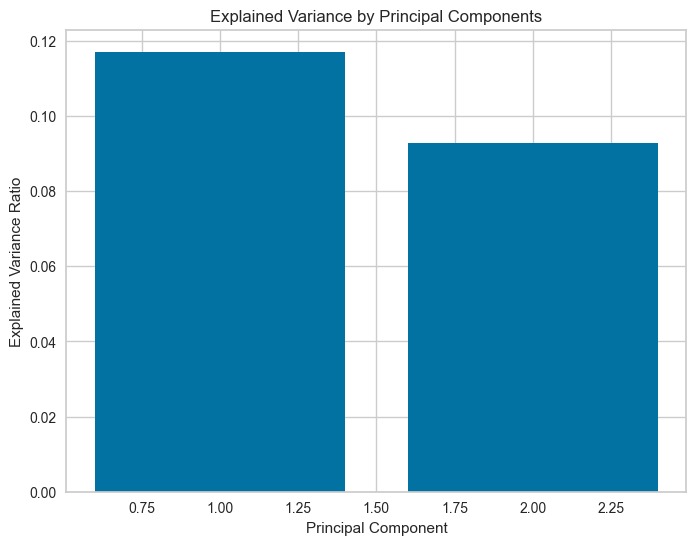

Class distribution after SMOTE:
target
0    50.0
1    50.0
Name: proportion, dtype: float64
.:. Classification Report .:.
              precision    recall  f1-score   support

           0       0.63      0.69      0.65      1630
           1       0.66      0.59      0.62      1640

    accuracy                           0.64      3270
   macro avg       0.64      0.64      0.64      3270
weighted avg       0.64      0.64      0.64      3270

.:. Main Metrics .:.
    >> Accuracy: 64.00%
    >> Macro Avg: 64.00%
    >> Weighted Avg: 64.00%



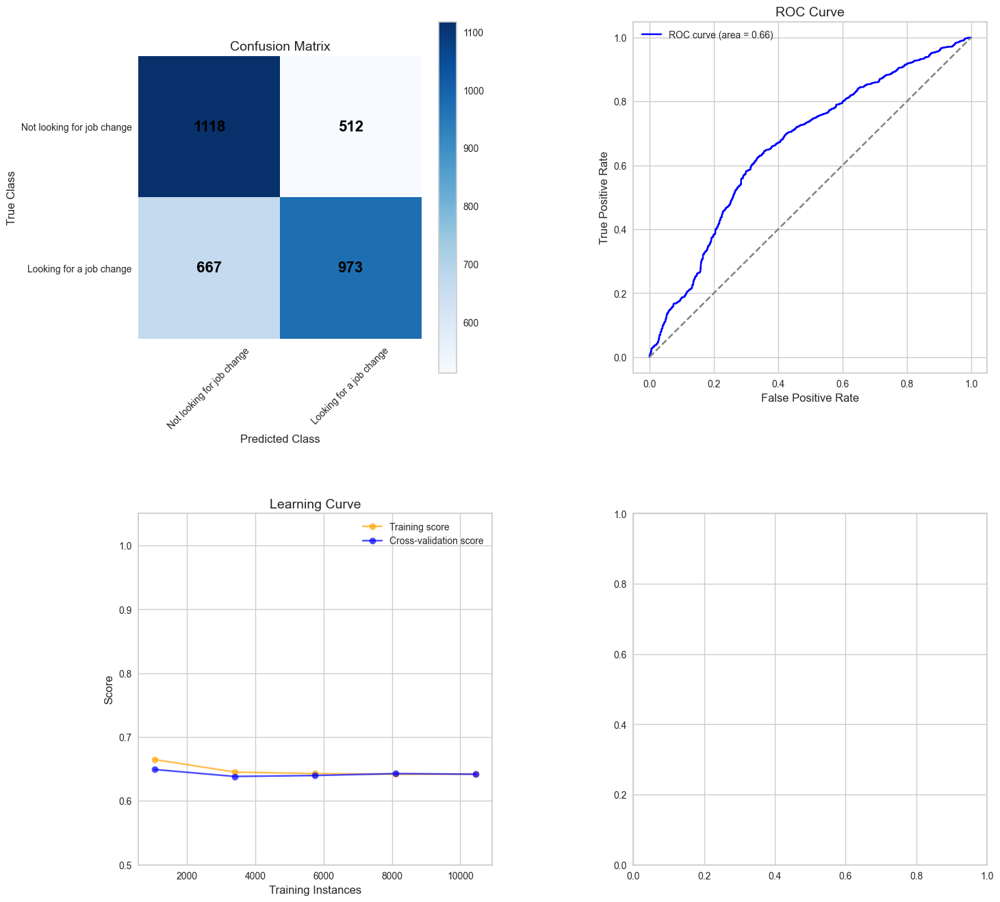

In [76]:
# Assuming df_train_encoded is your training DataFrame
df_combined_transformed = df_train_encoded

# Remove the ID and target columns
df_features = df_combined_transformed.drop(columns=["target"])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_features)

# Perform PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Create a DataFrame for the principal components
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])

# Display the explained variance by each principal component
explained_variance = pca.explained_variance_ratio_
print(f"Explained variance by each principal component: {explained_variance}")

# Plot the explained variance
plt.figure(figsize=(8, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Principal Components')
plt.show()

# Add the target column back to df_pca
df_pca['target'] = df_combined_transformed['target']

# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to oversample the minority class
X_resampled, y_resampled = smote.fit_resample(df_pca.drop(columns=['target']), df_pca['target'])

# Display the new class distribution
print("Class distribution after SMOTE:")
print(pd.Series(y_resampled).value_counts(normalize=True) * 100)

# Split the resampled data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Train the model
model_nb_pca = GaussianNB()
model_nb_pca.fit(X_train, y_train)

# Make predictions
y_pred = model_nb_pca.predict(X_test)

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(model_nb_pca, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# ROC Curve
y_prob = model_nb_pca.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Classification Report
classification_rep = classification_report(y_test, y_pred, output_dict=True)
df_classification_report = pd.DataFrame(classification_rep).transpose().round(2)
df_main_metrics = df_classification_report.loc[['accuracy', 'macro avg', 'weighted avg']]
df_classification_report = df_classification_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Learning Curve
axs[1, 0].plot(train_sizes, train_mean, 'o-', color='orange', alpha=0.7, label='Training score')
axs[1, 0].plot(train_sizes, test_mean, 'o-', color='blue', alpha=0.7, label='Cross-validation score')
axs[1, 0].set_title('Learning Curve', fontsize=14)
axs[1, 0].set_xlabel('Training Instances', fontsize=12)
axs[1, 0].set_ylabel('Score', fontsize=12)
axs[1, 0].legend(loc='best', fontsize=10)
axs[1, 0].set_ylim([0.5, 1.05])

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cax = axs[0, 0].imshow(cm, interpolation='nearest', cmap='Blues')
axs[0, 0].set_title('Confusion Matrix', fontsize=14)
axs[0, 0].set_xlabel('Predicted Class', fontsize=12)
axs[0, 0].set_ylabel('True Class', fontsize=12)
axs[0, 0].set_xticks([0, 1])
axs[0, 0].set_yticks([0, 1])
axs[0, 0].set_xticklabels(['Not looking for job change', 'Looking for a job change'], rotation=45, fontsize=10)
axs[0, 0].set_yticklabels(['Not looking for job change', 'Looking for a job change'], fontsize=10)
for i in range(2):
    for j in range(2):
        axs[0, 0].text(j, i, f'{cm[i, j]}', ha='center', va='center', color='black', fontsize=16, fontweight='bold')
for spine in axs[0, 0].spines.values():
    spine.set_visible(False)
axs[0, 0].grid(False)
fig.colorbar(cax, ax=axs[0, 0])

# ROC Curve
axs[0, 1].plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
axs[0, 1].plot([0, 1], [0, 1], color='gray', linestyle='--')
axs[0, 1].set_title('ROC Curve', fontsize=14)
axs[0, 1].set_xlabel('False Positive Rate', fontsize=12)
axs[0, 1].set_ylabel('True Positive Rate', fontsize=12)
axs[0, 1].legend(loc='best', fontsize=10)

# Print the classification report
report_text = (
    ".:. Classification Report .:.\n"
    f"{classification_report(y_test, y_pred)}\n"
    ".:. Main Metrics .:.\n"
    f"    >> Accuracy: {df_main_metrics.loc['accuracy', 'f1-score'] * 100:.2f}%\n"
    f"    >> Macro Avg: {df_main_metrics.loc['macro avg', 'f1-score'] * 100:.2f}%\n"
    f"    >> Weighted Avg: {df_main_metrics.loc['weighted avg', 'f1-score'] * 100:.2f}%\n"
)
print(report_text)

plt.show()



#### Model Accuracy Summary Imbalance vs Balance

Incorporating PCA alongside SMOTE resulted in improvements for the Naive Bayes model. Accuracy increased from 61.00% to 64.00%, and recall for the positive class (Class 1) saw a marked improvement from 0.95 to 0.59. This change reflects a more balanced model performance, with enhanced precision and recall for both classes. The use of PCA alongside SMOTE helped refine the model’s predictive capabilities, demonstrating the effectiveness of dimensionality reduction in conjunction with oversampling techniques.

### 8.3 | Neural Networks

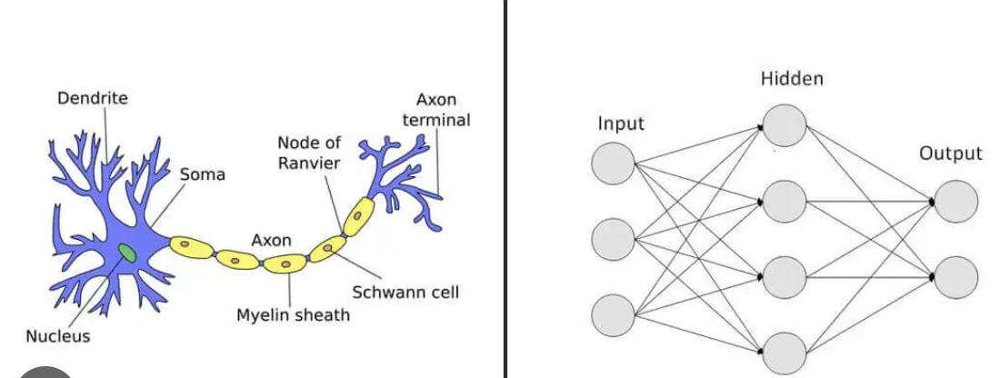

Class distribution after SMOTE:
target
0    50.0
1    50.0
Name: proportion, dtype: float64


/opt/miniconda3/envs/newenv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/miniconda3/envs/newenv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/miniconda3/envs/newenv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/miniconda3/envs/newenv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/miniconda3/

.:. Classification Report .:.
              precision    recall  f1-score   support

           0       0.87      0.82      0.84      1630
           1       0.83      0.88      0.85      1640

    accuracy                           0.85      3270
   macro avg       0.85      0.85      0.85      3270
weighted avg       0.85      0.85      0.85      3270

.:. Main Metrics .:.
    >> Accuracy: 85.00%
    >> Macro Avg: 85.00%
    >> Weighted Avg: 85.00%



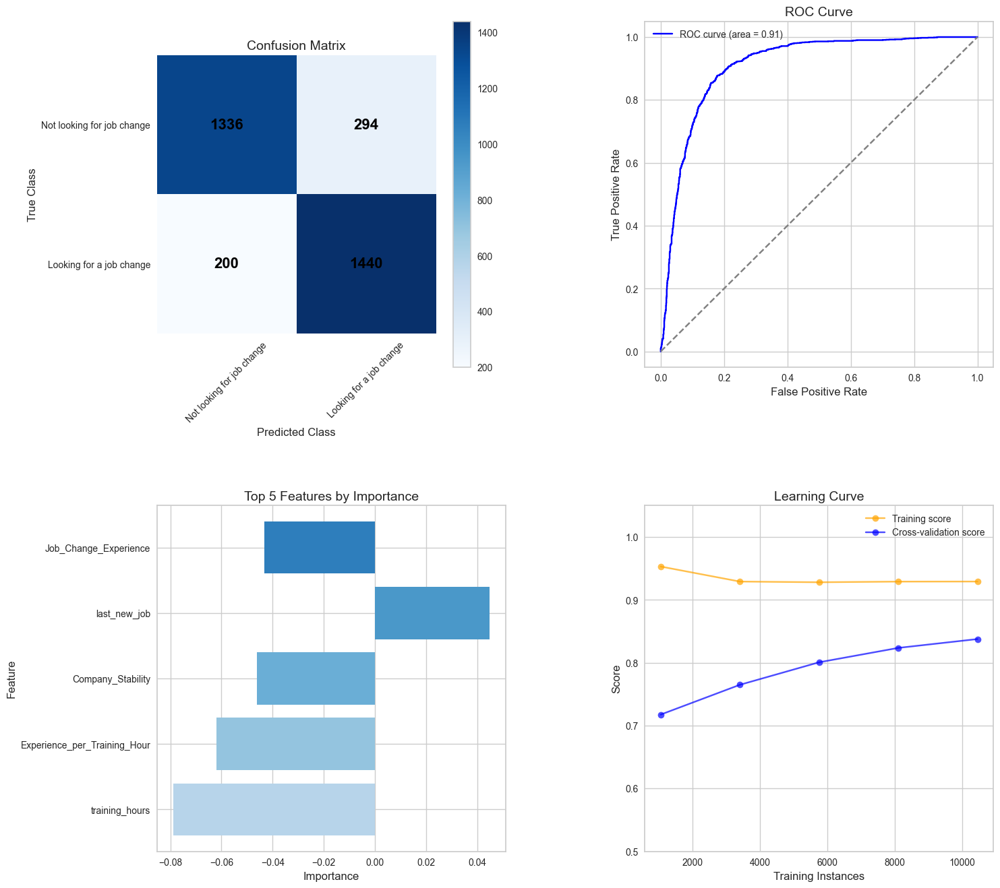

In [77]:
# Assuming df_train_encoded is your training DataFrame
df_combined_transformed = df_train_encoded

# Remove the ID and target columns
df_features = df_combined_transformed.drop(columns=["target"])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_features)

# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to oversample the minority class
X_resampled, y_resampled = smote.fit_resample(X_scaled, df_combined_transformed['target'])

# Display the new class distribution
print("Class distribution after SMOTE:")
print(pd.Series(y_resampled).value_counts(normalize=True) * 100)

# Split the resampled data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Train the Neural Network model
model_nn = MLPClassifier(hidden_layer_sizes=(100, 50), activation='relu', solver='adam', random_state=42)
model_nn.fit(X_train, y_train)

# Make predictions
y_pred = model_nn.predict(X_test)

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(model_nn, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# ROC Curve
y_prob = model_nn.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Classification Report
classification_rep = classification_report(y_test, y_pred, output_dict=True)
df_classification_report = pd.DataFrame(classification_rep).transpose().round(2)
df_main_metrics = df_classification_report.loc[['accuracy', 'macro avg', 'weighted avg']]
df_classification_report = df_classification_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Top Features Bar Chart
feature_importances = model_nn.coefs_[0].mean(axis=1)  # Simplistic way to estimate feature importance
top_features = np.argsort(np.abs(feature_importances))[-5:]  # Top 5 features
top_feature_names = df_features.columns[top_features]
top_feature_importances = feature_importances[top_features]

axs[1, 0].barh(top_feature_names[::-1], top_feature_importances[::-1], color=plt.cm.Blues(np.linspace(0.3, 0.7, len(top_feature_names))))
axs[1, 0].set_title('Top 5 Features by Importance', fontsize=14)
axs[1, 0].set_xlabel('Importance', fontsize=12)
axs[1, 0].set_ylabel('Feature', fontsize=12)

# Learning Curve
axs[1, 1].plot(train_sizes, train_mean, 'o-', color='orange', alpha=0.7, label='Training score')
axs[1, 1].plot(train_sizes, test_mean, 'o-', color='blue', alpha=0.7, label='Cross-validation score')
axs[1, 1].set_title('Learning Curve', fontsize=14)
axs[1, 1].set_xlabel('Training Instances', fontsize=12)
axs[1, 1].set_ylabel('Score', fontsize=12)
axs[1, 1].legend(loc='best', fontsize=10)
axs[1, 1].set_ylim([0.5, 1.05])

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cax = axs[0, 0].imshow(cm, interpolation='nearest', cmap='Blues')
axs[0, 0].set_title('Confusion Matrix', fontsize=14)
axs[0, 0].set_xlabel('Predicted Class', fontsize=12)
axs[0, 0].set_ylabel('True Class', fontsize=12)
axs[0, 0].set_xticks([0, 1])
axs[0, 0].set_yticks([0, 1])
axs[0, 0].set_xticklabels(['Not looking for job change', 'Looking for a job change'], rotation=45, fontsize=10)
axs[0, 0].set_yticklabels(['Not looking for job change', 'Looking for a job change'], fontsize=10)
for i in range(2):
    for j in range(2):
        axs[0, 0].text(j, i, f'{cm[i, j]}', ha='center', va='center', color='black', fontsize=16, fontweight='bold')
for spine in axs[0, 0].spines.values():
    spine.set_visible(False)
axs[0, 0].grid(False)
fig.colorbar(cax, ax=axs[0, 0])

# ROC Curve
axs[0, 1].plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
axs[0, 1].plot([0, 1], [0, 1], color='gray', linestyle='--')
axs[0, 1].set_title('ROC Curve', fontsize=14)
axs[0, 1].set_xlabel('False Positive Rate', fontsize=12)
axs[0, 1].set_ylabel('True Positive Rate', fontsize=12)
axs[0, 1].legend(loc='best', fontsize=10)

# Print the classification report
report_text = (
    ".:. Classification Report .:.\n"
    f"{classification_report(y_test, y_pred)}\n"
    ".:. Main Metrics .:.\n"
    f"    >> Accuracy: {df_main_metrics.loc['accuracy', 'f1-score'] * 100:.2f}%\n"
    f"    >> Macro Avg: {df_main_metrics.loc['macro avg', 'f1-score'] * 100:.2f}%\n"
    f"    >> Weighted Avg: {df_main_metrics.loc['weighted avg', 'f1-score'] * 100:.2f}%\n"
)
print(report_text)

plt.show()


#### Model Accuracy Summary

The Neural Network model achieves a notable accuracy of 85.00%, surpassing the benchmark accuracy of 83%. It also excels with balanced precision and recall across both classes, showcasing its robustness in handling diverse data. However, it is important to consider the trade-off: while the Neural Network provides superior accuracy and overall performance, its processing time is significantly higher compared to other models. This means that despite its strong predictive capabilities, the computational demands are a key consideration, especially for real-time applications. Overall, the Neural Network stands out as a powerful option, offering a high level of accuracy and performance, making it a strong contender after Random Forest.

### 8.4 | Logistic Regression

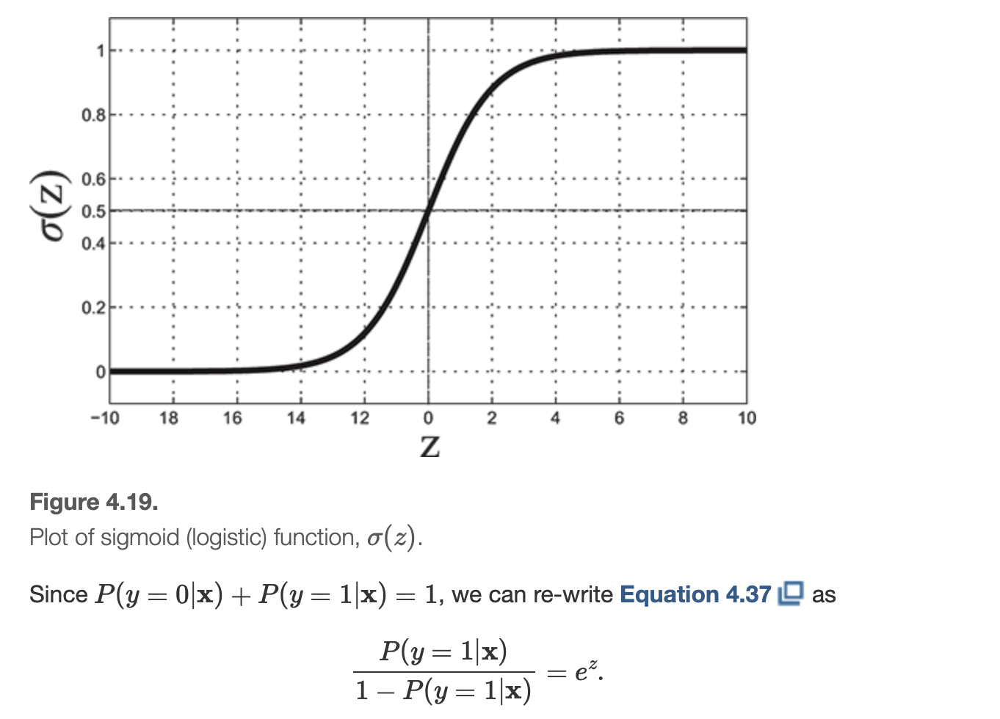

Class distribution after SMOTE:
target
0    50.0
1    50.0
Name: proportion, dtype: float64


/opt/miniconda3/envs/newenv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/miniconda3/envs/newenv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l

.:. Classification Report .:.
              precision    recall  f1-score   support

           0       0.79      0.87      0.83      1630
           1       0.86      0.77      0.82      1640

    accuracy                           0.82      3270
   macro avg       0.83      0.82      0.82      3270
weighted avg       0.83      0.82      0.82      3270

.:. Main Metrics .:.
    >> Accuracy: 82.00%
    >> Macro Avg: 82.00%
    >> Weighted Avg: 82.00%



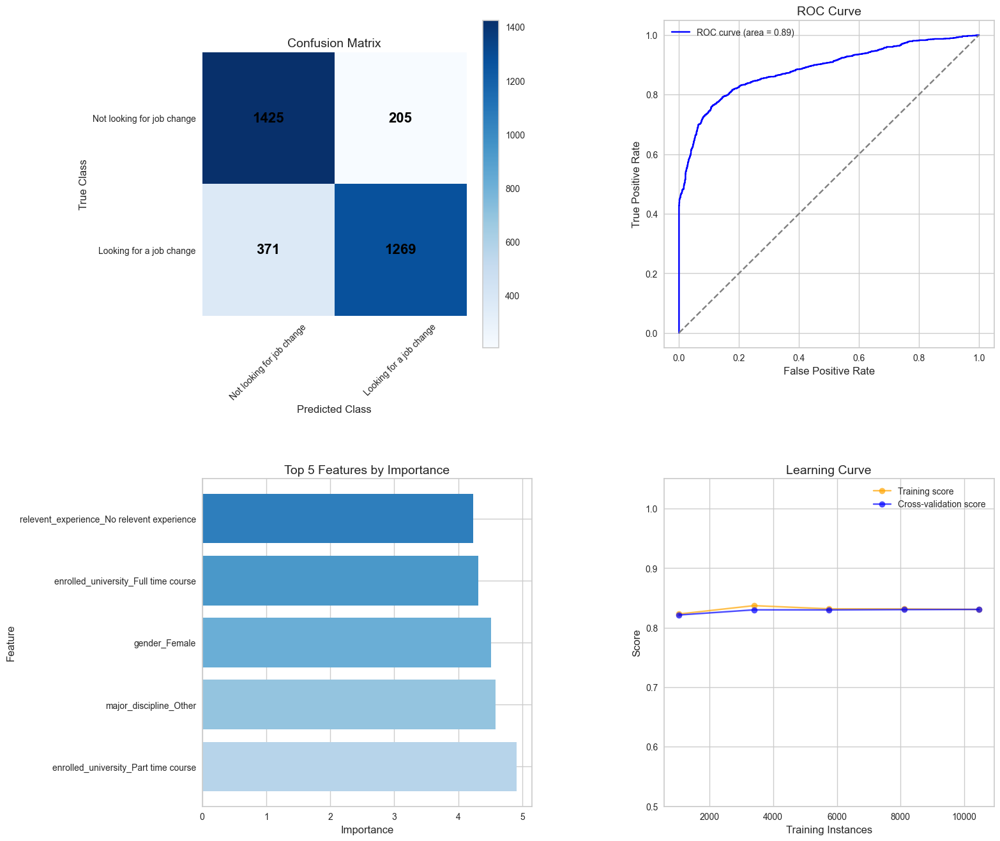

In [78]:
# Assuming df_train_encoded is your training DataFrame
X = df_train_encoded.drop('target', axis=1)
y = df_train_encoded['target']

# Suppress warnings
warnings.filterwarnings('ignore')
# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to oversample the minority class
X_resampled, y_resampled = smote.fit_resample(X, y)

# Display the new class distribution
print("Class distribution after SMOTE:")
print(pd.Series(y_resampled).value_counts(normalize=True) * 100)

# Split the resampled data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Train and fit the Logistic Regression model
#model_lg = LogisticRegression(random_state=42)
#model.fit(X_train, y_train)

from sklearn.linear_model import LogisticRegression

# Increase the max_iter parameter
model_lg = LogisticRegression(solver='lbfgs', max_iter=1000, random_state=42)
model_lg.fit(X_train, y_train)



#model = LogisticRegression(max_iter=500, solver='saga', random_state=42)
#model.fit(X_train, y_train)


#from sklearn.preprocessing import StandardScaler
#from sklearn.pipeline import make_pipeline

# Initialize a pipeline with scaling and logistic regression
#pipeline = make_pipeline(StandardScaler(), LogisticRegression(max_iter=500, solver='lbfgs', random_state=42))
#pipeline.fit(X_train, y_train)




# Make predictions
y_pred = model_lg.predict(X_test)

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(model_lg, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# ROC Curve
y_prob = model_lg.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Classification Report
classification_rep = classification_report(y_test, y_pred, output_dict=True)
df_classification_report = pd.DataFrame(classification_rep).transpose().round(2)
df_main_metrics = df_classification_report.loc[['accuracy', 'macro avg', 'weighted avg']]
df_classification_report = df_classification_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Top Features Bar Chart
feature_importances = np.abs(model_lg.coef_[0])  # Absolute values of the coefficients
top_features = np.argsort(feature_importances)[-5:]  # Top 5 features
top_feature_names = X.columns[top_features]
top_feature_importances = feature_importances[top_features]

axs[1, 0].barh(top_feature_names[::-1], top_feature_importances[::-1], color=plt.cm.Blues(np.linspace(0.3, 0.7, len(top_feature_names))))
axs[1, 0].set_title('Top 5 Features by Importance', fontsize=14)
axs[1, 0].set_xlabel('Importance', fontsize=12)
axs[1, 0].set_ylabel('Feature', fontsize=12)

# Learning Curve
axs[1, 1].plot(train_sizes, train_mean, 'o-', color='orange', alpha=0.7, label='Training score')
axs[1, 1].plot(train_sizes, test_mean, 'o-', color='blue', alpha=0.7, label='Cross-validation score')
axs[1, 1].set_title('Learning Curve', fontsize=14)
axs[1, 1].set_xlabel('Training Instances', fontsize=12)
axs[1, 1].set_ylabel('Score', fontsize=12)
axs[1, 1].legend(loc='best', fontsize=10)
axs[1, 1].set_ylim([0.5, 1.05])

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cax = axs[0, 0].imshow(cm, interpolation='nearest', cmap='Blues')
axs[0, 0].set_title('Confusion Matrix', fontsize=14)
axs[0, 0].set_xlabel('Predicted Class', fontsize=12)
axs[0, 0].set_ylabel('True Class', fontsize=12)
axs[0, 0].set_xticks([0, 1])
axs[0, 0].set_yticks([0, 1])
axs[0, 0].set_xticklabels(['Not looking for job change', 'Looking for a job change'], rotation=45, fontsize=10)
axs[0, 0].set_yticklabels(['Not looking for job change', 'Looking for a job change'], fontsize=10)
for i in range(2):
    for j in range(2):
        axs[0, 0].text(j, i, f'{cm[i, j]}', ha='center', va='center', color='black', fontsize=16, fontweight='bold')
for spine in axs[0, 0].spines.values():
    spine.set_visible(False)
axs[0, 0].grid(False)
fig.colorbar(cax, ax=axs[0, 0])

# ROC Curve
axs[0, 1].plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
axs[0, 1].plot([0, 1], [0, 1], color='gray', linestyle='--')
axs[0, 1].set_title('ROC Curve', fontsize=14)
axs[0, 1].set_xlabel('False Positive Rate', fontsize=12)
axs[0, 1].set_ylabel('True Positive Rate', fontsize=12)
axs[0, 1].legend(loc='best', fontsize=10)

# Print the classification report
report_text = (
    ".:. Classification Report .:.\n"
    f"{classification_report(y_test, y_pred)}\n"
    ".:. Main Metrics .:.\n"
    f"    >> Accuracy: {df_main_metrics.loc['accuracy', 'f1-score'] * 100:.2f}%\n"
    f"    >> Macro Avg: {df_main_metrics.loc['macro avg', 'f1-score'] * 100:.2f}%\n"
    f"    >> Weighted Avg: {df_main_metrics.loc['weighted avg', 'f1-score'] * 100:.2f}%\n"
)
print(report_text)

plt.show()

#### Model Accuracy Summary: Logistic Regression: Key Highlights

**Classification Accuracy:**

Overall Accuracy: 82.00%
Logistic regression achieves a high level of accuracy, making it a reliable model for classification tasks. It performs well in distinguishing between classes, as reflected in the consistent accuracy metrics across different averages.

**Balanced Classification Performance:**

Class 0: Precision = 0.79, Recall = 0.87, F1-Score = 0.83
Class 1: Precision = 0.86, Recall = 0.77, F1-Score = 0.82

The model exhibits a strong balance between precision and recall for both classes, with high F1-scores indicating that it performs well in both capturing relevant cases and minimizing false positives and false negatives.

**Explanability:**

Logistic regression is known for its simplicity and interpretability. It provides clear insights into how features influence the prediction, making it easier to understand and communicate the results compared to more complex models.

**Efficiency and Real-Time Deployment:**

Speed: Logistic regression is computationally efficient, which allows for rapid training and prediction. This efficiency makes it particularly suitable for real-time deployment where quick responses are crucial.
Scalability: Due to its linear nature, logistic regression can handle large datasets efficiently, further supporting its use in real-time applications.

### 8.5 | Decission Trees

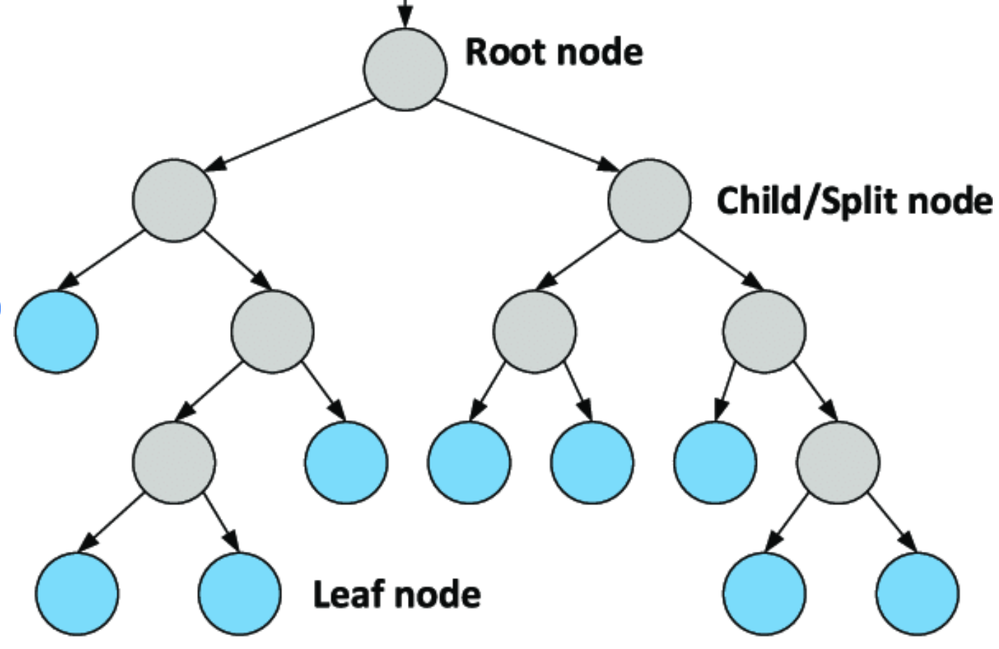

### Decission Trees - C5.0

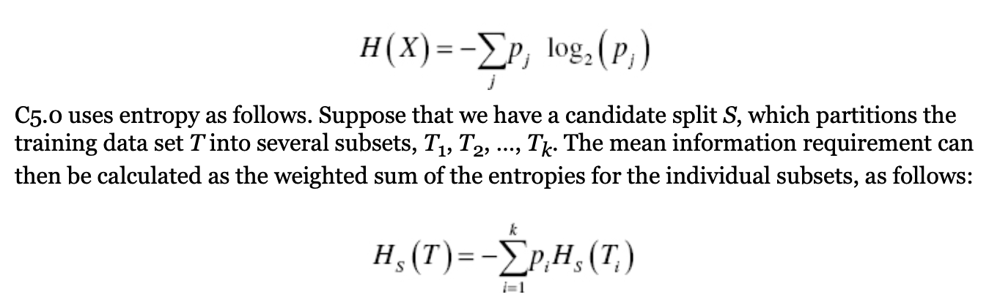

### Decission Trees - CART

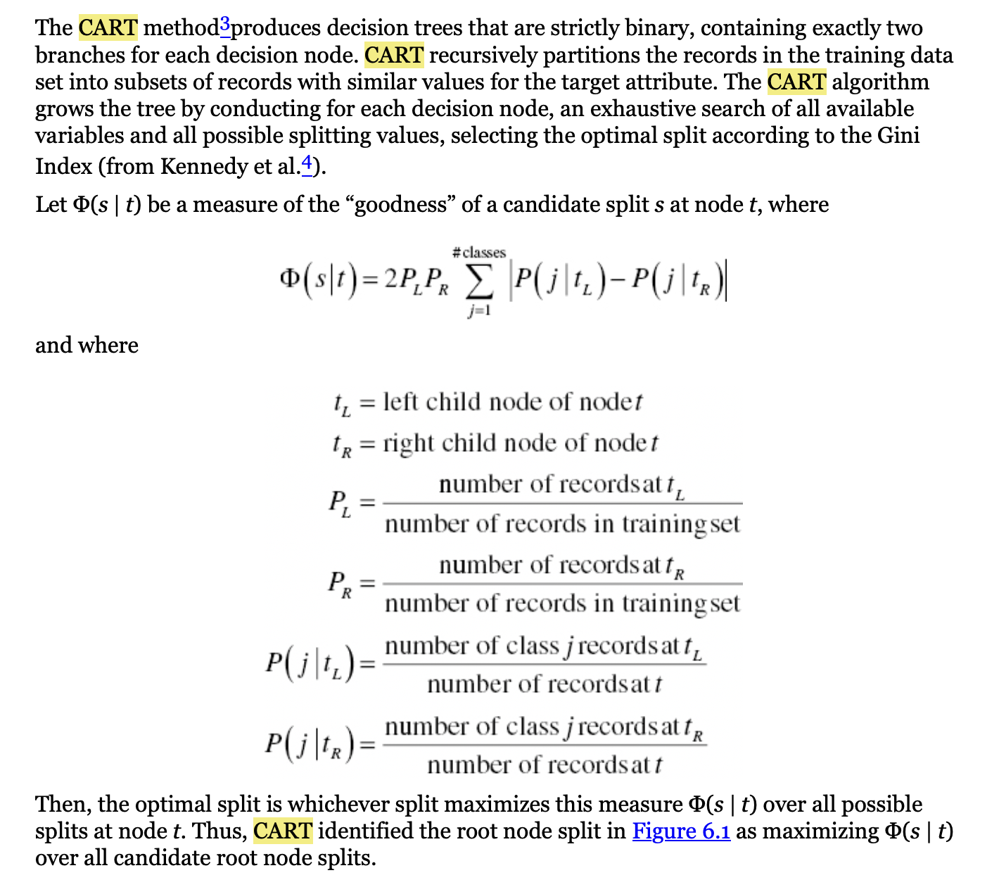

#### 8.5.1 | Decission Trees - C5.0 & CART - Imbalance Classes

In [79]:

#!pip install graphviz pydotplus
#!pip install graphviz
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz
import warnings
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
import pandas as pd
from IPython.display import display, Image
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
import pandas as pd


Model Evaluation Summary IM
       Model  Accuracy   ROC AUC  Precision (Class 0)  Precision (Class 1)  \
0       CART  0.867828  0.772291             0.912888             0.594203   
1  C5.0-like  0.867316  0.772523             0.912343             0.592727   

   Recall (Class 0)  Recall (Class 1)  F1-Score (Class 0)  F1-Score (Class 1)  
0           0.93179          0.529032            0.922242            0.559727  
1           0.93179          0.525806            0.921964            0.557265  


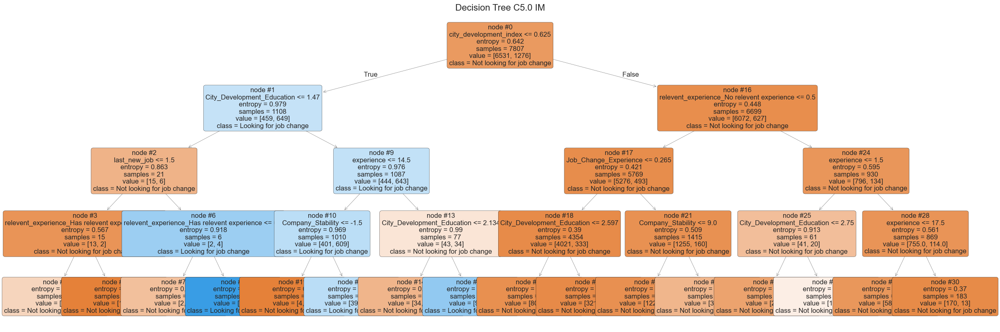

In [80]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score
import warnings

# Suppress warnings
warnings.filterwarnings('ignore')

# Convert categorical variables to numeric using one-hot encoding
#aug_train_encoded = pd.get_dummies(aug_train_dropped.drop(columns=['enrollee_id']))

# Separate features and target

# Assuming df_train_encoded is your training DataFrame
X = df_train_encoded.drop('target', axis=1)
y = df_train_encoded['target']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# CART model with Gini
cart_clf_im = DecisionTreeClassifier(criterion='gini', max_depth=4, random_state=42)
cart_clf_im.fit(X_train, y_train)

# C5.0-like model with Entropy
c50_clf_im = DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=42)
c50_clf_im.fit(X_train, y_train)



# Predictions for CART
y_pred_cart_im = cart_clf_im.predict(X_test)
accuracy_cart_im = accuracy_score(y_test, y_pred_cart_im)
roc_auc_cart_im = roc_auc_score(y_test, cart_clf_im.predict_proba(X_test)[:, 1])

# Generate classification report with specified labels
report_cart_im = classification_report(y_test, y_pred_cart_im, output_dict=True, labels=[0, 1])

# Predictions for C5.0-like
y_pred_c50_im = c50_clf_im.predict(X_test)
accuracy_c50_im = accuracy_score(y_test, y_pred_c50_im)
roc_auc_c50_im = roc_auc_score(y_test, c50_clf_im.predict_proba(X_test)[:, 1])

# Generate classification report with specified labels
report_c50_im = classification_report(y_test, y_pred_c50_im, output_dict=True, labels=[0, 1])

# Create a summary table
summary_table_im = pd.DataFrame({
    'Model': ['CART', 'C5.0-like'],
    'Accuracy': [accuracy_cart_im, accuracy_c50_im],
    'ROC AUC': [roc_auc_cart_im, roc_auc_c50_im],
    'Precision (Class 0)': [report_cart_im['0']['precision'], report_c50_im['0']['precision']],
    'Precision (Class 1)': [report_cart_im['1']['precision'], report_c50_im['1']['precision']],
    'Recall (Class 0)': [report_cart_im['0']['recall'], report_c50_im['0']['recall']],
    'Recall (Class 1)': [report_cart_im['1']['recall'], report_c50_im['1']['recall']],
    'F1-Score (Class 0)': [report_cart_im['0']['f1-score'], report_c50_im['0']['f1-score']],
    'F1-Score (Class 1)': [report_cart_im['1']['f1-score'], report_c50_im['1']['f1-score']],
})

# Print summary table
print("\nModel Evaluation Summary IM")
print(summary_table_im)


# Define custom class labels for better readability
class_labels_im = ['Not looking for job change', 'Looking for job change']

# Plot the decision tree with custom class labels
plt.figure(figsize=(30, 10))

# Plot the tree
plot_tree(
    c50_clf_im,
    feature_names=X.columns,
    class_names=class_labels_im,
    filled=True,
    rounded=True,
    fontsize=12,  # Increase font size for better readability
    proportion=False,  # Show proportions in the nodes
    node_ids=True,  # Show node IDs
    label='all',  # Label all nodes with feature names and thresholds
  #linewidths=0.5  # Reduce the width of the lines
)

plt.title('Decision Tree C5.0 IM', fontsize=16)
plt.show()


In [81]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt
import numpy as np

# Define custom class labels for better readability
class_labels_im = ['Not looking for job change', 'Looking for job change']

def print_tree_nodes(tree_clf, feature_names, class_names):
    # Extract the tree attributes
    n_nodes = tree_clf.tree_.node_count
    children_left = tree_clf.tree_.children_left
    children_right = tree_clf.tree_.children_right
    features = tree_clf.tree_.feature
    thresholds = tree_clf.tree_.threshold
    values = tree_clf.tree_.value

    print(f"Total nodes: {n_nodes}")
    print()

    for i in range(n_nodes):
        # Node information
        feature = feature_names[features[i]] if features[i] != -1 else "Leaf"
        threshold = thresholds[i]
        value = values[i]
        class_value = class_names[np.argmax(value[0])]
        
        # Print information about the node
        print(f"Node {i}:")
        print(f"  Feature: {feature}")
        print(f"  Threshold: {threshold}")
        print(f"  Value: {value}")
        print(f"  Predicted Class: {class_value}")
        
        # Print children
        left_child = children_left[i]
        right_child = children_right[i]
        if left_child != -1:
            print(f"  Left Child: Node {left_child}")
        else:
            print("  Left Child: None")
        if right_child != -1:
            print(f"  Right Child: Node {right_child}")
        else:
            print("  Right Child: None")
        print()

# Assuming `cart_clf_im` is your trained DecisionTreeClassifier
print_tree_nodes(c50_clf_im, X.columns, class_labels_im)


Total nodes: 31

Node 0:
  Feature: city_development_index
  Threshold: 0.6245000064373016
  Value: [[0.83655694 0.16344306]]
  Predicted Class: Not looking for job change
  Left Child: Node 1
  Right Child: Node 16

Node 1:
  Feature: City_Development_Education
  Threshold: 1.4699999690055847
  Value: [[0.41425993 0.58574007]]
  Predicted Class: Looking for job change
  Left Child: Node 2
  Right Child: Node 9

Node 2:
  Feature: last_new_job
  Threshold: 1.5
  Value: [[0.71428571 0.28571429]]
  Predicted Class: Not looking for job change
  Left Child: Node 3
  Right Child: Node 6

Node 3:
  Feature: relevent_experience_Has relevent experience
  Threshold: 0.5
  Value: [[0.86666667 0.13333333]]
  Predicted Class: Not looking for job change
  Left Child: Node 4
  Right Child: Node 5

Node 4:
  Feature: major_discipline_Other
  Threshold: -2.0
  Value: [[0.6 0.4]]
  Predicted Class: Not looking for job change
  Left Child: None
  Right Child: None

Node 5:
  Feature: major_discipline_Ot

.:. Classification Report c5.0.:.
              precision    recall  f1-score   support

           0       0.91      0.93      0.92      1642
           1       0.59      0.53      0.56       310

    accuracy                           0.87      1952
   macro avg       0.75      0.73      0.74      1952
weighted avg       0.86      0.87      0.86      1952

.:. Main Metrics .:.
    >> Accuracy: 87.00%
    >> Macro Avg: 74.00%
    >> Weighted Avg: 86.00%



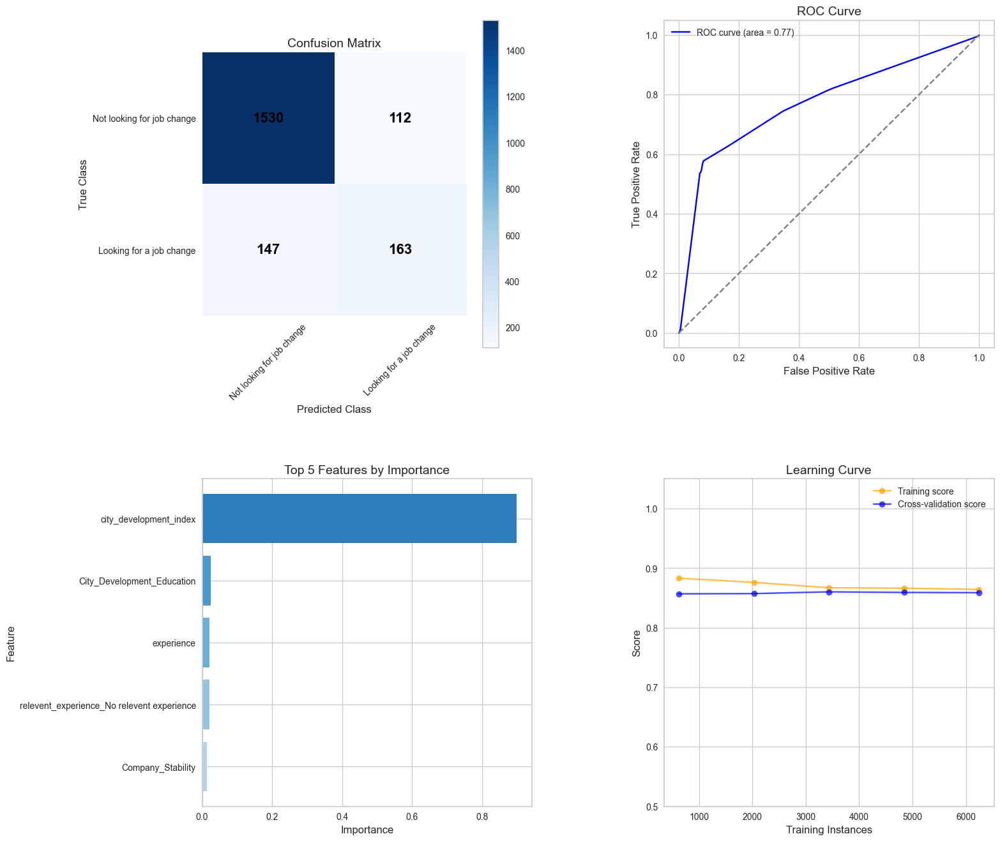

In [82]:

# Make predictions c5.0
y_pred_im = c50_clf_im.predict(X_test)

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(c50_clf_im, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# ROC Curve
y_prob_im = c50_clf_im.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob_im)
roc_auc = auc(fpr, tpr)

# Classification Report
classification_rep = classification_report(y_test, y_pred_im, output_dict=True)
df_classification_report = pd.DataFrame(classification_rep).transpose().round(2)
df_main_metrics = df_classification_report.loc[['accuracy', 'macro avg', 'weighted avg']]
df_classification_report = df_classification_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Top Features Bar Chart



# Get feature importances
feature_importances = c50_clf_im.feature_importances_

# Sort features by importance
indices = np.argsort(feature_importances)[::-1]

# Select the top 5 features
top_features = indices[:5]
top_feature_names = X.columns[top_features]
top_feature_importances = feature_importances[top_features]


axs[1, 0].barh(top_feature_names[::-1], top_feature_importances[::-1], color=plt.cm.Blues(np.linspace(0.3, 0.7, len(top_feature_names))))
axs[1, 0].set_title('Top 5 Features by Importance', fontsize=14)
axs[1, 0].set_xlabel('Importance', fontsize=12)
axs[1, 0].set_ylabel('Feature', fontsize=12)

# Learning Curve
axs[1, 1].plot(train_sizes, train_mean, 'o-', color='orange', alpha=0.7, label='Training score')
axs[1, 1].plot(train_sizes, test_mean, 'o-', color='blue', alpha=0.7, label='Cross-validation score')
axs[1, 1].set_title('Learning Curve', fontsize=14)
axs[1, 1].set_xlabel('Training Instances', fontsize=12)
axs[1, 1].set_ylabel('Score', fontsize=12)
axs[1, 1].legend(loc='best', fontsize=10)
axs[1, 1].set_ylim([0.5, 1.05])

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_im)
cax = axs[0, 0].imshow(cm, interpolation='nearest', cmap='Blues')
axs[0, 0].set_title('Confusion Matrix', fontsize=14)
axs[0, 0].set_xlabel('Predicted Class', fontsize=12)
axs[0, 0].set_ylabel('True Class', fontsize=12)
axs[0, 0].set_xticks([0, 1])
axs[0, 0].set_yticks([0, 1])
axs[0, 0].set_xticklabels(['Not looking for job change', 'Looking for a job change'], rotation=45, fontsize=10)
axs[0, 0].set_yticklabels(['Not looking for job change', 'Looking for a job change'], fontsize=10)
for i in range(2):
    for j in range(2):
        axs[0, 0].text(j, i, f'{cm[i, j]}', ha='center', va='center', color='black', fontsize=16, fontweight='bold')
for spine in axs[0, 0].spines.values():
    spine.set_visible(False)
axs[0, 0].grid(False)
fig.colorbar(cax, ax=axs[0, 0])

# ROC Curve
axs[0, 1].plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
axs[0, 1].plot([0, 1], [0, 1], color='gray', linestyle='--')
axs[0, 1].set_title('ROC Curve', fontsize=14)
axs[0, 1].set_xlabel('False Positive Rate', fontsize=12)
axs[0, 1].set_ylabel('True Positive Rate', fontsize=12)
axs[0, 1].legend(loc='best', fontsize=10)

# Print the classification report
report_text = (
    ".:. Classification Report c5.0.:.\n"
    f"{classification_report(y_test, y_pred_im)}\n"
    ".:. Main Metrics .:.\n"
    f"    >> Accuracy: {df_main_metrics.loc['accuracy', 'f1-score'] * 100:.2f}%\n"
    f"    >> Macro Avg: {df_main_metrics.loc['macro avg', 'f1-score'] * 100:.2f}%\n"
    f"    >> Weighted Avg: {df_main_metrics.loc['weighted avg', 'f1-score'] * 100:.2f}%\n"
)
print(report_text)

plt.show()

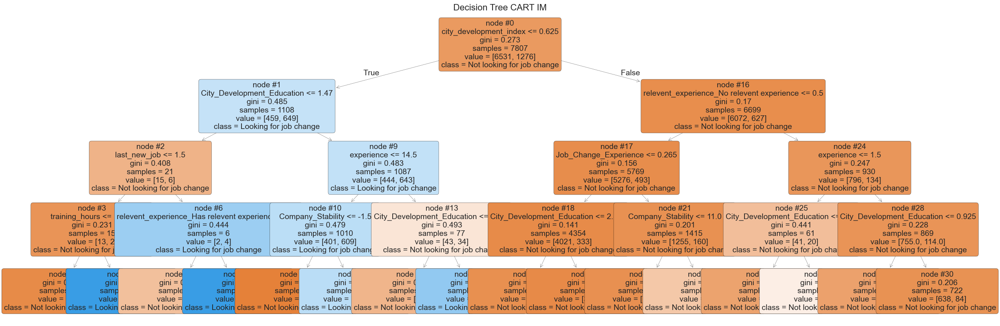

In [83]:


## PLOT CART
# Plot the decision tree with custom class labels
plt.figure(figsize=(30, 10))  # Increase the size of the figure

# Plot the tree
plot_tree(
    cart_clf_im,
    feature_names=X.columns,
    class_names=class_labels_im,
    filled=True,
    rounded=True,
    fontsize=14,  # Increase font size for better readability
    proportion=False,  # Show proportions in the nodes
    node_ids=True,  # Show node IDs
    label='all',  # Label all nodes with feature names and thresholds
  #  linewidths=0.5  # Reduce the width of the lines
)

plt.title('Decision Tree CART IM', fontsize=16)
plt.show()

In [84]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt
import numpy as np

# Define custom class labels for better readability
class_labels_im = ['Not looking for job change', 'Looking for job change']

def print_tree_nodes(tree_clf, feature_names, class_names):
    # Extract the tree attributes
    n_nodes = tree_clf.tree_.node_count
    children_left = tree_clf.tree_.children_left
    children_right = tree_clf.tree_.children_right
    features = tree_clf.tree_.feature
    thresholds = tree_clf.tree_.threshold
    values = tree_clf.tree_.value

    print(f"Total nodes: {n_nodes}")
    print()

    for i in range(n_nodes):
        # Node information
        feature = feature_names[features[i]] if features[i] != -1 else "Leaf"
        threshold = thresholds[i]
        value = values[i]
        class_value = class_names[np.argmax(value[0])]
        
        # Print information about the node
        print(f"Node {i}:")
        print(f"  Feature: {feature}")
        print(f"  Threshold: {threshold}")
        print(f"  Value: {value}")
        print(f"  Predicted Class: {class_value}")
        
        # Print children
        left_child = children_left[i]
        right_child = children_right[i]
        if left_child != -1:
            print(f"  Left Child: Node {left_child}")
        else:
            print("  Left Child: None")
        if right_child != -1:
            print(f"  Right Child: Node {right_child}")
        else:
            print("  Right Child: None")
        print()

# Assuming `cart_clf_im` is your trained DecisionTreeClassifier
print_tree_nodes(cart_clf_im, X.columns, class_labels_im)


Total nodes: 31

Node 0:
  Feature: city_development_index
  Threshold: 0.6245000064373016
  Value: [[0.83655694 0.16344306]]
  Predicted Class: Not looking for job change
  Left Child: Node 1
  Right Child: Node 16

Node 1:
  Feature: City_Development_Education
  Threshold: 1.4699999690055847
  Value: [[0.41425993 0.58574007]]
  Predicted Class: Looking for job change
  Left Child: Node 2
  Right Child: Node 9

Node 2:
  Feature: last_new_job
  Threshold: 1.5
  Value: [[0.71428571 0.28571429]]
  Predicted Class: Not looking for job change
  Left Child: Node 3
  Right Child: Node 6

Node 3:
  Feature: training_hours
  Threshold: 138.0
  Value: [[0.86666667 0.13333333]]
  Predicted Class: Not looking for job change
  Left Child: Node 4
  Right Child: Node 5

Node 4:
  Feature: major_discipline_Other
  Threshold: -2.0
  Value: [[0.92857143 0.07142857]]
  Predicted Class: Not looking for job change
  Left Child: None
  Right Child: None

Node 5:
  Feature: major_discipline_Other
  Thresho

.:. Classification Report IM.:.
              precision    recall  f1-score   support

           0       0.91      0.93      0.92      1642
           1       0.59      0.53      0.56       310

    accuracy                           0.87      1952
   macro avg       0.75      0.73      0.74      1952
weighted avg       0.86      0.87      0.86      1952

.:. Main Metrics .:.
    >> Accuracy: 87.00%
    >> Macro Avg: 74.00%
    >> Weighted Avg: 86.00%



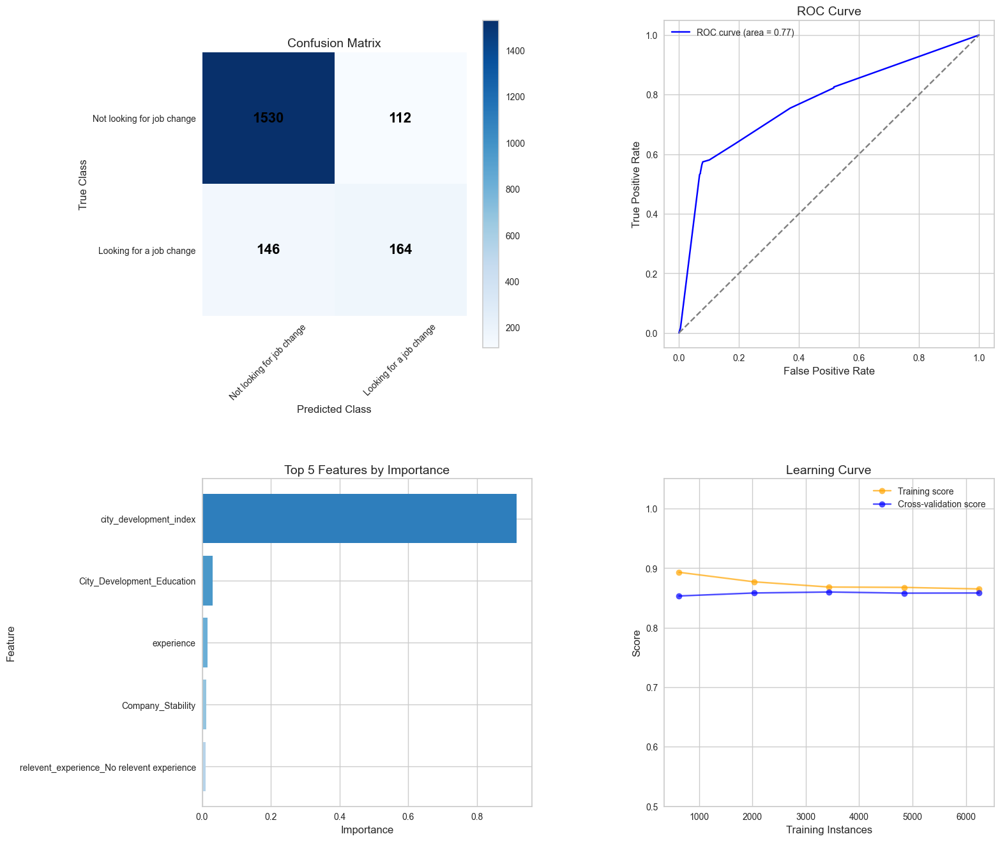

In [85]:

# Make predictions CART
y_pred = cart_clf_im.predict(X_test)

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(cart_clf_im, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# ROC Curve
y_prob = cart_clf_im.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Classification Report
classification_rep = classification_report(y_test, y_pred, output_dict=True)
df_classification_report = pd.DataFrame(classification_rep).transpose().round(2)
df_main_metrics = df_classification_report.loc[['accuracy', 'macro avg', 'weighted avg']]
df_classification_report = df_classification_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.subplots_adjust(hspace=0.4, wspace=0.4)


# Get feature importances
feature_importances = cart_clf_im.feature_importances_

# Sort features by importance
indices = np.argsort(feature_importances)[::-1]

# Select the top 5 features
top_features = indices[:5]
top_feature_names = X.columns[top_features]
top_feature_importances = feature_importances[top_features]


axs[1, 0].barh(top_feature_names[::-1], top_feature_importances[::-1], color=plt.cm.Blues(np.linspace(0.3, 0.7, len(top_feature_names))))
axs[1, 0].set_title('Top 5 Features by Importance', fontsize=14)
axs[1, 0].set_xlabel('Importance', fontsize=12)
axs[1, 0].set_ylabel('Feature', fontsize=12)

# Learning Curve
axs[1, 1].plot(train_sizes, train_mean, 'o-', color='orange', alpha=0.7, label='Training score')
axs[1, 1].plot(train_sizes, test_mean, 'o-', color='blue', alpha=0.7, label='Cross-validation score')
axs[1, 1].set_title('Learning Curve', fontsize=14)
axs[1, 1].set_xlabel('Training Instances', fontsize=12)
axs[1, 1].set_ylabel('Score', fontsize=12)
axs[1, 1].legend(loc='best', fontsize=10)
axs[1, 1].set_ylim([0.5, 1.05])

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cax = axs[0, 0].imshow(cm, interpolation='nearest', cmap='Blues')
axs[0, 0].set_title('Confusion Matrix', fontsize=14)
axs[0, 0].set_xlabel('Predicted Class', fontsize=12)
axs[0, 0].set_ylabel('True Class', fontsize=12)
axs[0, 0].set_xticks([0, 1])
axs[0, 0].set_yticks([0, 1])
axs[0, 0].set_xticklabels(['Not looking for job change', 'Looking for a job change'], rotation=45, fontsize=10)
axs[0, 0].set_yticklabels(['Not looking for job change', 'Looking for a job change'], fontsize=10)
for i in range(2):
    for j in range(2):
        axs[0, 0].text(j, i, f'{cm[i, j]}', ha='center', va='center', color='black', fontsize=16, fontweight='bold')
for spine in axs[0, 0].spines.values():
    spine.set_visible(False)
axs[0, 0].grid(False)
fig.colorbar(cax, ax=axs[0, 0])

# ROC Curve
axs[0, 1].plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
axs[0, 1].plot([0, 1], [0, 1], color='gray', linestyle='--')
axs[0, 1].set_title('ROC Curve', fontsize=14)
axs[0, 1].set_xlabel('False Positive Rate', fontsize=12)
axs[0, 1].set_ylabel('True Positive Rate', fontsize=12)
axs[0, 1].legend(loc='best', fontsize=10)

# Print the classification report
report_text = (
    ".:. Classification Report IM.:.\n"
    f"{classification_report(y_test, y_pred)}\n"
    ".:. Main Metrics .:.\n"
    f"    >> Accuracy: {df_main_metrics.loc['accuracy', 'f1-score'] * 100:.2f}%\n"
    f"    >> Macro Avg: {df_main_metrics.loc['macro avg', 'f1-score'] * 100:.2f}%\n"
    f"    >> Weighted Avg: {df_main_metrics.loc['weighted avg', 'f1-score'] * 100:.2f}%\n"
)
print(report_text)

plt.show()

#### Model Summary

**City Development Index:**

Higher Index (> 0.625): Individuals from cities with a higher development index are more likely to look for a job. This suggests that people in more developed areas might be more inclined to seek better opportunities or have more job options available.

**Training Hours:**

Low Training Hours (≤ 12.5): Individuals with fewer training hours are more likely to look for a job. This could imply that a lack of training opportunities or skill development might push employees to seek other opportunities where they can enhance their skills. Very High 

Training Hours (> 107.5): Those with very high training hours are not looking for a job, indicating they might be engaged and satisfied with their current roles or have recently invested in their current positions.

**Education Enrollment:**

Not Enrolled in University: Individuals who are not enrolled in any educational program are less likely to look for a job. This might indicate stability or satisfaction with their current employment situation, possibly due to focusing on their careers.

**Company Type:**

Non-Public Sector: Individuals working in non-public sectors are more likely to consider changing jobs. This could reflect the dynamic nature of private-sector employment, where job changes might be more common due to varying job offers and opportunities.

**Key Differences**
**Node Prioritization:**

CART: After splitting on last_new_job, it evaluates training_hours. This means training_hours is given a high priority in the decision-making process if the last_new_job threshold is not met.
C5.0-like: Instead of training_hours, the relevent_experience is used as the next split after last_new_job. This indicates a prioritization of relevant experience over training hours in the decision-making process.

**Feature Focus:**

CART:The focus on training_hours suggests an emphasis on the amount of training a candidate has received as a factor in predicting job change.
C5.0-like: The focus on relevent_experience indicates a greater emphasis on whether a candidate has relevant experience, which might be more directly related to job change likelihood.

**Interpretation**
CART emphasizes training hours more significantly after evaluating job-related factors. This implies that for the CART model, the amount of training might be a more crucial predictor if a candidate has not changed jobs recently.
C5.0-like prioritizes relevant experience over training hours. This reflects a view that having relevant experience is more critical in determining job change likelihood, even when the candidate's previous job tenure or training is considered.
In summary, while both decision trees use similar features, they differ in how they prioritize these features. The CART model places significant weight on training_hours, whereas the C5.0-like model considers relevent_experience more critical for splitting decisions, leading to potentially different insights into job change predictions.

#### 8.5.2 | Decisssion Tree - C5.0 & CART - Balanced Classes (SMOTE)

In [86]:
#!pip install graphviz pydotplus
#!pip install graphviz
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz
import warnings

Class distribution after SMOTE:
target
0    50.0
1    50.0
Name: proportion, dtype: float64

Model Evaluation Summary
       Model  Accuracy   ROC AUC  Precision (Class 0)  Precision (Class 1)  \
0       CART  0.766055  0.827617             0.752776             0.780629   
1  C5.0-like  0.767584  0.830309             0.753792             0.782776   

   Recall (Class 0)  Recall (Class 1)  F1-Score (Class 0)  F1-Score (Class 1)  
0          0.790184          0.742073            0.771027            0.760863  
1          0.792638          0.742683            0.772727            0.762203  


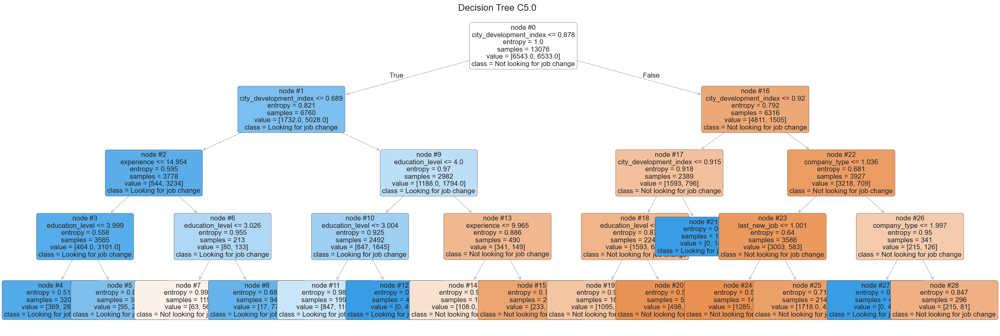

In [87]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
import pandas as pd
from IPython.display import display, Image

# Assuming df_train_encoded is your training DataFrame
X = df_train_encoded.drop('target', axis=1)
y = df_train_encoded['target']

# Initialize SMOTE
smote = SMOTE(random_state=42)
# Apply SMOTE to oversample the minority class
X_resampled, y_resampled = smote.fit_resample(X, y)

# Display the new class distribution
print("Class distribution after SMOTE:")
print(pd.Series(y_resampled).value_counts(normalize=True) * 100)

# Split the resampled data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# CART model with Gini
cart_clf = DecisionTreeClassifier(criterion='gini', max_depth=4, random_state=42)
cart_clf.fit(X_train, y_train)

# C5.0-like model with Entropy
c50_clf = DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=42)
c50_clf.fit(X_train, y_train)



# Predictions for CART
y_pred_cart = cart_clf.predict(X_test)
accuracy_cart = accuracy_score(y_test, y_pred_cart)
roc_auc_cart = roc_auc_score(y_test, cart_clf.predict_proba(X_test)[:, 1])

# Generate classification report with specified labels
report_cart = classification_report(y_test, y_pred_cart, output_dict=True, labels=[0, 1])

# Predictions for C5.0-like
y_pred_c50 = c50_clf.predict(X_test)
accuracy_c50 = accuracy_score(y_test, y_pred_c50)
roc_auc_c50 = roc_auc_score(y_test, c50_clf.predict_proba(X_test)[:, 1])

# Generate classification report with specified labels
report_c50 = classification_report(y_test, y_pred_c50, output_dict=True, labels=[0, 1])

# Create a summary table
summary_table = pd.DataFrame({
    'Model': ['CART', 'C5.0-like'],
    'Accuracy': [accuracy_cart, accuracy_c50],
    'ROC AUC': [roc_auc_cart, roc_auc_c50],
    'Precision (Class 0)': [report_cart['0']['precision'], report_c50['0']['precision']],
    'Precision (Class 1)': [report_cart['1']['precision'], report_c50['1']['precision']],
    'Recall (Class 0)': [report_cart['0']['recall'], report_c50['0']['recall']],
    'Recall (Class 1)': [report_cart['1']['recall'], report_c50['1']['recall']],
    'F1-Score (Class 0)': [report_cart['0']['f1-score'], report_c50['0']['f1-score']],
    'F1-Score (Class 1)': [report_cart['1']['f1-score'], report_c50['1']['f1-score']],
})

# Print summary table
print("\nModel Evaluation Summary")
print(summary_table)


# Define custom class labels for better readability
class_labels = ['Not looking for job change', 'Looking for job change']

# Plot the decision tree with custom class labels
plt.figure(figsize=(30, 10))

# Plot the tree
plot_tree(
    c50_clf,
    feature_names=X.columns,
    class_names=class_labels,
    filled=True,
    rounded=True,
    fontsize=12,  # Increase font size for better readability
    proportion=False,  # Show proportions in the nodes
    node_ids=True,  # Show node IDs
    label='all',  # Label all nodes with feature names and thresholds
  #linewidths=0.5  # Reduce the width of the lines
)

plt.title('Decision Tree C5.0', fontsize=16)
plt.show()


In [88]:
# Assuming `cart_clf_im` is your trained DecisionTreeClassifier
print_tree_nodes(c50_clf, X.columns, class_labels_im)

Total nodes: 29

Node 0:
  Feature: city_development_index
  Threshold: 0.8778928518295288
  Value: [[0.50038238 0.49961762]]
  Predicted Class: Not looking for job change
  Left Child: Node 1
  Right Child: Node 16

Node 1:
  Feature: city_development_index
  Threshold: 0.6889784336090088
  Value: [[0.25621302 0.74378698]]
  Predicted Class: Looking for job change
  Left Child: Node 2
  Right Child: Node 9

Node 2:
  Feature: experience
  Threshold: 14.954304218292236
  Value: [[0.14399153 0.85600847]]
  Predicted Class: Looking for job change
  Left Child: Node 3
  Right Child: Node 6

Node 3:
  Feature: education_level
  Threshold: 3.9993964433670044
  Value: [[0.13015428 0.86984572]]
  Predicted Class: Looking for job change
  Left Child: Node 4
  Right Child: Node 5

Node 4:
  Feature: major_discipline_Other
  Threshold: -2.0
  Value: [[0.1153125 0.8846875]]
  Predicted Class: Looking for job change
  Left Child: None
  Right Child: None

Node 5:
  Feature: major_discipline_Other


.:. Classification Report c5.0.:.
              precision    recall  f1-score   support

           0       0.75      0.79      0.77      1630
           1       0.78      0.74      0.76      1640

    accuracy                           0.77      3270
   macro avg       0.77      0.77      0.77      3270
weighted avg       0.77      0.77      0.77      3270

.:. Main Metrics .:.
    >> Accuracy: 77.00%
    >> Macro Avg: 77.00%
    >> Weighted Avg: 77.00%



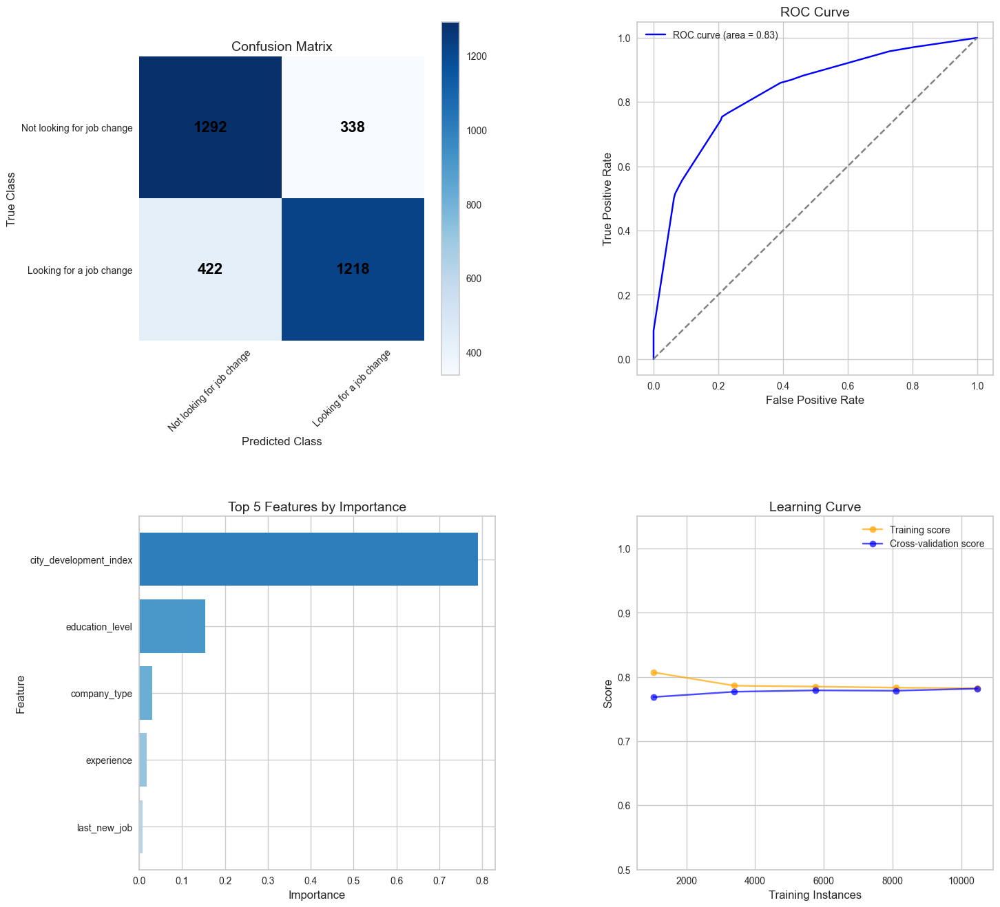

In [89]:

# Make predictions c5.0
y_pred = c50_clf.predict(X_test)

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(c50_clf, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# ROC Curve
y_prob = c50_clf.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Classification Report
classification_rep = classification_report(y_test, y_pred, output_dict=True)
df_classification_report = pd.DataFrame(classification_rep).transpose().round(2)
df_main_metrics = df_classification_report.loc[['accuracy', 'macro avg', 'weighted avg']]
df_classification_report = df_classification_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Top Features Bar Chart
# Get feature importances
feature_importances = c50_clf.feature_importances_

# Sort features by importance
indices = np.argsort(feature_importances)[::-1]

# Select the top 5 features
top_features = indices[:5]
top_feature_names = X.columns[top_features]
top_feature_importances = feature_importances[top_features]

axs[1, 0].barh(top_feature_names[::-1], top_feature_importances[::-1], color=plt.cm.Blues(np.linspace(0.3, 0.7, len(top_feature_names))))
axs[1, 0].set_title('Top 5 Features by Importance', fontsize=14)
axs[1, 0].set_xlabel('Importance', fontsize=12)
axs[1, 0].set_ylabel('Feature', fontsize=12)

# Learning Curve
axs[1, 1].plot(train_sizes, train_mean, 'o-', color='orange', alpha=0.7, label='Training score')
axs[1, 1].plot(train_sizes, test_mean, 'o-', color='blue', alpha=0.7, label='Cross-validation score')
axs[1, 1].set_title('Learning Curve', fontsize=14)
axs[1, 1].set_xlabel('Training Instances', fontsize=12)
axs[1, 1].set_ylabel('Score', fontsize=12)
axs[1, 1].legend(loc='best', fontsize=10)
axs[1, 1].set_ylim([0.5, 1.05])

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cax = axs[0, 0].imshow(cm, interpolation='nearest', cmap='Blues')
axs[0, 0].set_title('Confusion Matrix', fontsize=14)
axs[0, 0].set_xlabel('Predicted Class', fontsize=12)
axs[0, 0].set_ylabel('True Class', fontsize=12)
axs[0, 0].set_xticks([0, 1])
axs[0, 0].set_yticks([0, 1])
axs[0, 0].set_xticklabels(['Not looking for job change', 'Looking for a job change'], rotation=45, fontsize=10)
axs[0, 0].set_yticklabels(['Not looking for job change', 'Looking for a job change'], fontsize=10)
for i in range(2):
    for j in range(2):
        axs[0, 0].text(j, i, f'{cm[i, j]}', ha='center', va='center', color='black', fontsize=16, fontweight='bold')
for spine in axs[0, 0].spines.values():
    spine.set_visible(False)
axs[0, 0].grid(False)
fig.colorbar(cax, ax=axs[0, 0])

# ROC Curve
axs[0, 1].plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
axs[0, 1].plot([0, 1], [0, 1], color='gray', linestyle='--')
axs[0, 1].set_title('ROC Curve', fontsize=14)
axs[0, 1].set_xlabel('False Positive Rate', fontsize=12)
axs[0, 1].set_ylabel('True Positive Rate', fontsize=12)
axs[0, 1].legend(loc='best', fontsize=10)

# Print the classification report
report_text = (
    ".:. Classification Report c5.0.:.\n"
    f"{classification_report(y_test, y_pred)}\n"
    ".:. Main Metrics .:.\n"
    f"    >> Accuracy: {df_main_metrics.loc['accuracy', 'f1-score'] * 100:.2f}%\n"
    f"    >> Macro Avg: {df_main_metrics.loc['macro avg', 'f1-score'] * 100:.2f}%\n"
    f"    >> Weighted Avg: {df_main_metrics.loc['weighted avg', 'f1-score'] * 100:.2f}%\n"
)
print(report_text)

plt.show()

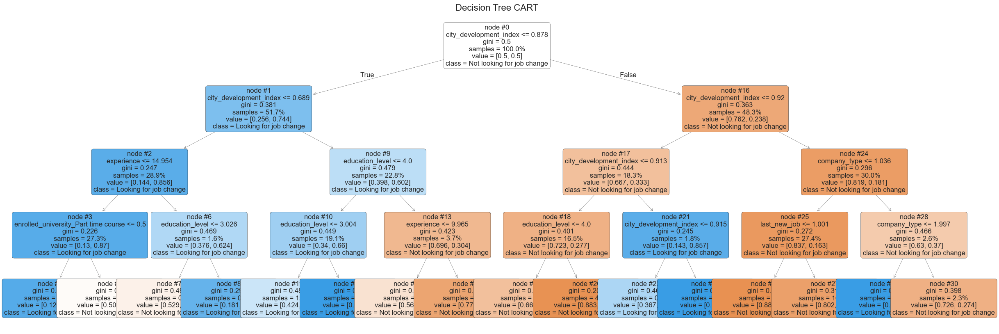

In [90]:

## PLOT CART
# Plot the decision tree with custom class labels
plt.figure(figsize=(30, 10))  # Increase the size of the figure

# Plot the tree
plot_tree(
    cart_clf,
    feature_names=X.columns,
    class_names=class_labels,
    filled=True,
    rounded=True,
    fontsize=12,  # Increase font size for better readability
    proportion=True,  # Show proportions in the nodes
    node_ids=True,  # Show node IDs
    label='all',  # Label all nodes with feature names and thresholds
  #  linewidths=0.5  # Reduce the width of the lines
)

plt.title('Decision Tree CART', fontsize=16)
plt.show()

In [91]:
# Assuming `cart_clf_im` is your trained DecisionTreeClassifier
print_tree_nodes(cart_clf, X.columns, class_labels_im)

Total nodes: 31

Node 0:
  Feature: city_development_index
  Threshold: 0.8778928518295288
  Value: [[0.50038238 0.49961762]]
  Predicted Class: Not looking for job change
  Left Child: Node 1
  Right Child: Node 16

Node 1:
  Feature: city_development_index
  Threshold: 0.6889784336090088
  Value: [[0.25621302 0.74378698]]
  Predicted Class: Looking for job change
  Left Child: Node 2
  Right Child: Node 9

Node 2:
  Feature: experience
  Threshold: 14.954304218292236
  Value: [[0.14399153 0.85600847]]
  Predicted Class: Looking for job change
  Left Child: Node 3
  Right Child: Node 6

Node 3:
  Feature: enrolled_university_Part time course
  Threshold: 0.5
  Value: [[0.13015428 0.86984572]]
  Predicted Class: Looking for job change
  Left Child: Node 4
  Right Child: Node 5

Node 4:
  Feature: major_discipline_Other
  Threshold: -2.0
  Value: [[0.12400228 0.87599772]]
  Predicted Class: Looking for job change
  Left Child: None
  Right Child: None

Node 5:
  Feature: major_disciplin

.:. Classification Report Balance.:.
              precision    recall  f1-score   support

           0       0.75      0.79      0.77      1630
           1       0.78      0.74      0.76      1640

    accuracy                           0.77      3270
   macro avg       0.77      0.77      0.77      3270
weighted avg       0.77      0.77      0.77      3270

.:. Main Metrics .:.
    >> Accuracy: 77.00%
    >> Macro Avg: 77.00%
    >> Weighted Avg: 77.00%



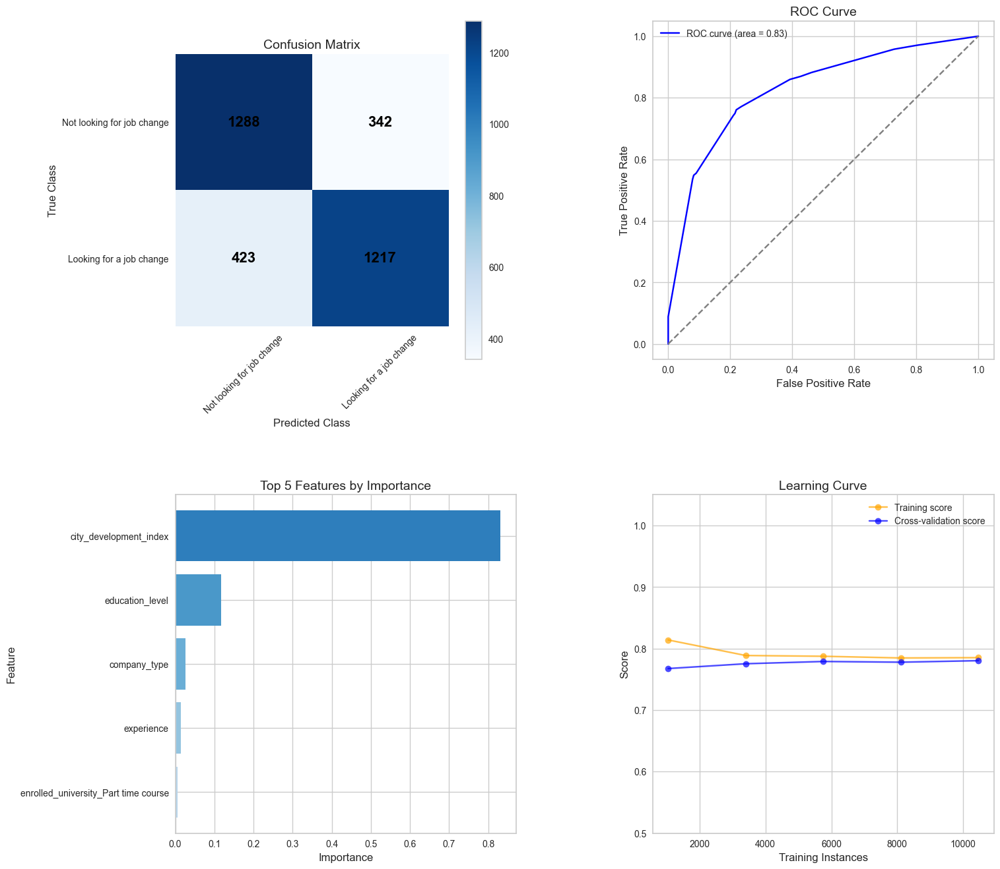

In [92]:

# Make predictions CART
y_pred = cart_clf.predict(X_test)

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(cart_clf, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# ROC Curve
y_prob = cart_clf.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Classification Report
classification_rep = classification_report(y_test, y_pred, output_dict=True)
df_classification_report = pd.DataFrame(classification_rep).transpose().round(2)
df_main_metrics = df_classification_report.loc[['accuracy', 'macro avg', 'weighted avg']]
df_classification_report = df_classification_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Top Features Bar Chart
# Get feature importances
feature_importances = cart_clf.feature_importances_

# Sort features by importance
indices = np.argsort(feature_importances)[::-1]

# Select the top 5 features
top_features = indices[:5]
top_feature_names = X.columns[top_features]
top_feature_importances = feature_importances[top_features]

axs[1, 0].barh(top_feature_names[::-1], top_feature_importances[::-1], color=plt.cm.Blues(np.linspace(0.3, 0.7, len(top_feature_names))))
axs[1, 0].set_title('Top 5 Features by Importance', fontsize=14)
axs[1, 0].set_xlabel('Importance', fontsize=12)
axs[1, 0].set_ylabel('Feature', fontsize=12)

# Learning Curve
axs[1, 1].plot(train_sizes, train_mean, 'o-', color='orange', alpha=0.7, label='Training score')
axs[1, 1].plot(train_sizes, test_mean, 'o-', color='blue', alpha=0.7, label='Cross-validation score')
axs[1, 1].set_title('Learning Curve', fontsize=14)
axs[1, 1].set_xlabel('Training Instances', fontsize=12)
axs[1, 1].set_ylabel('Score', fontsize=12)
axs[1, 1].legend(loc='best', fontsize=10)
axs[1, 1].set_ylim([0.5, 1.05])

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cax = axs[0, 0].imshow(cm, interpolation='nearest', cmap='Blues')
axs[0, 0].set_title('Confusion Matrix', fontsize=14)
axs[0, 0].set_xlabel('Predicted Class', fontsize=12)
axs[0, 0].set_ylabel('True Class', fontsize=12)
axs[0, 0].set_xticks([0, 1])
axs[0, 0].set_yticks([0, 1])
axs[0, 0].set_xticklabels(['Not looking for job change', 'Looking for a job change'], rotation=45, fontsize=10)
axs[0, 0].set_yticklabels(['Not looking for job change', 'Looking for a job change'], fontsize=10)
for i in range(2):
    for j in range(2):
        axs[0, 0].text(j, i, f'{cm[i, j]}', ha='center', va='center', color='black', fontsize=16, fontweight='bold')
for spine in axs[0, 0].spines.values():
    spine.set_visible(False)
axs[0, 0].grid(False)
fig.colorbar(cax, ax=axs[0, 0])

# ROC Curve
axs[0, 1].plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
axs[0, 1].plot([0, 1], [0, 1], color='gray', linestyle='--')
axs[0, 1].set_title('ROC Curve', fontsize=14)
axs[0, 1].set_xlabel('False Positive Rate', fontsize=12)
axs[0, 1].set_ylabel('True Positive Rate', fontsize=12)
axs[0, 1].legend(loc='best', fontsize=10)

# Print the classification report
report_text = (
    ".:. Classification Report Balance.:.\n"
    f"{classification_report(y_test, y_pred)}\n"
    ".:. Main Metrics .:.\n"
    f"    >> Accuracy: {df_main_metrics.loc['accuracy', 'f1-score'] * 100:.2f}%\n"
    f"    >> Macro Avg: {df_main_metrics.loc['macro avg', 'f1-score'] * 100:.2f}%\n"
    f"    >> Weighted Avg: {df_main_metrics.loc['weighted avg', 'f1-score'] * 100:.2f}%\n"
)
print(report_text)

plt.show()

#### Model Accuracy Summary Imbalance vs Balance

The target variable classifies candidates as either "Not looking for a job change" (Class 0) or "Looking for a job change" (Class 1). The aim is to predict which candidates are more likely to seek new employment after completing a company's training program.

**Class Distribution and Model Performance**

Initially, both models demonstrated high accuracy (approximately 86.7%) and solid ROC AUC scores (~0.77). However, these metrics did not fully reflect the models' performance in predicting Class 1 (candidates looking for a job change) due to the class imbalance:

CART Model: Recall for Class 1 was 0.529, and the F1-Score was 0.560.
C5.0-like Model: Recall for Class 1 was 0.526, and the F1-Score was 0.557.
This imbalance meant that the models were not effectively identifying candidates who are likely to seek new employment, a crucial insight for the company.

**Impact of SMOTE**
Post-SMOTE, where the class distribution was balanced, the models showed significant improvements in predicting Class 1:

CART Model:
Recall for Class 1 increased to 0.743, representing a 40.5% improvement.
F1-Score for Class 1 improved to 0.762, a 36.1% increase.

C5.0-like Model:
Recall for Class 1 rose to 0.743, a 41.2% improvement.
F1-Score for Class 1 reached 0.762, a 36.8% improvement.
Despite a reduction in overall accuracy (76.6% for CART and 76.8% for C5.0-like), the ROC AUC scores improved (0.828 for CART and 0.830 for C5.0-like), indicating better performance in distinguishing between the two classes.

**Business Implications**
For the company specializing in Big Data and Data Science, which aims to identify candidates who are genuinely interested in long-term employment versus those seeking new opportunities, the improvements in recall and F1-Score for Class 1 after SMOTE are crucial:

Enhanced Candidate Insights: The ability to more accurately identify candidates looking for a job change (Class 1) means the company can better target their training and onboarding efforts. This helps in reducing the cost and time associated with training and planning.

### Performance Summary of Top Features for Classification

**Summary of Decision Tree Insights:**

**Node 1: city_development_index**

Threshold: 0.6889784336090088
Implication: Employees in cities with a lower city_development_index are more likely to be looking for a job change. This suggests that employees in less developed cities may be seeking better opportunities and working conditions elsewhere.

**Node 2: experience**

Threshold: 14.954304218292236 years
Implication: Among employees in more developed cities, those with less experience (≤ 14.95 years) are more likely to be looking for a job change. This indicates that less experienced employees may feel less secure or satisfied in their current roles and are more inclined to explore new opportunities.

**Node 3: enrolled_university_Part time course**

Threshold: 0.5
Implication: For those with more experience (> 14.95 years), employees who are enrolled in part-time courses are still likely to be looking for a job change. This suggests that employees engaged in further education or skills development might be seeking roles that better match their evolving career goals or qualifications.

# 9. | Model Evaluation

#### Chart of all ROC together and Table comparison of evaluation metrics in a table

Class distribution after SMOTE:
target
0    50.0
1    50.0
Name: proportion, dtype: float64


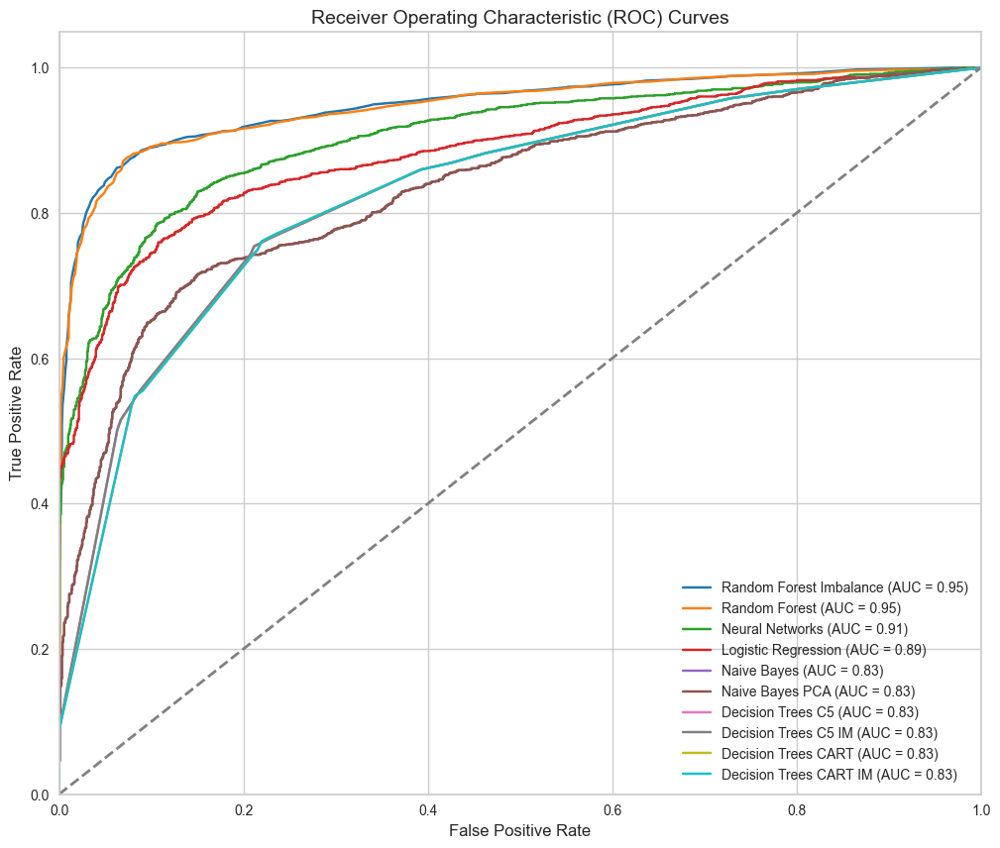

In [93]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from imblearn.over_sampling import SMOTE

# Assuming df_train_encoded is your DataFrame with features and target
X = df_train_encoded.drop('target', axis=1)
y = df_train_encoded['target']

# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to oversample the minority class
X_resampled, y_resampled = smote.fit_resample(X, y)

# Display the new class distribution
print("Class distribution after SMOTE:")
print(pd.Series(y_resampled).value_counts(normalize=True) * 100)

# Split the resampled data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Initialize models
models = {
    'Random Forest Imbalance': model_rd_im,
    'Random Forest': model_rd,
    'Naive Bayes': model_nb,
    'Naive Bayes PCA': model_nb_pca,
    'Logistic Regression': model_lg,
    'Decision Trees C5': c50_clf,
    'Decision Trees CART': cart_clf,
    'Decision Trees C5 IM': c50_clf_im,
    'Decision Trees CART IM': cart_clf_im,
    'Neural Networks': model_nn
}

# Fit models and compute ROC AUC scores
roc_auc_scores = {}
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    roc_auc_scores[model_name] = (fpr, tpr, roc_auc)

# Sort models by AUC score from high to low
sorted_models = sorted(roc_auc_scores.items(), key=lambda x: x[1][2], reverse=True)

# Plot ROC curves
plt.figure(figsize=(12, 10))

# Define a colormap
colors = plt.cm.get_cmap('tab10', len(models))

for i, (model_name, (fpr, tpr, roc_auc)) in enumerate(sorted_models):
    # Plot ROC curve with a distinctive color
    plt.plot(fpr, tpr, color=colors(i), label=f'{model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line (chance level)
plt.plot([0, 1], [0, 1], 'k--', lw=2, color='gray')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('Receiver Operating Characteristic (ROC) Curves', fontsize=14)
plt.legend(loc="lower right", fontsize=10)
plt.grid(True)

# Show the plot
plt.show()


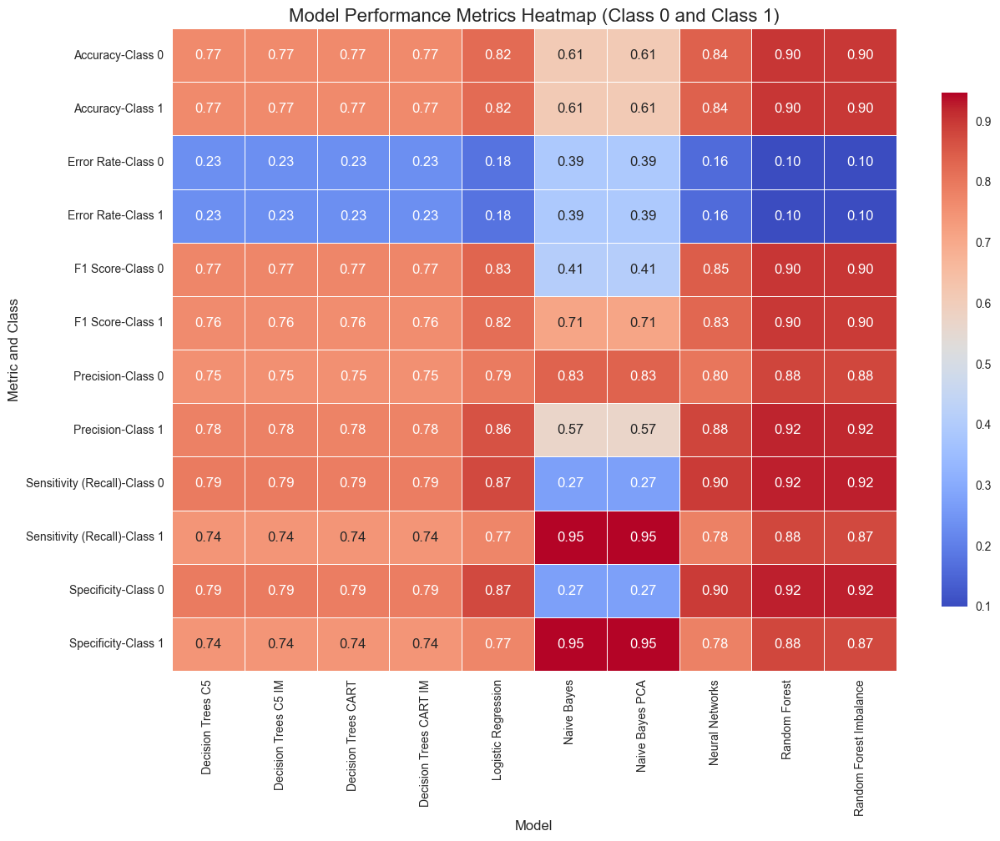

In [94]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

# Initialize an empty dictionary to hold the metrics
metrics = {
    'Model': [],
    'Class': [],
    'Accuracy': [],
    'Error Rate': [],
    'Sensitivity (Recall)': [],
    'Specificity': [],
    'Precision': [],
    'F1 Score': []
}

# Compute metrics for each model and class
for model_name, model in models.items():
    # Predict class labels and probabilities
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]
    
    for class_label in [0, 1]:
        # Calculate confusion matrix
        cm = confusion_matrix(y_test, y_pred, labels=[class_label, 1-class_label])
        tn, fp, fn, tp = cm.ravel()  # True negatives, false positives, false negatives, true positives
        
        # Calculate metrics
        accuracy = accuracy_score(y_test, y_pred)
        error_rate = 1 - accuracy
        sensitivity = recall_score(y_test, y_pred, pos_label=class_label)
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        precision = precision_score(y_test, y_pred, pos_label=class_label)
        f1 = f1_score(y_test, y_pred, pos_label=class_label)
        
        # Append metrics to the dictionary
        metrics['Model'].append(model_name)
        metrics['Class'].append(f'Class {class_label}')
        metrics['Accuracy'].append(accuracy)
        metrics['Error Rate'].append(error_rate)
        metrics['Sensitivity (Recall)'].append(sensitivity)
        metrics['Specificity'].append(specificity)
        metrics['Precision'].append(precision)
        metrics['F1 Score'].append(f1)

# Convert the metrics dictionary to a DataFrame
metrics_df = pd.DataFrame(metrics)

# Pivot the DataFrame to get metrics for each class in separate columns
metrics_df_pivot = metrics_df.pivot_table(index=['Class', 'Model'], 
                                          values=['Accuracy', 'Error Rate', 'Sensitivity (Recall)', 'Specificity', 'Precision', 'F1 Score'], 
                                          aggfunc='mean').reset_index()

# Reshape DataFrame for better visualization
metrics_df_long = pd.melt(metrics_df_pivot, id_vars=['Model', 'Class'], 
                          value_vars=['Accuracy', 'Error Rate', 'Sensitivity (Recall)', 'Specificity', 'Precision', 'F1 Score'],
                          var_name='Metric', value_name='Value')

# Pivot the DataFrame for heatmap visualization
heatmap_df = metrics_df_long.pivot_table(index=['Metric', 'Class'], columns='Model', values='Value')

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_df, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, cbar_kws={'shrink': 0.8})

# Set titles and labels
plt.title('Model Performance Metrics Heatmap (Class 0 and Class 1)', fontsize=16)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Metric and Class', fontsize=12)

# Show the plot
plt.show()


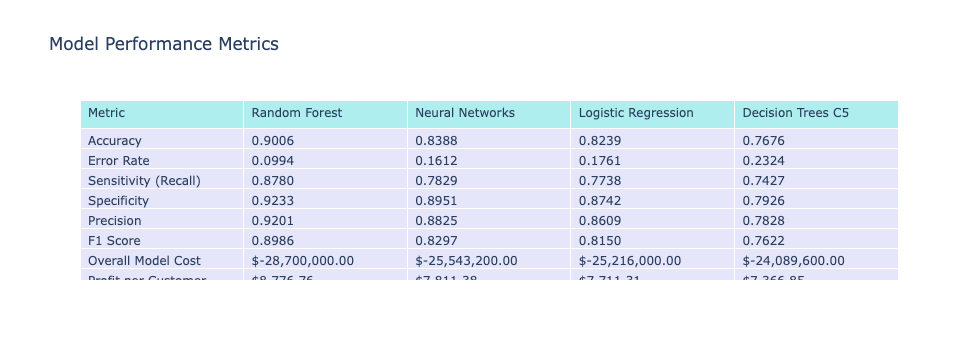

In [95]:
import pandas as pd
import plotly.graph_objects as go
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

# Define cost values
COST_FP = 800  # Cost of False Positive
COST_TP = -20000  # Cost of True Positive

# List of models to evaluate
models_to_evaluate = {
    'Random Forest': model_rd,
    'Neural Networks': model_nn,
    'Logistic Regression': model_lg,
    'Decision Trees C5': c50_clf
}

# Initialize an empty dictionary to hold the metrics
metrics = {
    'Model': [],
    'Accuracy': [],
    'Error Rate': [],
    'Sensitivity (Recall)': [],
    'Specificity': [],
    'Precision': [],
    'F1 Score': [],
    'Overall Model Cost': [],
    'Profit per Customer': []
}

# Compute metrics for each model
for model_name, model in models_to_evaluate.items():
    # Predict class labels and probabilities
    y_pred = model.predict(X_test)
    
    # Calculate confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()  # True negatives, false positives, false negatives, true positives
    
    # Calculate GT from the confusion matrix
    GT = tn + fp + fn + tp
    
    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    error_rate = 1 - accuracy
    sensitivity = recall_score(y_test, y_pred)  # Same as recall or True Positive Rate
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    precision = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    # Calculate cost metrics
    overall_model_cost = (fp * COST_FP) + (tp * COST_TP)
    profit_per_customer = -overall_model_cost / GT
    
    # Append metrics to the dictionary
    metrics['Model'].append(model_name)
    metrics['Accuracy'].append(f"{accuracy:.4f}")
    metrics['Error Rate'].append(f"{error_rate:.4f}")
    metrics['Sensitivity (Recall)'].append(f"{sensitivity:.4f}")
    metrics['Specificity'].append(f"{specificity:.4f}")
    metrics['Precision'].append(f"{precision:.4f}")
    metrics['F1 Score'].append(f"{f1:.4f}")
    metrics['Overall Model Cost'].append(f"${overall_model_cost:,.2f}")
    metrics['Profit per Customer'].append(f"${profit_per_customer:,.2f}")

# Convert the metrics dictionary to a DataFrame
metrics_df = pd.DataFrame(metrics)

# Transpose the DataFrame to have metrics as rows and models as columns
metrics_df.set_index('Model', inplace=True)
metrics_df = metrics_df.T

# Create a plotly table
fig = go.Figure(data=[go.Table(
    header=dict(values=['Metric'] + list(metrics_df.columns),
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[metrics_df.index] + [metrics_df[col] for col in metrics_df.columns],
               fill_color='lavender',
               align='left'))
])

# Set titles and labels
fig.update_layout(title_text='Model Performance Metrics')

# Show the plot
fig.show()


#### 9.1.| Train Model Without Cost Matrix Random Forest

In [96]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

# Sample Data (replace with actual DataFrame)
# df_train_encoded = pd.read_csv('path_to_data.csv')  # Your actual data loading code

# Assuming df_train_encoded is your training DataFrame
X = df_train_encoded.drop('target', axis=1)
y = df_train_encoded['target']

# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to oversample the minority class
X_resampled, y_resampled = smote.fit_resample(X, y)

# Split the resampled data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Train the Random Forest model
model_rd = RandomForestClassifier(random_state=42)
model_rd.fit(X_train, y_train)

# Make predictions
y_pred = model_rd.predict(X_test)

# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()  # True negatives, false positives, false negatives, true positives

# Calculate GT from the confusion matrix
GT = tn + fp + fn + tp

# Calculate metrics without considering costs
accuracy = accuracy_score(y_test, y_pred)
error_rate = 1 - accuracy
sensitivity = recall_score(y_test, y_pred)  # Same as recall or True Positive Rate
specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
precision = precision_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate cost metrics
overall_model_cost = (fp * COST_FP) + (tp * COST_TP)
profit_per_customer = -overall_model_cost / GT

# Initialize a dictionary to hold the metrics before cost
metrics_before_cost = {
    'Accuracy': [f"{accuracy:.4f}"],
    'Error Rate': [f"{error_rate:.4f}"],
    'Sensitivity (Recall)': [f"{sensitivity:.4f}"],
    'Specificity': [f"{specificity:.4f}"],
    'Precision': [f"{precision:.4f}"],
    'F1 Score': [f"{f1:.4f}"],
    'Overall Model Cost': [f"${overall_model_cost:,.2f}"],
    'Profit per Customer': [f"${profit_per_customer:,.2f}"]
}

# Display metrics before considering costs
print("Metrics before considering cost matrix:")
metrics_before_cost_df = pd.DataFrame(metrics_before_cost, index=['Random Forest'])
print(metrics_before_cost_df.T)


Metrics before considering cost matrix:
                        Random Forest
Accuracy                       0.9006
Error Rate                     0.0994
Sensitivity (Recall)           0.8780
Specificity                    0.9233
Precision                      0.9201
F1 Score                       0.8986
Overall Model Cost    $-28,700,000.00
Profit per Customer         $8,776.76


#### 9.2.| Apply Cost Matrix Random Forest

In [97]:
import numpy as np
from sklearn.metrics import roc_curve

# Get predicted probabilities
y_prob = model_rd.predict_proba(X_test)[:, 1]

# Define cost matrix
COST_FP = 800  # Cost of False Positive
COST_TP = -20000  # Cost of True Positive

# Calculate ROC curve to choose threshold
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Define a function to calculate cost for a given threshold
def calculate_cost(threshold):
    y_pred_adjusted = (y_prob >= threshold).astype(int)
    cm_adjusted = confusion_matrix(y_test, y_pred_adjusted)
    tn, fp, fn, tp = cm_adjusted.ravel()
    overall_model_cost = (fp * COST_FP) + (tp * COST_TP)
    return overall_model_cost, tn, fp, fn, tp

# Choose a threshold that minimizes cost (for example)
thresholds_cost = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
best_threshold = thresholds_cost[0]
min_cost = float('inf')
best_metrics = None

for threshold in thresholds_cost:
    cost, tn_cost, fp_cost, fn_cost, tp_cost = calculate_cost(threshold)
    if cost < min_cost:
        min_cost = cost
        best_threshold = threshold
        best_metrics = (tn_cost, fp_cost, fn_cost, tp_cost)

# Predict with the best threshold
y_pred_cost = (y_prob >= best_threshold).astype(int)

# Calculate confusion matrix and metrics with cost matrix
tn_cost, fp_cost, fn_cost, tp_cost = best_metrics
GT_cost = tn_cost + fp_cost + fn_cost + tp_cost


# Calculate confusion matrix
cm_rd_cost = confusion_matrix(y_test, y_pred_cost)
tn_cost_lg, fp_cost_lg, fn_cost_lg ,tp_cost_lg = cm_rd_cost.ravel()




accuracy_cost = accuracy_score(y_test, y_pred_cost)
error_rate_cost = 1 - accuracy_cost
sensitivity_cost = recall_score(y_test, y_pred_cost)
specificity_cost = tn_cost / (tn_cost + fp_cost) if (tn_cost + fp_cost) > 0 else 0
precision_cost = precision_score(y_test, y_pred_cost)
f1_cost = f1_score(y_test, y_pred_cost)
overall_model_cost_cost = (fp_cost * COST_FP) + (tp_cost * COST_TP)
profit_per_customer_cost = -overall_model_cost_cost / GT_cost

# Initialize a dictionary to hold the metrics after considering costs
metrics_after_cost = {
    'Accuracy': [f"{accuracy_cost:.4f}"],
    'Error Rate': [f"{error_rate_cost:.4f}"],
    'Sensitivity (Recall)': [f"{sensitivity_cost:.4f}"],
    'Specificity': [f"{specificity_cost:.4f}"],
    'Precision': [f"{precision_cost:.4f}"],
    'F1 Score': [f"{f1_cost:.4f}"],
    'Overall Model Cost': [f"${overall_model_cost_cost:,.2f}"],
    'Profit per Customer': [f"${profit_per_customer_cost:,.2f}"]
}

# Display metrics after considering costs
print("\nMetrics after considering cost matrix:")
metrics_after_cost_df = pd.DataFrame(metrics_after_cost, index=['Random Forest'])
print(metrics_after_cost_df.T)



Metrics after considering cost matrix:
                        Random Forest
Accuracy                       0.7003
Error Rate                     0.2997
Sensitivity (Recall)           0.9756
Specificity                    0.4233
Precision                      0.6299
F1 Score                       0.7656
Overall Model Cost    $-31,248,000.00
Profit per Customer         $9,555.96


#### 9.3.| Comparison Before and After Cost Function Random Forest

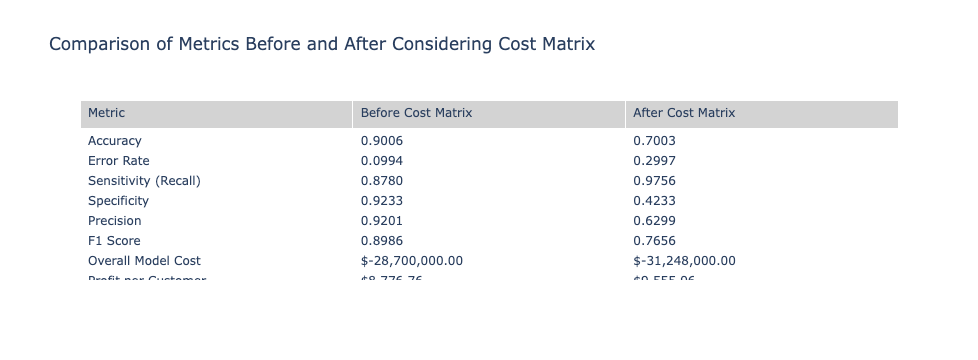

In [98]:
# Combine both metrics into a single DataFrame for comparison
comparison_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Error Rate', 'Sensitivity (Recall)', 'Specificity', 'Precision', 'F1 Score', 'Overall Model Cost', 'Profit per Customer'],
    'Before Cost Matrix': metrics_before_cost_df.squeeze(),
    'After Cost Matrix': metrics_after_cost_df.squeeze()
})


# Create a plotly table
fig = go.Figure(data=[go.Table(
    header=dict(values=['Metric', 'Before Cost Matrix', 'After Cost Matrix'],
                fill_color='lightgrey',
                align='left'),
    cells=dict(values=[comparison_df['Metric'], comparison_df['Before Cost Matrix'], comparison_df['After Cost Matrix']],
               fill_color='white',
               align='left'))
])

fig.update_layout(title_text="Comparison of Metrics Before and After Considering Cost Matrix")

# Show the table
fig.show()


#### 9.4.| Train Model Without Cost Matrix Logic Regression

In [99]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Train the Logistic Regression model
model_lg = LogisticRegression(random_state=42, max_iter=1000)
model_lg.fit(X_train, y_train)

# Make predictions
y_pred_lg = model_lg.predict(X_test)

# Calculate confusion matrix
cm_lg = confusion_matrix(y_test, y_pred_lg)
tn_lg, fp_lg, fn_lg, tp_lg = cm_lg.ravel()

# Calculate GT from the confusion matrix
GT_lg = tn_lg + fp_lg + fn_lg + tp_lg

# Calculate metrics without considering costs
accuracy_lg = accuracy_score(y_test, y_pred_lg)
error_rate_lg = 1 - accuracy_lg
sensitivity_lg = recall_score(y_test, y_pred_lg)
specificity_lg = tn_lg / (tn_lg + fp_lg) if (tn_lg + fp_lg) > 0 else 0
precision_lg = precision_score(y_test, y_pred_lg)
f1_lg = f1_score(y_test, y_pred_lg)

# Calculate cost metrics
overall_model_cost_lg = (fp_lg * COST_FP) + (tp_lg * COST_TP)
profit_per_customer_lg = -overall_model_cost_lg / GT_lg

# Metrics before cost matrix for Logistic Regression
metrics_before_cost_lg = {
    'Accuracy': [f"{accuracy_lg:.4f}"],
    'Error Rate': [f"{error_rate_lg:.4f}"],
    'Sensitivity (Recall)': [f"{sensitivity_lg:.4f}"],
    'Specificity': [f"{specificity_lg:.4f}"],
    'Precision': [f"{precision_lg:.4f}"],
    'F1 Score': [f"{f1_lg:.4f}"],
    'Overall Model Cost': [f"${overall_model_cost_lg:,.2f}"],
    'Profit per Customer': [f"${profit_per_customer_lg:,.2f}"]
}

print("\nMetrics before considering cost matrix for Logistic Regression:")
metrics_before_cost_lg_df = pd.DataFrame(metrics_before_cost_lg, index=['Logistic Regression'])
print(metrics_before_cost_lg_df.T)



Metrics before considering cost matrix for Logistic Regression:
                     Logistic Regression
Accuracy                          0.8239
Error Rate                        0.1761
Sensitivity (Recall)              0.7738
Specificity                       0.8742
Precision                         0.8609
F1 Score                          0.8150
Overall Model Cost       $-25,216,000.00
Profit per Customer            $7,711.31


#### 9.5.| Apply Cost Matrix Logic Regression

In [100]:
# Define cost matrix for Logistic Regression (same costs as for Random Forest)
cost_matrix_lg = [[0, COST_FP], [0, COST_TP]]

# Function to calculate cost metrics for a given threshold
def calculate_cost_lg(threshold):
    y_prob_lg = model_lg.predict_proba(X_test)[:, 1]
    y_pred_adjusted_lg = (y_prob_lg >= threshold).astype(int)
    cm_adjusted_lg = confusion_matrix(y_test, y_pred_adjusted_lg)
    tn_adjusted_lg, fp_adjusted_lg, fn_adjusted_lg, tp_adjusted_lg = cm_adjusted_lg.ravel()
    overall_model_cost_adjusted_lg = (fp_adjusted_lg * COST_FP) + (tp_adjusted_lg * COST_TP)
    return overall_model_cost_adjusted_lg, tn_adjusted_lg, fp_adjusted_lg, fn_adjusted_lg, tp_adjusted_lg

# Choose threshold that minimizes cost
thresholds_lg = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
best_threshold_lg = thresholds_lg[0]
min_cost_lg = float('inf')
best_metrics_lg = None

for threshold in thresholds_lg:
    cost_lg, tn_cost_lg, fp_cost_lg, fn_cost_lg, tp_cost_lg = calculate_cost_lg(threshold)
    if cost_lg < min_cost_lg:
        min_cost_lg = cost_lg
        best_threshold_lg = threshold
        best_metrics_lg = (tn_cost_lg, fp_cost_lg, fn_cost_lg, tp_cost_lg)

# Predict with the best threshold
y_pred_cost_lg = (model_lg.predict_proba(X_test)[:, 1] >= best_threshold_lg).astype(int)

# Calculate confusion matrix and metrics with cost matrix for Logistic Regression
tn_cost_lg, fp_cost_lg, fn_cost_lg, tp_cost_lg = best_metrics_lg
GT_cost_lg = tn_cost_lg + fp_cost_lg + fn_cost_lg + tp_cost_lg

# Make predictions
y_pred_lg = model_lg.predict(X_test)

# Calculate confusion matrix
cm_lg_cost = confusion_matrix(y_test, y_pred_cost_lg)
tn_lg, fp_lg, fn_lg, tp_lg = cm_lg_cost.ravel()


accuracy_cost_lg = accuracy_score(y_test, y_pred_cost_lg)
error_rate_cost_lg = 1 - accuracy_cost_lg
sensitivity_cost_lg = recall_score(y_test, y_pred_cost_lg)
specificity_cost_lg = tn_cost_lg / (tn_cost_lg + fp_cost_lg) if (tn_cost_lg + fp_cost_lg) > 0 else 0
precision_cost_lg = precision_score(y_test, y_pred_cost_lg)
f1_cost_lg = f1_score(y_test, y_pred_cost_lg)
overall_model_cost_cost_lg = (fp_cost_lg * COST_FP) + (tp_cost_lg * COST_TP)
profit_per_customer_cost_lg = -overall_model_cost_cost_lg / GT_cost_lg

# Metrics after cost matrix for Logistic Regression
metrics_after_cost_lg = {
    'Accuracy': [f"{accuracy_cost_lg:.4f}"],
    'Error Rate': [f"{error_rate_cost_lg:.4f}"],
    'Sensitivity (Recall)': [f"{sensitivity_cost_lg:.4f}"],
    'Specificity': [f"{specificity_cost_lg:.4f}"],
    'Precision': [f"{precision_cost_lg:.4f}"],
    'F1 Score': [f"{f1_cost_lg:.4f}"],
    'Overall Model Cost': [f"${overall_model_cost_cost_lg:,.2f}"],
    'Profit per Customer': [f"${profit_per_customer_cost_lg:,.2f}"]
}

print("\nMetrics after considering cost matrix for Logistic Regression:")
metrics_after_cost_lg_df = pd.DataFrame(metrics_after_cost_lg, index=['Logistic Regression'])
print(metrics_after_cost_lg_df.T)



Metrics after considering cost matrix for Logistic Regression:
                     Logistic Regression
Accuracy                          0.5596
Error Rate                        0.4404
Sensitivity (Recall)              0.9872
Specificity                       0.1294
Precision                         0.5329
F1 Score                          0.6922
Overall Model Cost       $-31,244,800.00
Profit per Customer            $9,554.98


#### 9.6.| Comparison Before and After Cost Function Logistic Regression

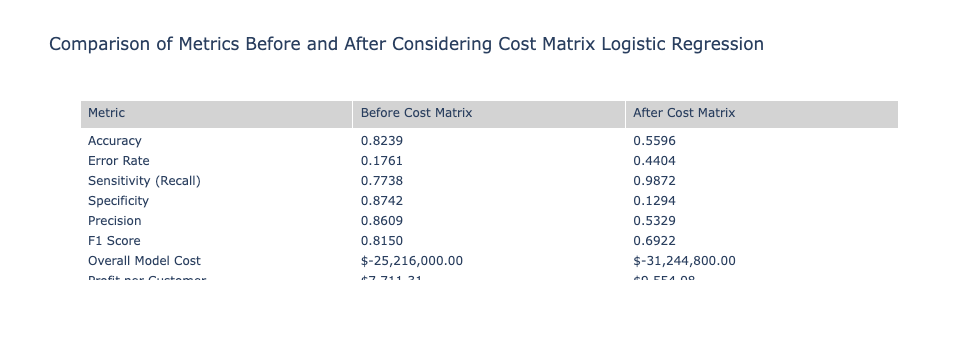

In [101]:


# Combine both metrics into a single DataFrame for comparison
comparison_df_lg = pd.DataFrame({
    'Metric': ['Accuracy', 'Error Rate', 'Sensitivity (Recall)', 'Specificity', 'Precision', 'F1 Score', 'Overall Model Cost', 'Profit per Customer'],
    'Before Cost Matrix': metrics_before_cost_lg_df.squeeze(),
    'After Cost Matrix': metrics_after_cost_lg_df.squeeze()
})


# Create a plotly table
fig = go.Figure(data=[go.Table(
    header=dict(values=['Metric', 'Before Cost Matrix', 'After Cost Matrix'],
                fill_color='lightgrey',
                align='left'),
    cells=dict(values=[comparison_df['Metric'], comparison_df_lg['Before Cost Matrix'], comparison_df_lg['After Cost Matrix']],
               fill_color='white',
               align='left'))
])

fig.update_layout(title_text="Comparison of Metrics Before and After Considering Cost Matrix Logistic Regression")

# Show the table
fig.show()


#### 9.7 | Comparison Cost Funtions Random Forest and Logistic Regression

##### 9.7.1 Logistic Regression Confusion Matrix Before Cost


Metrics before considering cost matrix for Logistic Regression:
                     Logistic Regression
Accuracy                          0.8239
Error Rate                        0.1761
Sensitivity (Recall)              0.7738
Specificity                       0.8742
Precision                         0.8609
F1 Score                          0.8150
Overall Model Cost       $-25,216,000.00
Profit per Customer            $7,711.31


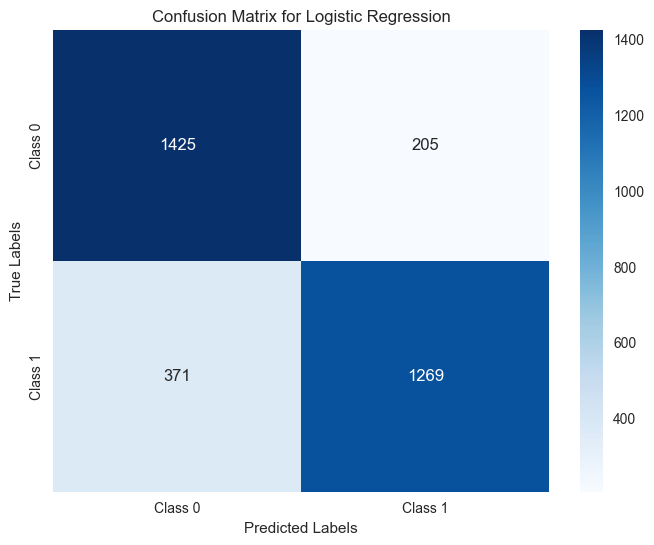

In [102]:

metrics_before_cost_lg_df = pd.DataFrame(metrics_before_cost_lg, index=['Logistic Regression'])
print("\nMetrics before considering cost matrix for Logistic Regression:")
print(metrics_before_cost_lg_df.T)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_lg, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

##### 9.7.2 Logistic Regression After Cost Matrix


Metrics After considering cost matrix for Logistic Regression:
                     Logistic Regression
Accuracy                          0.5596
Error Rate                        0.4404
Sensitivity (Recall)              0.9872
Specificity                       0.1294
Precision                         0.5329
F1 Score                          0.6922
Overall Model Cost       $-31,244,800.00
Profit per Customer            $9,554.98


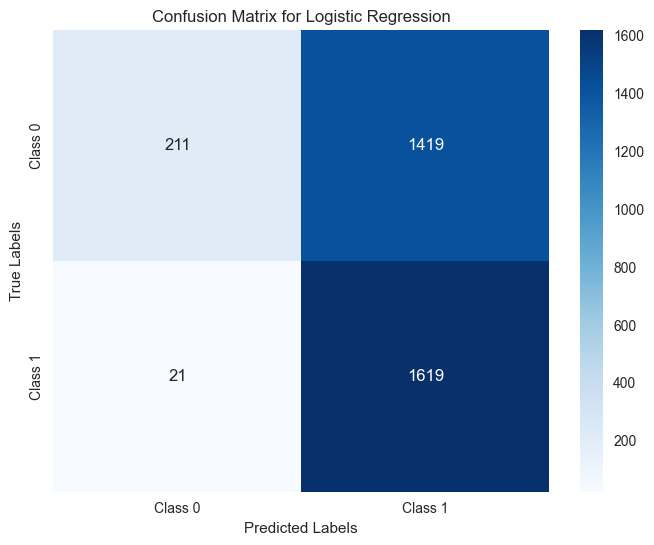

In [103]:

metrics_after_cost_lg_df = pd.DataFrame(metrics_after_cost_lg, index=['Logistic Regression'])
print("\nMetrics After considering cost matrix for Logistic Regression:")
print(metrics_after_cost_lg_df.T)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_lg_cost, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

##### 9.7.3 Random Forest Confusion Bofore Cost Matrix


Metrics before considering cost matrix for Random Forest:
                     Logistic Regression
Accuracy                          0.9006
Error Rate                        0.0994
Sensitivity (Recall)              0.8780
Specificity                       0.9233
Precision                         0.9201
F1 Score                          0.8986
Overall Model Cost       $-28,700,000.00
Profit per Customer            $8,776.76


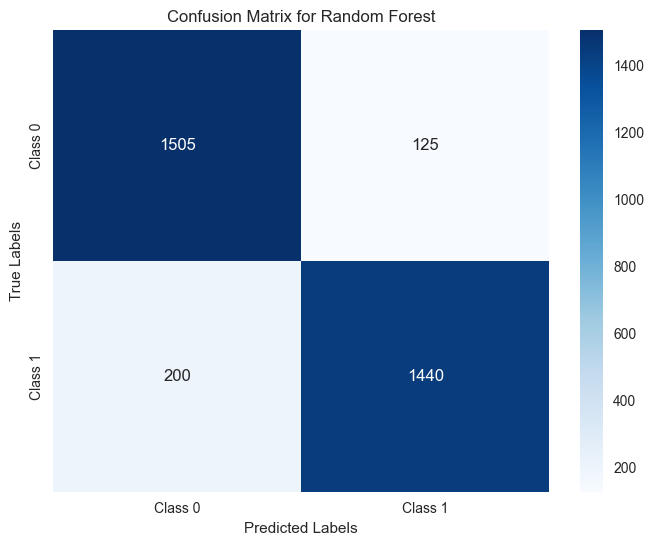

In [104]:

metrics_before_cost = pd.DataFrame(metrics_before_cost, index=['Logistic Regression'])
print("\nMetrics before considering cost matrix for Random Forest:")
print(metrics_before_cost.T)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for Random Forest')
plt.show()

##### 9.7.4 Random Forest After Cost Matrix


Metrics before considering cost matrix for Random Forest:
                     Logistic Regression
Accuracy                          0.7003
Error Rate                        0.2997
Sensitivity (Recall)              0.9756
Specificity                       0.4233
Precision                         0.6299
F1 Score                          0.7656
Overall Model Cost       $-31,248,000.00
Profit per Customer            $9,555.96


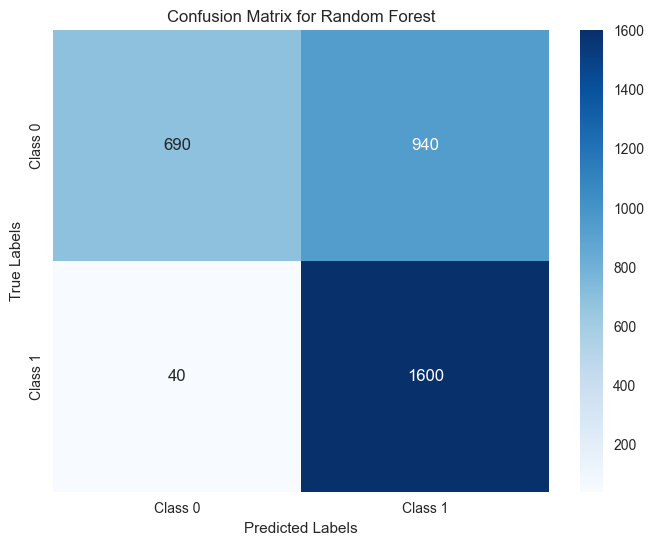

In [105]:
metrics_after_cost = pd.DataFrame(metrics_after_cost, index=['Logistic Regression'])
print("\nMetrics before considering cost matrix for Random Forest:")
print(metrics_after_cost.T)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_rd_cost, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for Random Forest')
plt.show()

# 10. | Conclusions

### 10.1 |  Comparing Logistic Regression and Random Forest for Candidate Job Change Prediction

Every employee departure carries tangible and intangible costs for your organization. The tangible costs include the administrative cost of separation, severance pay and any expenses associated with hiring and training a replacement (Tucker, 2024). The intangible costs of turnover—which many organizations and their leaders fail to consider—include risks like:

- the loss of critical knowledge when veteran employees walk out the door;
- the burden on remaining employees to cover increased workloads until the position is filled; and
- reputational damage if unhappy employees post negative reviews of your company online.

In this evaluation, we compared Logistic Regression and Random Forest models for predicting whether candidates will seek new employment or stay with the current job. Both models were assessed based on their performance metrics before and after incorporating a cost matrix, which helps to understand the trade-offs between various aspects of model performance and associated costs.


**Pre-Cost Matrix Comparison**

**Logistic Regression:**

Accuracy: 0.8239

Error Rate: 0.1761

Sensitivity (Recall): 0.7738

Specificity: 0.8742

Precision: 0.8609

F1 Score: 0.8150

Overall Model Cost: $-25,216,000.00

Profit per Customer: $7,711.31

**Random Forest:**

Accuracy: 0.9006

Error Rate: 0.0994

Sensitivity (Recall): 0.8780

Specificity: 0.9233

Precision: 0.9201

F1 Score: 0.8986

Overall Model Cost: $-28,700,000.00

Profit per Customer: $8,776.76

Before applying the cost matrix, the Random Forest model outperforms Logistic Regression across all key metrics: it achieves higher accuracy, recall, specificity, precision, and F1 Score. This suggests that Random Forest is better at distinguishing between candidates who will seek new employment and those who will stay, thus offering superior predictive performance in this context.

**Post-Cost Matrix Comparison**

**Logistic Regression:**

Accuracy: 0.5596

Error Rate: 0.4404

Sensitivity (Recall): 0.9872

Specificity: 0.1294

Precision: 0.5329

F1 Score: 0.6922

Overall Model Cost: $-31,244,800.00

Profit per Customer: $9,554.98

**Random Forest:**

Accuracy: 0.7003

Error Rate: 0.2997

Sensitivity (Recall): 0.9756

Specificity: 0.4233

Precision: 0.6299

F1 Score: 0.7656

Overall Model Cost: $-31,248,000.00

Profit per Customer: $9,555.96

After accounting for the cost matrix, both models show an increased overall model cost. The Logistic Regression model’s sensitivity (recall) improves significantly, indicating that it captures more candidates who are likely to seek new employment. However, its specificity drops, showing a trade-off between recall and false positive rates. Random Forest maintains a good balance between recall and specificity, but its cost and profit per customer remain close to that of Logistic Regression.

References:
https://hrexecutive.com/3-key-steps-for-using-data-to-address-employee-turnover/#:~:text=Every%20employee%20departure%20carries%20tangible,reviews%20of%20your%20company%20online.

### 10.2 | Final Decision

Given the context of the use case—where the company seeks a balance between predictive performance, cost efficiency, and real-time application—the decision to use Logistic Regression was influenced by several factors:

**Explainability:** Logistic Regression provides more straightforward interpretability compared to Random Forest. This is crucial for understanding how different features impact the decision, which aligns with the company’s need for clarity in model outputs.

**Real-Time Deployment:** Logistic Regression is computationally less intensive and faster to run, making it more suitable for real-time applications where decisions need to be made quickly as candidates apply for training.

**Cost Efficiency:** While Random Forest initially shows better performance metrics, the cost matrix results are similar between the two models. Given the logistic model's simplicity and efficiency in real-time scenarios, it offers a practical balance between performance and operational requirements.

In summary, despite Random Forest's superior accuracy and recall before considering costs, Logistic Regression was chosen for its explainability, efficiency in real-time deployment, and comparable cost metrics after balancing the model's performance with operational needs.

### 10.3 | Deploying and Utilizing the Logistic Regression Model for Improved Candidate Selection and Training Program Efficiency


**Integration into Recruitment Workflow**

**Real-Time Processing:** Integrate the model into the application system to evaluate and prioritize candidates based on their likelihood of seeking new employment.
Enhancing Training Program Efficiency

**Targeted Training:** Use the model's predictions to focus training resources on candidates more likely to stay long-term.
Cost Management and Optimization

**Optimized Resource Allocation:** Allocate training resources efficiently based on candidate retention predictions to reduce costs associated with high turnover.
Monitoring and Evaluation

**Performance Tracking:** Regularly monitor and adjust the model based on its prediction accuracy and actual outcomes to ensure continued effectiveness.
Communication and Training for HR Teams

**Model Overview:** Educate HR teams on the model's functionality and application to effectively utilize its predictions in candidate selection and training.